#imp

In [2]:
import pandas as pd
pd.set_option("max_colwidth", 160)
pd.set_option("display.max_columns", None)

import numpy as np
from sklearn import metrics

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
plt.style.use("seaborn-talk")



def load_data(file_path, indx = True, indx_col = 0):
  '''Parameters:
  file_path: path to your excel or csv file with data,

  indx: boolean - whether there is index column in your file (usually it is the first column) --> *by default it is set to True
  
  indx_col: int - if your file has an index column, specify column number here --> *by default it is equal to 0 (first column)
  '''
  if indx == True and file_path.endswith(".xlsx"):
    data = pd.read_excel(file_path, index_col = indx_col)
  elif indx == False and file_path.endswith(".xlsx"):
    data = pd.read_excel(file_path)

  elif indx == True and file_path.endswith(".csv"):
    data = pd.read_csv(file_path, index_col = indx_col)
  elif indx == False and file_path.endswith(".csv"):
    data = pd.read_csv(file_path)
  return data


In [3]:
from statistics import mean, stdev
from math import sqrt
from sklearn import metrics

def cohend(d1, d2):
 # calculate the size of samples
 n1, n2 = len(d1), len(d2)
 # calculate the variance of the samples
 s1, s2 = np.var(d1, ddof=1), np.var(d2, ddof=1)
 # calculate the pooled standard deviation
 s = np.sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
 # calculate the means of the samples
 u1, u2 = np.mean(d1), np.mean(d2)
 # calculate the effect size
 return (u1 - u2) / s

In [4]:
#!pip install scipy --upgrade
from scipy.stats import ttest_rel, ttest_ind

#load data

In [ ]:
ad1 = '''qualified – unqualified
cosmopolitan – provincial
honest – dishonest
believable – unbelievable 
successful – unsuccessful
attractive – unattractive
sincere – insincere
calm – excitable
unaggressive – aggressive
strong – weak
active – inactive
believer – nonbeliever
sophisticated – unsophisticated
friendly – unfriendly'''.split('\n')

ad2 = [" - ".join(a.split(' – ')[::-1]) for a in ad1]
ad2

['unqualified - qualified',
 'provincial - cosmopolitan',
 'dishonest - honest',
 'unbelievable  - believable',
 'unsuccessful - successful',
 'unattractive - attractive',
 'insincere - sincere',
 'excitable - calm',
 'aggressive - unaggressive',
 'weak - strong',
 'inactive - active',
 'nonbeliever - believer',
 'unsophisticated - sophisticated',
 'unfriendly - friendly']

In [ ]:
import io
from google.colab import files

uploaded = files.upload()

Saving Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx to Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx


In [ ]:
!pip install pyreadstat

In [ ]:
df = pd.read_spss('/content/Zbiór_AMU_Barbara_Konat_v2.sav')
df.shape

(958, 42)

In [ ]:
import pyreadstat

df2, meta = pyreadstat.read_sav('/content/Zbiór_AMU_Barbara_Konat_v2.sav')

In [ ]:
meta

In [ ]:
type(meta)

pyreadstat._readstat_parser.metadata_container

In [ ]:
meta.column_names_to_labels

{'ID': 'Numer ankiety',
 'survey_finish_time': 'Czas trwania ankiety w sekundach',
 'sex': 'Jaka jest Twoja płeć?',
 'sex_r3_input': 'Jaka jest Twoja płeć? - Identyfikuję się w inny sposób, jak?',
 'sex2': 'W jakiej formie wolisz mieć zadawane pytania w tej ankiecie?',
 'age': 'W jakim jesteś wieku?',
 'year': 'Ile dokładnie masz lat?',
 'miasta': 'W jakiej miejscowości mieszkasz?',
 'wyksztalcenie': 'Jakie jest Twoje wykształcenie?',
 'narodowosc': 'Zaznacz swoją narodowość:',
 'grupa': 'Grupa',
 'p3': 'Czy zaprezentowany polityk jest Ci znany?',
 'p4_r1': 'W jakim stopniu zgadzasz się z poglądami {wylosowanego polityka}?',
 'p5_r1': 'Pomiar 1: Profesjonalna - Amatorska',
 'p5_r2': 'Pomiar 1: Otwarta na świat - Prowincjonalna',
 'p5_r3': 'Pomiar 1: Nieuczciwa - Uczciwa',
 'p5_r4': 'Pomiar 1: Wiarygodna - Niewiarygodna',
 'p5_r5': 'Pomiar 1: Skuteczna - Nieskuteczna',
 'p5_r6': 'Pomiar 1: Atrakcyjna - Nieatrakcyjna',
 'p5_r7': 'Pomiar 1: Niepoważna - Poważna',
 'p5_r8': 'Pomiar 1: Spok

In [ ]:
meta.variable_value_labels

{'sex': {1.0: 'Kobieta',
  2.0: 'Mężczyzna',
  3.0: 'Identyfikuję się w inny sposób (jak?)',
  4.0: 'Nie chcę odpowiadać'},
 'sex2': {1.0: 'Żeńskiej', 2.0: 'Męskiej', 99.0: 'uzasadniony brak danych'},
 'age': {1.0: '15-17 lat',
  2.0: '18-24 lata',
  3.0: '25-34 lata',
  4.0: '35-44 lata',
  5.0: '45-54 lata',
  6.0: '55 lat lub więcej'},
 'miasta': {1.0: 'wieś',
  2.0: 'małe miasto (do 20 tys. mieszkańców)',
  3.0: 'średnie miasto (od 20 do 99 tys. mieszkańców)',
  4.0: 'duże miasto (od 100 do 500 tys. mieszkańców)',
  5.0: 'wielkie miasto (powyżej 500 tys. mieszkańców)'},
 'wyksztalcenie': {1.0: 'Podstawowe',
  2.0: 'Zawodowe',
  3.0: 'Średnie (w tym: studiuję)',
  4.0: 'Wyższe'},
 'narodowosc': {1.0: 'polska', 2.0: 'ukraińska', 3.0: 'inna'},
 'grupa': {1.0: 'Krzysztof Bosak - negatywny',
  2.0: 'Krzysztof Bosak - neutralny',
  3.0: 'Krzysztof Bosak - pozytywny',
  4.0: 'Robert Biedroń - negatywny',
  5.0: 'Robert Biedroń - neutralny',
  6.0: 'Robert Biedroń - pozytywny',
  7.0: 'Raf

In [ ]:
print(meta.column_names_to_labels)


{'ID': 'Numer ankiety', 'survey_finish_time': 'Czas trwania ankiety w sekundach', 'sex': 'Jaka jest Twoja płeć?', 'sex_r3_input': 'Jaka jest Twoja płeć? - Identyfikuję się w inny sposób, jak?', 'sex2': 'W jakiej formie wolisz mieć zadawane pytania w tej ankiecie?', 'age': 'W jakim jesteś wieku?', 'year': 'Ile dokładnie masz lat?', 'miasta': 'W jakiej miejscowości mieszkasz?', 'wyksztalcenie': 'Jakie jest Twoje wykształcenie?', 'narodowosc': 'Zaznacz swoją narodowość:', 'grupa': 'Grupa', 'p3': 'Czy zaprezentowany polityk jest Ci znany?', 'p4_r1': 'W jakim stopniu zgadzasz się z poglądami {wylosowanego polityka}?', 'p5_r1': 'Pomiar 1: Profesjonalna - Amatorska', 'p5_r2': 'Pomiar 1: Otwarta na świat - Prowincjonalna', 'p5_r3': 'Pomiar 1: Nieuczciwa - Uczciwa', 'p5_r4': 'Pomiar 1: Wiarygodna - Niewiarygodna', 'p5_r5': 'Pomiar 1: Skuteczna - Nieskuteczna', 'p5_r6': 'Pomiar 1: Atrakcyjna - Nieatrakcyjna', 'p5_r7': 'Pomiar 1: Niepoważna - Poważna', 'p5_r8': 'Pomiar 1: Spokojna - Wybuchowa', '

In [ ]:
pd.DataFrame(meta.variable_value_labels, ).reset_index()#.to_excel('/content/drive/MyDrive/temp_ex2.xlsx') # index = [1,] 

In [ ]:
print(meta.variable_value_labels)


{'sex': {1.0: 'Kobieta', 2.0: 'Mężczyzna', 3.0: 'Identyfikuję się w inny sposób (jak?)', 4.0: 'Nie chcę odpowiadać'}, 'sex2': {1.0: 'Żeńskiej', 2.0: 'Męskiej', 99.0: 'uzasadniony brak danych'}, 'age': {1.0: '15-17 lat', 2.0: '18-24 lata', 3.0: '25-34 lata', 4.0: '35-44 lata', 5.0: '45-54 lata', 6.0: '55 lat lub więcej'}, 'miasta': {1.0: 'wieś', 2.0: 'małe miasto (do 20 tys. mieszkańców)', 3.0: 'średnie miasto (od 20 do 99 tys. mieszkańców)', 4.0: 'duże miasto (od 100 do 500 tys. mieszkańców)', 5.0: 'wielkie miasto (powyżej 500 tys. mieszkańców)'}, 'wyksztalcenie': {1.0: 'Podstawowe', 2.0: 'Zawodowe', 3.0: 'Średnie (w tym: studiuję)', 4.0: 'Wyższe'}, 'narodowosc': {1.0: 'polska', 2.0: 'ukraińska', 3.0: 'inna'}, 'grupa': {1.0: 'Krzysztof Bosak - negatywny', 2.0: 'Krzysztof Bosak - neutralny', 3.0: 'Krzysztof Bosak - pozytywny', 4.0: 'Robert Biedroń - negatywny', 5.0: 'Robert Biedroń - neutralny', 6.0: 'Robert Biedroń - pozytywny', 7.0: 'Rafał Trzaskowski - negatywny', 8.0: 'Rafał Trzasko

In [ ]:
pd.DataFrame(meta.column_names_to_labels, index = ['pytanie',] ).T.reset_index().rename(columns = {'index':'variable'})#.to_excel('/content/drive/MyDrive/temp_ex2.xlsx')

,variable,pytanie
0,ID,Numer ankiety
1,survey_finish_time,Czas trwania ankiety w sekundach
2,sex,Jaka jest Twoja płeć?
3,sex_r3_input,"Jaka jest Twoja płeć? - Identyfikuję się w inny sposób, jak?"
4,sex2,W jakiej formie wolisz mieć zadawane pytania w tej ankiecie?
5,age,W jakim jesteś wieku?
6,year,Ile dokładnie masz lat?
7,miasta,W jakiej miejscowości mieszkasz?
8,wyksztalcenie,Jakie jest Twoje wykształcenie?
9,narodowosc,Zaznacz swoją narodowość:


In [ ]:
df2.to_excel('Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx')

In [ ]:
df.to_excel('Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki_zmapowane.xlsx')

In [ ]:
df # pandas

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 958 entries, 0 to 957
Data columns (total 42 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  958 non-null    float64
 1   survey_finish_time  958 non-null    float64
 2   sex                 958 non-null    float64
 3   sex_r3_input        958 non-null    object 
 4   sex2                1 non-null      float64
 5   age                 958 non-null    float64
 6   year                958 non-null    float64
 7   miasta              958 non-null    float64
 8   wyksztalcenie       958 non-null    float64
 9   narodowosc          958 non-null    float64
 10  grupa               958 non-null    float64
 11  p3                  958 non-null    float64
 12  p4_r1               946 non-null    float64
 13  p5_r1               958 non-null    float64
 14  p5_r2               958 non-null    float64
 15  p5_r3               958 non-null    float64
 16  p5_r4   

In [ ]:
df2.head()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
0,1.0,532.0,1.0,,NaN,6.0,70.0,2.0,3.0,1.0,3.0,1.0,4.0,1.0,3.0,6.0,2.0,2.0,4.0,7.0,3.0,5.0,1.0,7.0,2.0,2.0,3.0,2.0,2.0,3.0,6.0,2.0,2.0,4.0,7.0,3.0,6.0,1.0,7.0,2.0,2.0,2.0
1,2.0,565.0,2.0,,NaN,6.0,62.0,4.0,3.0,1.0,3.0,1.0,3.0,4.0,3.0,4.0,4.0,4.0,5.0,4.0,4.0,5.0,6.0,4.0,3.0,2.0,4.0,2.0,7.0,7.0,1.0,7.0,4.0,6.0,1.0,4.0,4.0,4.0,4.0,4.0,7.0,2.0
2,3.0,444.0,1.0,,NaN,6.0,68.0,4.0,3.0,1.0,7.0,1.0,1.0,5.0,3.0,2.0,7.0,7.0,6.0,4.0,5.0,2.0,3.0,6.0,5.0,4.0,6.0,2.0,5.0,4.0,5.0,3.0,5.0,4.0,5.0,6.0,3.0,5.0,6.0,5.0,5.0,6.0
3,4.0,2558.0,2.0,,NaN,6.0,61.0,1.0,3.0,1.0,8.0,1.0,5.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,2.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0
4,5.0,412.0,2.0,,NaN,3.0,30.0,3.0,2.0,1.0,8.0,1.0,4.0,4.0,4.0,5.0,5.0,5.0,5.0,4.0,4.0,5.0,5.0,4.0,4.0,5.0,5.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0


In [ ]:
df2.columns

Index(['ID', 'survey_finish_time', 'sex', 'sex_r3_input', 'sex2', 'age',
       'year', 'miasta', 'wyksztalcenie', 'narodowosc', 'grupa', 'p3', 'p4_r1',
       'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14', 'p7',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'],
      dtype='object')

In [ ]:
ko = df2[df2.sex == 1]
ko

In [ ]:
df2[ (df2.p3 != 2) & (df2.p4_r1.isna()) ]

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
26,27.0,438.0,1.0,,NaN,5.0,47.0,2.0,4.0,1.0,3.0,1.0,NaN,3.0,3.0,4.0,3.0,4.0,3.0,5.0,2.0,5.0,2.0,5.0,4.0,3.0,2.0,2.0,3.0,3.0,5.0,3.0,4.0,3.0,5.0,2.0,6.0,2.0,5.0,2.0,2.0,3.0
287,288.0,583.0,1.0,,NaN,6.0,83.0,5.0,3.0,1.0,1.0,1.0,NaN,5.0,7.0,1.0,7.0,4.0,7.0,4.0,3.0,4.0,4.0,3.0,3.0,1.0,4.0,2.0,5.0,7.0,3.0,6.0,5.0,7.0,2.0,4.0,1.0,3.0,5.0,4.0,3.0,7.0
357,358.0,625.0,2.0,,NaN,6.0,69.0,2.0,3.0,1.0,1.0,1.0,NaN,6.0,4.0,1.0,7.0,6.0,7.0,2.0,4.0,2.0,6.0,4.0,4.0,7.0,7.0,2.0,6.0,5.0,2.0,7.0,6.0,7.0,1.0,6.0,1.0,6.0,6.0,6.0,6.0,7.0


In [ ]:
df2[ (df2.p3 == 2) & ~(df2.p4_r1.isna()) ]

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
10,11.0,473.0,2.0,,NaN,4.0,44.0,1.0,1.0,1.0,4.0,2.0,3.0,4.0,4.0,1.0,7.0,7.0,4.0,2.0,7.0,2.0,3.0,3.0,1.0,4.0,5.0,1.0,5.0,5.0,2.0,6.0,4.0,4.0,4.0,7.0,2.0,3.0,7.0,2.0,4.0,5.0
16,17.0,9007.0,1.0,,NaN,4.0,36.0,4.0,4.0,1.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,6.0,4.0,2.0,1.0,1.0,1.0,7.0,7.0,7.0,1.0,1.0,7.0,7.0,7.0,1.0,1.0,1.0
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
33,34.0,872.0,1.0,,NaN,4.0,44.0,4.0,3.0,1.0,2.0,2.0,3.0,3.0,3.0,6.0,2.0,3.0,3.0,5.0,3.0,5.0,3.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,5.0,3.0,3.0,3.0,5.0,3.0,5.0,3.0,5.0,4.0,2.0,3.0
39,40.0,449.0,2.0,,NaN,4.0,39.0,3.0,4.0,1.0,3.0,2.0,3.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,5.0,4.0,4.0,3.0,4.0,3.0,5.0,5.0,5.0,3.0,4.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
898,899.0,351.0,2.0,,NaN,2.0,23.0,1.0,3.0,1.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
914,915.0,738.0,2.0,,NaN,6.0,75.0,3.0,4.0,1.0,6.0,2.0,1.0,7.0,7.0,1.0,7.0,7.0,7.0,1.0,7.0,1.0,7.0,1.0,7.0,7.0,7.0,2.0,7.0,7.0,1.0,7.0,7.0,7.0,1.0,7.0,1.0,7.0,1.0,7.0,7.0,7.0
930,931.0,426.0,1.0,,NaN,5.0,51.0,2.0,2.0,1.0,3.0,2.0,4.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,4.0,1.0,5.0,5.0,6.0,5.0,4.0,4.0,1.0,3.0,6.0,5.0,5.0,5.0,5.0,4.0
936,937.0,430.0,1.0,,NaN,4.0,36.0,1.0,2.0,1.0,2.0,2.0,4.0,4.0,5.0,2.0,4.0,3.0,4.0,3.0,5.0,3.0,3.0,4.0,4.0,4.0,2.0,2.0,4.0,4.0,5.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,5.0,5.0,3.0


In [ ]:
df2grupa = df2.groupby(['grupa'], as_index=False)[dyfer].mean().round(2)
df2grupa

,grupa,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
0,1.0,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20,4.38,4.84,3.51,4.54,4.50,4.57,3.51,4.44,3.12,4.35,4.18,3.84,4.07,4.83
1,2.0,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15,3.92,4.38,3.84,4.25,3.94,4.25,3.94,3.82,3.82,3.84,4.55,3.04,3.82,4.31
2,3.0,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12,4.01,4.08,3.79,4.25,4.23,4.32,3.94,3.68,4.05,3.96,4.23,3.05,3.94,3.85
3,4.0,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76,4.16,3.92,3.61,4.43,4.37,4.54,3.48,4.30,3.49,4.24,4.38,5.01,4.53,4.33
4,5.0,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13,3.43,2.90,4.41,3.64,3.80,3.70,4.21,3.13,4.79,3.64,4.65,4.86,4.42,3.20
5,6.0,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50,3.53,3.10,4.52,3.63,3.87,3.78,4.46,3.17,4.73,3.73,4.60,4.44,4.15,3.29
6,7.0,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50,3.44,3.40,4.47,3.51,3.62,3.53,4.73,3.70,4.14,3.49,4.61,4.12,3.90,3.69
7,8.0,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65,3.19,3.02,4.40,3.56,3.47,3.40,4.60,3.44,4.45,3.40,4.75,4.07,3.98,3.38
8,9.0,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61,3.06,2.87,4.69,3.37,3.25,3.26,4.72,3.43,4.64,3.17,5.02,3.88,4.05,3.21


In [ ]:
df2grupa.columns

Index(['grupa', 'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7',
       'p5_r8', 'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'],
      dtype='object')

In [ ]:
c1 = ['p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7',
       'p5_r8', 'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14']
c2 = ['p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']       
list(zip(c1, c2))

[('p5_r1', 'p9_r1'),
 ('p5_r2', 'p9_r2'),
 ('p5_r3', 'p9_r3'),
 ('p5_r4', 'p9_r4'),
 ('p5_r5', 'p9_r5'),
 ('p5_r6', 'p9_r6'),
 ('p5_r7', 'p9_r7'),
 ('p5_r8', 'p9_r8'),
 ('p5_r9', 'p9_r9'),
 ('p5_r10', 'p9_r10'),
 ('p5_r11', 'p9_r11'),
 ('p5_r12', 'p9_r12'),
 ('p5_r13', 'p9_r13'),
 ('p5_r14', 'p9_r14')]

In [ ]:
cc = [('p5_r1', 'p9_r1'),
      ('p5_r2', 'p9_r2'),
      ('p5_r3', 'p9_r3'),
      ('p5_r4', 'p9_r4'),
      ('p5_r5', 'p9_r5'),
      ('p5_r6', 'p9_r6'),
      ('p5_r7', 'p9_r7'),
      ('p5_r8', 'p9_r8'),
      ('p5_r9', 'p9_r9'),
      ('p5_r10', 'p9_r10'),
      ('p5_r11', 'p9_r11'),
      ('p5_r12', 'p9_r12'),
      ('p5_r13', 'p9_r13'),
      ('p5_r14', 'p9_r14')]

In [ ]:
cc[0][0][-3:]

'_r1'

In [ ]:
for c in cc:
  df2grupa['diff'+c[0][-3:]] = df2grupa[c[-1]] = df2grupa[c[0]]

df2grupa

,grupa,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diffr10,diffr11,diffr12,diffr13,diffr14
0,1.0,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20
1,2.0,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15
2,3.0,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12
3,4.0,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76
4,5.0,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13
5,6.0,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50
6,7.0,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50
7,8.0,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65
8,9.0,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61


In [ ]:
df2grupa.filter(regex= 'p9_').columns

Index(['p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'],
      dtype='object')

In [ ]:
cols4 = ['grupa', 
         'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'
         ]

df2grupa_mpo = df2grupa[cols4].melt('grupa')
df2grupa_mpo['time'] = 'po'
df2grupa_mpo.head(2)         

,grupa,variable,value,time
0,1.0,p9_r1,4.38,po
1,2.0,p9_r1,3.92,po


In [ ]:
cols4 = ['grupa', 
         'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14'
         ]

df2grupa_mprzed = df2grupa[cols4].melt('grupa')
df2grupa_mprzed['time'] = 'przed'
df2grupa_mprzed.head(2)         

,grupa,variable,value,time
0,1.0,p5_r1,4.16,przed
1,2.0,p5_r1,3.97,przed


In [ ]:
df2grupa_m = pd.concat([df2grupa_mprzed, df2grupa_mpo], axis = 0, ignore_index = True)
df2grupa_m.sample(3)

,grupa,variable,value,time
157,5.0,p9_r4,3.64,po
34,8.0,p5_r4,3.62,przed
123,7.0,p5_r14,3.50,przed


In [ ]:
cols4 = ['grupa', 'diff_r1', 'diff_r2', 'diff_r3', 'diff_r4', 'diff_r5', 'diff_r6',
       'diff_r7', 'diff_r8', 'diff_r9', 'diffr10', 'diffr11', 'diffr12',
       'diffr13', 'diffr14']

In [ ]:
df2grupa_m = df2grupa[cols4].melt('grupa')
df2grupa_m.head(2)

,grupa,variable,value
0,1.0,diff_r1,4.16
1,2.0,diff_r1,3.97


In [ ]:
df2grupa_m['kind'] = df2grupa_m.grupa.map({1:'neg',2:'neu',3:'pos',4:'neg',5:'neu',6:'pos',7:'neg',8:'neu',9:'pos'})

In [ ]:
df2grupa_m['item'] = df2grupa_m.variable.str.replace('p5_', '').str.replace('p9_', '')

In [ ]:
df2grupa_m['polityk'] = df2grupa_m.grupa.map({1:'KB',2:'KB',3:'KB',4:'RB',5:'RB',6:'RB',7:'RT',8:'RT',9:'RT'})

In [ ]:
df2grupa_m['tweet'] = df2grupa_m['polityk'] + " " + df2grupa_m['kind']

In [ ]:
df2grupa_m['tweet2'] = df2grupa_m['tweet'] + " " + df2grupa_m['time']

In [ ]:
df2grupa_m.item.unique()

array(['r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9', 'r10', 'r11',
       'r12', 'r13', 'r14'], dtype=object)

In [ ]:
item_map = {
    'r1': 'Amatorska', 'r2': 'Prowincjonalna', 'r3': 'Uczciwa', 'r4': 'Niewiarygodna', 
    'r5': 'Nieskuteczna', 'r6': 'Nieatrakcyjna', 'r7': 'Poważna', 'r8': 'Wybuchowa', 
    'r9': 'Łagodna', 'r10': 'Słaba', 'r11': 'Aktywna',
       'r12': 'Niewierząca', 'r13': 'Niekonwencjonalna', 'r14': 'Wroga'
}

In [ ]:
df2grupa_m.item = df2grupa_m.item.map(item_map)

In [ ]:
df2grupa_m.tail()

,grupa,variable,value,time,kind,item,polityk,tweet,tweet2
247,5.0,p9_r14,3.20,po,neu,Wroga,RB,RB neu,RB neu po
248,6.0,p9_r14,3.29,po,pos,Wroga,RB,RB pos,RB pos po
249,7.0,p9_r14,3.69,po,neg,Wroga,RT,RT neg,RT neg po
250,8.0,p9_r14,3.38,po,neu,Wroga,RT,RT neu,RT neu po
251,9.0,p9_r14,3.21,po,pos,Wroga,RT,RT pos,RT pos po


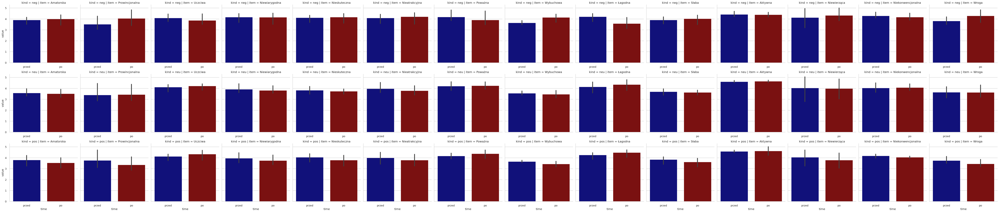

In [ ]:
sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
            row = 'kind', dodge=False, sharex=False, x = 'time', hue = 'time',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 
plt.tight_layout()
plt.show()

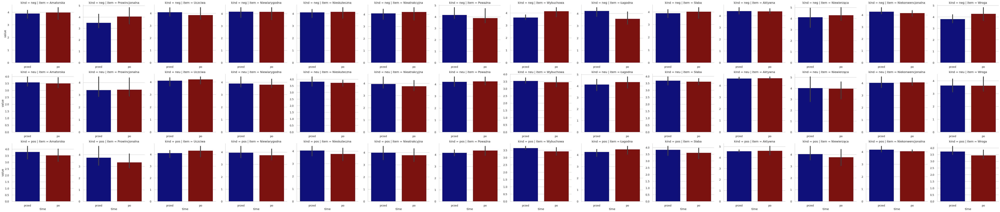

In [ ]:
sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
            row = 'kind', dodge=False, sharex=False, sharey=False, x = 'time', hue = 'time',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 
plt.tight_layout()
plt.show()

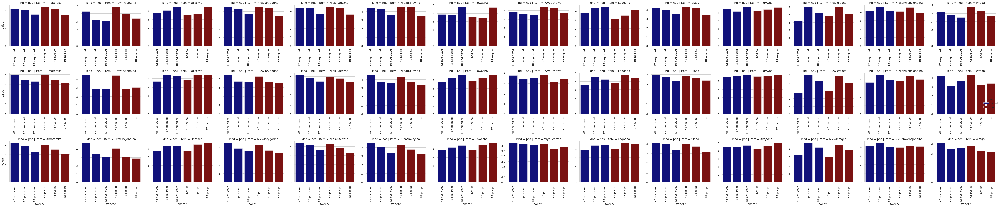

In [ ]:
g = sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
             dodge=False, sharex=False, sharey=False, x = 'tweet2', hue = 'time', row = 'kind',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 

g.set_xticklabels(rotation=90)


plt.tight_layout(pad = 1.5)
plt.show()

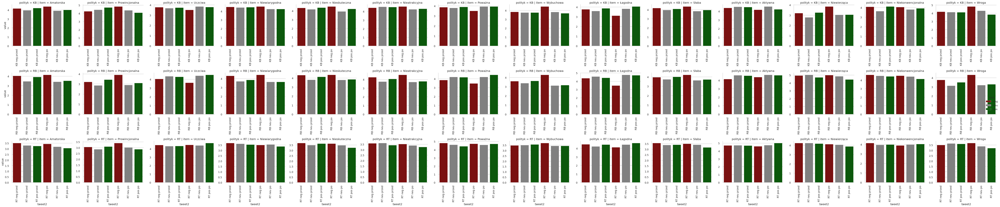

In [ ]:
g = sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
             dodge=False, sharex=False, sharey=False, x = 'tweet2', hue = 'kind', row = 'polityk',
            palette = {'neg':'darkred', 'neu':'grey', "pos":'darkgreen'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 

g.set_xticklabels(rotation=90)
g.set_xlabel('tweet')


plt.tight_layout(pad = 1.5)
plt.show()

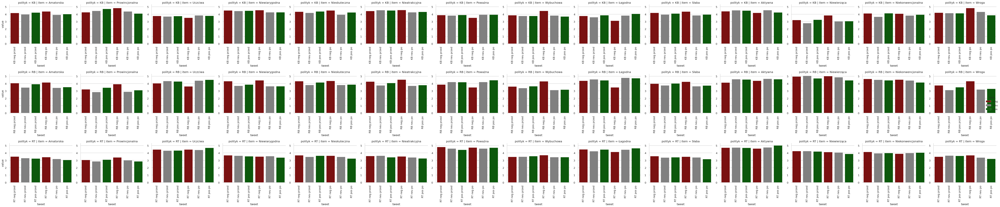

In [ ]:
g = sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
             dodge=False, sharex=False, x = 'tweet2', hue = 'kind', row = 'polityk',
            palette = {'neg':'darkred', 'neu':'grey', "pos":'darkgreen'}) 
# palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 

g.set(xlabel = 'tweet')
g.set_xticklabels(rotation=90)

for ax in g.axes.flatten():
    ax.tick_params(labelleft=True) 
    # https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.tick_params.html#matplotlib.axes.Axes.tick_params


plt.tight_layout(pad = 1.5)
plt.show()

In [ ]:
sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
            row = 'tweet', dodge=False, sharex=False, sharey=False, x = 'time', hue = 'time',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 
plt.tight_layout()
plt.show()

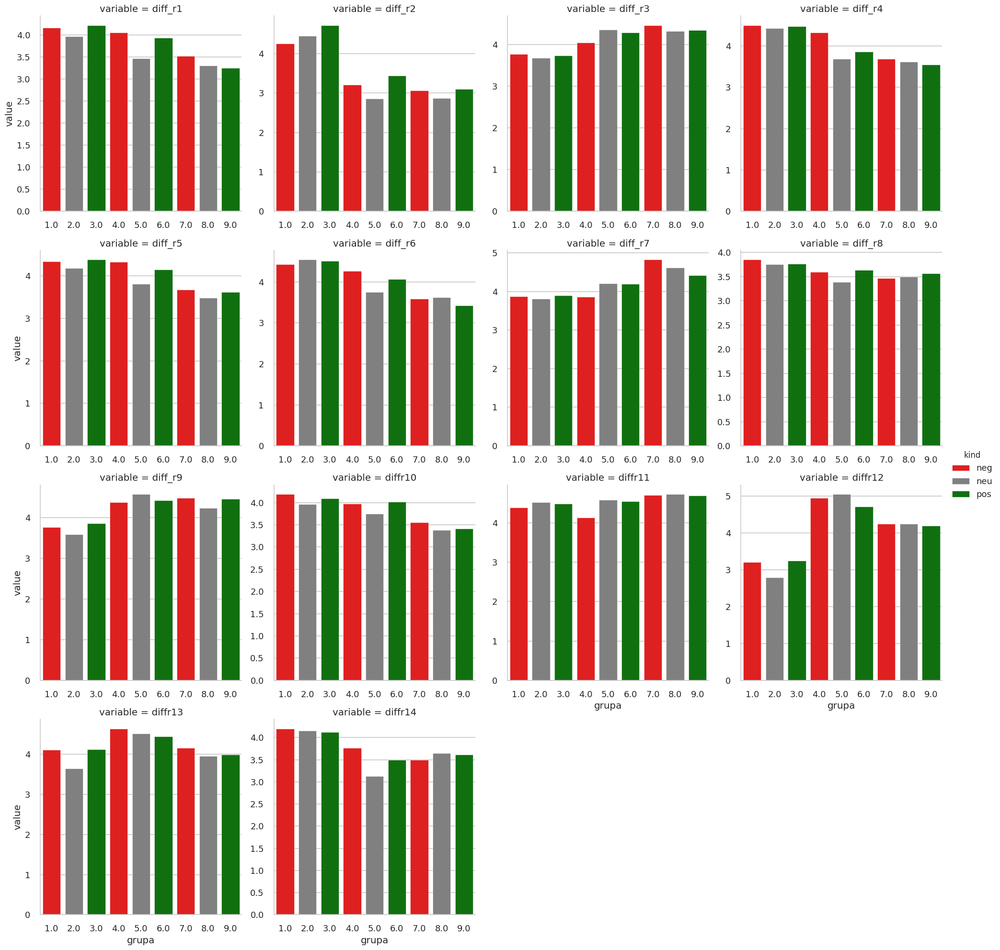

In [ ]:
sns.catplot(kind = 'bar', data =df2grupa_m, col = 'variable', y = 'value', 
            x = 'grupa', col_wrap = 4, dodge=False, sharex=False, sharey=False, hue = 'kind', 
            palette = {'neg':'red', 'neu':'grey', "pos":'green'})# hue = 'grupa'
plt.show()

##reliability of data from Ardiana

In [ ]:
df2.p3.fillna(99).value_counts()

1.0    865
2.0     93
Name: p3, dtype: int64

In [ ]:
df2.p4_r1.fillna(99).value_counts()

3.0     310
1.0     215
4.0     179
2.0     147
5.0      95
99.0     12
Name: p4_r1, dtype: int64

In [ ]:
dyfer = [
    'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']

In [ ]:
df2['variance'] = df2[dyfer].var(axis = 1)
df2['variance'].describe([0.05, 0.075, 0.1, 0.25, 0.5])

count    958.000000
mean       2.845191
std        2.475471
min        0.000000
5%         0.000000
7.5%       0.035714
10%        0.166931
25%        0.714616
50%        2.179894
max        9.333333
Name: variance, dtype: float64

In [ ]:
df2[df2.variance.round(1) < 0.17].shape

(94, 43)

In [ ]:
df2[df2.variance.round(1) < 0.17].sample(5)

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
587,588.0,405.0,2.0,,NaN,6.0,59.0,4.0,3.0,1.0,1.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
582,583.0,427.0,1.0,,NaN,4.0,37.0,2.0,4.0,1.0,6.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
421,422.0,480.0,2.0,,NaN,2.0,24.0,3.0,3.0,1.0,3.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
598,599.0,431.0,2.0,,NaN,5.0,48.0,1.0,2.0,1.0,3.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
591,592.0,391.0,1.0,,NaN,4.0,37.0,1.0,3.0,1.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.035714


In [ ]:
df2[df2.variance.round(1) < 0.04].shape

(77, 43)

In [ ]:
df2[df2.variance.round(1) == 0].shape

(77, 43)

In [ ]:
sus = df2[df2.variance.round(1) == 0]
sus

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
24,25.0,796.0,2.0,,NaN,4.0,39.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
68,69.0,1516.0,1.0,,NaN,6.0,61.0,1.0,4.0,1.0,7.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
85,86.0,428.0,1.0,,NaN,3.0,34.0,1.0,3.0,1.0,3.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,0.035714
101,102.0,616.0,1.0,,NaN,5.0,51.0,4.0,3.0,1.0,2.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
883,884.0,417.0,2.0,,NaN,4.0,38.0,4.0,3.0,1.0,1.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
891,892.0,515.0,1.0,,NaN,2.0,22.0,3.0,4.0,1.0,5.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
898,899.0,351.0,2.0,,NaN,2.0,23.0,1.0,3.0,1.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
901,902.0,367.0,1.0,,NaN,5.0,51.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000


In [ ]:
cols = ['sex', 'age', 'miasta', 'wyksztalcenie', 'p4_r1', 'p5_r1','p5_r2','p5_r3','p5_r4','p5_r5','p5_r6','p5_r7','p5_r8','p5_r9',
 'p5_r10','p5_r11','p5_r12','p5_r13','p5_r14','p9_r1','p9_r2','p9_r3','p9_r4','p9_r5',
 'p9_r6','p9_r7','p9_r8','p9_r9','p9_r10','p9_r11','p9_r12','p9_r13','p9_r14']

In [ ]:
sus_g1 = sus.groupby(cols, as_index=False).size().sort_values(by = 'size', ascending=False)
sus_g1

,sex,age,miasta,wyksztalcenie,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,size
31,2.0,2.0,1.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3
13,1.0,4.0,2.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
41,2.0,3.0,2.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
22,1.0,6.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
44,2.0,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27,1.0,6.0,3.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1
28,1.0,6.0,3.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1
29,1.0,6.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1
30,1.0,6.0,5.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1


In [ ]:
sus_g1[sus_g1['size']>1]

,sex,age,miasta,wyksztalcenie,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,size
31,2.0,2.0,1.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3
13,1.0,4.0,2.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
41,2.0,3.0,2.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
22,1.0,6.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
44,2.0,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
47,2.0,4.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
34,2.0,2.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
2,1.0,2.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
60,2.0,6.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2


In [ ]:
77*100/958

8.037578288100208

In [ ]:
cols2 = ['ID', 'p5_r1','p5_r2','p5_r3','p5_r4','p5_r5','p5_r6','p5_r7','p5_r8','p5_r9',
 'p5_r10','p5_r11','p5_r12','p5_r13','p5_r14','p9_r1','p9_r2','p9_r3','p9_r4','p9_r5',
 'p9_r6','p9_r7','p9_r8','p9_r9','p9_r10','p9_r11','p9_r12','p9_r13','p9_r14']

In [ ]:
df2.sample()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
628,629.0,407.0,1.0,,NaN,6.0,56.0,4.0,3.0,1.0,3.0,2.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.328042


In [ ]:
dyfer_dict_abs = {}

In [ ]:
for p in dyfer:
  df2p = pd.DataFrame( abs(df2[p].values - df2[p].values[:, None]) )
  dyfer_dict_abs[p] = df2p.reset_index()

In [ ]:
df2p_all = pd.concat(dyfer_dict_abs.values(), axis = 0, ignore_index=True)
df2p_all

index    0    1    2    3    4    5    6    7    8    9   10   11   12  \
0          0  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
1          1  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
2          2  4.0  1.0  0.0  4.0  1.0  3.0  1.0  3.0  1.0  1.0  1.0  4.0  1.0   
3          3  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
4          4  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
...      ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819    953  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26820    954  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   
26821    955  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26822    956  0.0  0.0  4.0  1.0  2.0  1.0  5.0  1.0  1.0  4.0  3.0  1.0  1.0   
26823    957  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   

        13   14   15   16   17   18   19   20   21   22   23   24   25   26  \
0      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
1      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
2      2.0  2.0  1.0  1.0  2.0  3.0  1.0  3.0  4.0  2.0  0.0  1.0  1.0  2.0   
3      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
4      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26820  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   
26821  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26822  1.0  5.0  0.0  1.0  3.0  0.0  2.0  2.0  1.0  3.0  5.0  2.0  1.0  1.0   
26823  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   

        27   28   29   30   31   32   33   34   35   36   37   38   39   40  \
0      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
1      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
2      3.0  2.0  2.0  1.0  2.0  2.0  2.0  1.0  3.0  2.0  1.0  1.0  1.0  1.0   
3      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
4      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26820  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   
26821  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26822  1.0  5.0  3.0  1.0  5.0  2.0  1.0  1.0  1.0  5.0  2.0  2.0  1.0  5.0   
26823  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   

        41   42   43   44   45   46   47   48   49   50   51   52   53   54  \
0      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
1      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
2      0.0  2.0  2.0  4.0  2.0  4.0  1.0  1.0  1.0  1.0  1.0  1.0  3.0  1.0   
3      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
4      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26820  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   
26821  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26822  4.0  0.0  2.0  0.0  0.0  1.0  3.0  2.0  2.0  4.0  1.0  2.0  0.0  4.0   
26823  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   

        55   56   57   58   59   60   61   62   63   64   65   66   67   68  \
0      0.0  5.0  0.0  1.0  3.0  6.0  4.0  3.0  0.0  3.0  4.0  4.0  5.0  3.0   
1      3.0  2.0  3.0  2.0  0.

In [ ]:
df2p_all = df2p_all.rename(columns = {'index':'id'})
df2p_all

id    0    1    2    3    4    5    6    7    8    9   10   11   12  \
0        0  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
1        1  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
2        2  4.0  1.0  0.0  4.0  1.0  3.0  1.0  3.0  1.0  1.0  1.0  4.0  1.0   
3        3  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
4        4  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  953  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26820  954  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   
26821  955  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26822  956  0.0  0.0  4.0  1.0  2.0  1.0  5.0  1.0  1.0  4.0  3.0  1.0  1.0   
26823  957  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   

        13   14   15   16   17   18   19   20   21   22   23   24   25   26  \
0      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
1      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
2      2.0  2.0  1.0  1.0  2.0  3.0  1.0  3.0  4.0  2.0  0.0  1.0  1.0  2.0   
3      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
4      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26820  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   
26821  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26822  1.0  5.0  0.0  1.0  3.0  0.0  2.0  2.0  1.0  3.0  5.0  2.0  1.0  1.0   
26823  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   

        27   28   29   30   31   32   33   34   35   36   37   38   39   40  \
0      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
1      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
2      3.0  2.0  2.0  1.0  2.0  2.0  2.0  1.0  3.0  2.0  1.0  1.0  1.0  1.0   
3      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
4      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26820  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   
26821  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26822  1.0  5.0  3.0  1.0  5.0  2.0  1.0  1.0  1.0  5.0  2.0  2.0  1.0  5.0   
26823  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   

        41   42   43   44   45   46   47   48   49   50   51   52   53   54  \
0      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
1      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
2      0.0  2.0  2.0  4.0  2.0  4.0  1.0  1.0  1.0  1.0  1.0  1.0  3.0  1.0   
3      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
4      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26820  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   
26821  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26822  4.0  0.0  2.0  0.0  0.0  1.0  3.0  2.0  2.0  4.0  1.0  2.0  0.0  4.0   
26823  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   

        55   56   57   58   59   60   61   62   63   64   65   66   67   68  \
0      0.0  5.0  0.0  1.0  3.0  6.0  4.0  3.0  0.0  3.0  4.0  4.0  5.0  3.0   
1      3.0  2.0  3.0  2.0  0.0  3.0  1.0  0.0  3.0  0.

In [ ]:
df2p_all_idsum = df2p_all.groupby('id', as_index = False).sum()
df2p_all_idavg = df2p_all.groupby('id', as_index = False).mean()

#df2p_all_idsum

In [ ]:
df2p_all_idavg.iloc[:2, 1:]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957
0,0.000000,2.464286,2.535714,1.107143,2.035714,0.892857,2.535714,1.178571,1.678571,2.428571,2.678571,1.428571,1.607143,1.428571,3.321429,1.642857,2.357143,3.821429,0.821429,1.892857,1.464286,1.464286,1.857143,3.928571,1.892857,1.428571,1.107143,1.607143,4.250000,2.107143,2.142

In [ ]:
df2[df2.ID.isin([ 4,22 ])]

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
3,4.0,2558.0,2.0,,NaN,6.0,61.0,1.0,3.0,1.0,8.0,1.0,5.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,2.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,7.619048
21,22.0,438.0,2.0,,NaN,5.0,50.0,3.0,4.0,1.0,8.0,1.0,5.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,1.0,1.0,7.619048


In [ ]:
df2p_all_idavg = df2p_all_idavg.round()#.applymap(lambda x: np.floor(x))

In [ ]:
df2p_all_idsum.tail(2)

,id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957
956,956,41.0,58.0,60.0,54.0,38.0,32.0,74.0,42.0,36.0,61.0,70.0,51.0,34.0,25.0,90.0,33.0,57.0,88.0,30.0,34.0,36.0,54.0,39.0,95.0,34.0,43.0,24.0,34.0,106.0,48.0,45.0,114.0,31.0,24.0,33.0,34.0,104.0,56.0,32.0,33.0,104.0,64.0,22.0,38.0,28.0,35.0,39.0,39.0,36.0,47.0,72.0,31.0,38

In [ ]:
df2p_all_idsum_valcont = df2p_all_idsum.iloc[:, 1:].apply(pd.Series.value_counts, axis=1)#.fillna(0)
df2p_all_idsum_valcont

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,164.0,165.0,166.0,167.0,168.0
0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,1.0,2.0,3.0,2.0,7.0,7.0,8.0,8.0,6.0,8.0,7.0,11.0,26.0,18.0,19.0,7.0,22.0,18.0,14.0,18.0,21.0,18.0,22.0,11.0,15.0,16.0,21.0,18.0,16.0,13.0,14.0,13.0,21.0,20.0,74.0,22.0,21.0,16.0,19.0,8.0,17.0,16.0,7.0,9.0,9.0,12.0,6.0,7.0,6.0,11.0,8.0,8.0,6.0,7.0,6.0,3.0,9.0,2.0,3.0,9.0,2.0,2.0,6.0,3.0,4.0,4.0,4.0,3.0,4.0,2.0,7.0,3.0,4.0,4.0,3.0,3.0,4.0,4.0,1.0,1.0,6.0,1.0,4.0,3.0,1.0,2.0,5.0,4.0,6.0,1.0,6.0,5.0,1.0,2.0,5.0,6.0,1.0,1.0,4.0,1.0,4.0,1.0,3.0,2.0,1.0,NaN,5.0,NaN,3.0,NaN,4.0,3.0,3.0,NaN,2.0,1.0,1.0,1.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,2.0,6.0,70.0,13.0,22.0,14.0,18.0,18.0,19.0,22.0,23.0,15.0,31.0,29.0,25.0,22.0,24.0,20.0,25.0,21.0,17.0,19.0,11.0,24.0,17.0,21.0,17.0,13.0,18.0,15.0,24.0,14.0,12.0,11.0,19.0,10.0,14.0,15.0,15.0,9.0,25.0,7.0,8.0,6.0,6.0,9.0,9.0,4.0,3.0,6.0,9.0,4.0,5.0,6.0,1.0,4.0,4.0,4.0,8.0,3.0,6.0,2.0,10.0,4.0,2.0,3.0,8.0,1.0,4.0,7.0,3.0,1.0,14.0,1.0,2.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,4.0,7.0,9.0,14.0,10.0,17.0,28.0,91.0,29.0,25.0,23.0,27.0,24.0,26.0,23.0,26.0,24.0,15.0,23.0,26.0,20.0,18.0,17.0,19.0,21.0,22.0,13.0,23.0,13.0,21.0,15.0,18.0,15.0,11.0,8.0,8.0,11.0,29.0,8.0,12.0,5.0,9.0,7.0,7.0,12.0,6.0,1.0,7.0,2.0,6.0,5.0,2.0,7.0,3.0,4.0,6.0,4.0,6.0,1.0,4.0,NaN,4.0,2.0,5.0,8.0,1.0,NaN,7.0,3.0,2.0,1.0,4.0,2.0,13.0,1.0,4.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,12.0,1.0,NaN,1.0,NaN,NaN,9.0,NaN,NaN,4.0,2.0,1.0,4.0,2.0,NaN,2.0,3.0,2.0,8.0,2.0,1.0,3.0,5.0,NaN,6.0,1.0,4.0,5.0,5.0,3.0,8.0,4.0,4.0,5.0,3.0,5.0,3.0,11.0,7.0,9.0,4.0,5.0,3.0,6.0,6.0,4.0,8.0,7.0,9.0,9.0,5.0,5.0,9.0,5.0,6.0,6.0,7.0,6.0,6.0,7.0,10.0,8.0,5.0,5.0,5.0,2.0,10.0,5.0,11.0,13.0,10.0,4.0,13.0,6.0,13.0,9.0,9.0,15.0,16.0,16.0,9.0,16.0,16.0,20.0,78.0,16.0,24.0,14.0,13.0,12.0,5.0,15.0,5.0,10.0,7.0,9.0,3.0,5.0,6.0,8.0,4.0,6.0,7.0,5.0,5.0,4.0,6.0,NaN,2.0,5.0,2.0,NaN,5.0,6.0,5.0,3.0,5.0,NaN,6.0,3.0,7.0,1.0,3.0,4.0,1.0,3.0,5.0,1.0,3.0,4.0,4.0,1.0,2.0,1.0,4.0,3.0,4.0,5.0,6.0,2.0,3.0,3.0,NaN,3.0,7.0,2.0,1.0,3.0,2.0,NaN,4.0,NaN,3.0,2.0,NaN,NaN,11.0,NaN,1.0,NaN,NaN,3.0,4.0,NaN,1.0,1.0,NaN,1.0,16.0
4,1.0,NaN,NaN,NaN,NaN,NaN,4.0,3.0,65.0,14.0,10.0,4.0,11.0,11.0,10.0,10.0,14.0,15.0,18.0,21.0,16.0,21.0,17.0,15.0,15.0,12.0,19.0,10.0,17.0,7.0,15.0,13.0,15.0,18.0,11.0,11.0,16.0,12.0,14.0,22.0,14.0,17.0,13.0,8.0,16.0,12.0,8.0,11.0,10.0,9.0,18.0,13.0,9

In [ ]:
df2p_all_idavg_valcont = df2p_all_idavg.iloc[:, 1:].apply(pd.Series.value_counts, axis=1)#.fillna(0)
df2p_all_idavg_valcont

,0.0,1.0,2.0,3.0,4.0,5.0,6.0
0,1.0,275.0,454.0,112.0,82.0,34.0,NaN
1,1.0,304.0,492.0,138.0,23.0,NaN,NaN
2,1.0,310.0,499.0,120.0,28.0,NaN,NaN
3,36.0,118.0,198.0,378.0,117.0,73.0,38.0
4,133.0,405.0,296.0,124.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...
953,1.0,160.0,605.0,191.0,1.0,NaN,NaN
954,83.0,424.0,313.0,138.0,NaN,NaN,NaN
955,1.0,434.0,378.0,145.0,NaN,NaN,NaN
956,1.0,512.0,282.0,104.0,59.0,NaN,NaN


In [ ]:
ids_check = np.asarray( df2p_all_idsum_valcont[df2p_all_idsum_valcont[0.0] > 1 ].index ) + 1
ids_check[:4]

array([ 4, 20, 25, 32])

In [ ]:
ids_check

array([  4,  20,  25,  32,  44,  69,  78, 101, 102, 109, 156, 171, 187,
       209, 217, 219, 224, 241, 253, 278, 296, 316, 326, 334, 344, 357,
       380, 385, 394, 408, 411, 417, 422, 425, 426, 441, 446, 460, 464,
       471, 472, 473, 475, 483, 486, 516, 526, 532, 573, 580, 583, 585,
       588, 597, 599, 600, 603, 605, 615, 617, 622, 643, 654, 666, 679,
       686, 690, 694, 698, 703, 705, 723, 726, 728, 729, 730, 732, 742,
       746, 750, 768, 785, 794, 798, 807, 812, 824, 835, 837, 848, 853,
       854, 857, 881, 883, 884, 887, 892, 899, 902, 915, 925, 929, 936])

In [ ]:
df2_ch = df2[df2.ID.isin(ids_check)]
df2_ch.shape

(104, 43)

In [ ]:
df2['variance'].describe()

count    958.000000
mean       2.845191
std        2.475471
min        0.000000
25%        0.714616
50%        2.179894
75%        4.618717
max        9.333333
Name: variance, dtype: float64

In [ ]:
df2_ch = df2_ch[df2_ch.variance.round(2) < 0.72] # 25th perc
df2_ch.shape

(69, 43)

In [ ]:
df2_ch.ID.values

array([ 20.,  25.,  44.,  69., 102., 109., 156., 171., 209., 217., 224.,
       253., 278., 296., 316., 326., 334., 344., 394., 408., 417., 422.,
       426., 446., 460., 464., 472., 475., 483., 526., 532., 580., 583.,
       585., 588., 599., 603., 605., 617., 622., 643., 654., 666., 679.,
       686., 690., 694., 698., 723., 726., 728., 729., 730., 732., 742.,
       750., 768., 798., 812., 824., 848., 853., 857., 881., 883., 884.,
       892., 899., 902.])

In [ ]:
df2_ch.head()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
24,25.0,796.0,2.0,,NaN,4.0,39.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
43,44.0,352.0,2.0,,NaN,3.0,32.0,1.0,2.0,1.0,9.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.259259
68,69.0,1516.0,1.0,,NaN,6.0,61.0,1.0,4.0,1.0,7.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
101,102.0,616.0,1.0,,NaN,5.0,51.0,4.0,3.0,1.0,2.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000


In [ ]:
df2_ch

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
24,25.0,796.0,2.0,,NaN,4.0,39.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
43,44.0,352.0,2.0,,NaN,3.0,32.0,1.0,2.0,1.0,9.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.259259
68,69.0,1516.0,1.0,,NaN,6.0,61.0,1.0,4.0,1.0,7.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
101,102.0,616.0,1.0,,NaN,5.0,51.0,4.0,3.0,1.0,2.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
882,883.0,908.0,1.0,,NaN,6.0,59.0,1.0,2.0,1.0,8.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
883,884.0,417.0,2.0,,NaN,4.0,38.0,4.0,3.0,1.0,1.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
891,892.0,515.0,1.0,,NaN,2.0,22.0,3.0,4.0,1.0,5.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
898,899.0,351.0,2.0,,NaN,2.0,23.0,1.0,3.0,1.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000


In [ ]:
cols3 =  ['sex', 'age', 'p5_r1','p5_r2','p5_r3','p5_r4','p5_r5','p5_r6','p5_r7','p5_r8','p5_r9',
 'p5_r10','p5_r11','p5_r12','p5_r13','p5_r14','p9_r1','p9_r2','p9_r3','p9_r4','p9_r5',
 'p9_r6','p9_r7','p9_r8','p9_r9','p9_r10','p9_r11','p9_r12','p9_r13','p9_r14'    
]

In [ ]:
df2_chs = df2_ch.groupby(cols3, as_index = False).size().sort_values(by = 'size', ascending = False)
df2_chs

,sex,age,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,size
12,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,9
6,1.0,6.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,8
3,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,7
4,1.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,7
8,2.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,7
0,1.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,6
13,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,6
14,2.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5
15,2.0,6.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5
2,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2


#Analizy

In [ ]:
suspect_id = '13 25 27 29 44 69 86 109 130 156 171 209 217 278 288 296 316 358 426 446 532 557 580 583 603 605 613 617 622 629 643 666 679 686 690 694 698 707 726 728 729 730 732 736 742 768 798 812 824 853 857 883 884 892 899 943'.split()

suspect_id = [int(i) for i in suspect_id]
len(suspect_id)

56

In [5]:
df = load_data('/content/Zbiór_AMU_Barbara_Konat_reverse_wyniki.xlsx', indx=False)
df.shape

(958, 60)

In [ ]:
sem_map = {
    1: 7, 
    2: 6, 
    3: 5, 
    4: 4, 
    5: 3, 
    6: 2, 
    7: 1,   
}

In [ ]:
cols_reverse = [
    'p5_r1', 'p5_r2', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r8', 'p5_r10', 'p5_r12', 'p5_r13', 'p5_r14', 
    'p9_r1', 'p9_r2', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r8', 'p9_r10', 'p9_r12', 'p9_r13', 'p9_r14'
                ]

In [ ]:
for c in cols_reverse:
  df[c] = df[c].astype('int').map( sem_map )

In [ ]:
df.tail()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,stimulus,politician,poglady_3,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diff_r10,diff_r11,diff_r12,diff_r13,diff_r14,stimulus_views,grupa_views,stimulus_age,politician_views
953,954,523,2,NaN,NaN,3,29,3,4,1,7,1,1.0,5,7,7,6,7,3,4,3,5,5,4,5,3,7,2,2,3,2,1,2,3,5,3,2,3,3,4,6,3,negative,RT,disagree,-3,-4,-5,-5,-5,0,1,0,-3,-2,-1,-1,3,-4,negative_disagree,7_disagree,negative_3,RT_disagree
954,955,392,1,NaN,NaN,2,21,4,1,1,9,1,3.0,4,4,4,4,4,2,3,3,5,4,4,4,4,4,2,4,5,4,3,3,5,4,3,5,3,4,3,4,4,positive,RT,neutral,0,1,0,-1,-1,3,1,0,0,-1,0,-1,0,0,positive_neutral,9_neutral,positive_2,RT_neutral
955,956,1188,2,NaN,NaN,6,56,3,4,1,4,1,2.0,5,7,4,4,2,4,5,6,4,4,4,1,2,4,2,3,5,4,5,4,3,5,6,5,4,6,1,3,3,negative,RB,disagree,-2,-2,0,1,2,-1,0,0,1,0,2,0,1,-1,negative_disagree,4_disagree,negative_6,RB_disagree
956,957,436,1,NaN,NaN,2,18,3,1,1,5,1,4.0,6,4,6,4,4,6,5,6,5,6,4,3,4,6,2,6,6,7,4,5,6,5,6,6,5,4,3,4,6,neutral,RB,agree,0,2,1,0,1,0,0,0,1,-1,0,0,0,0,neutral_agree,5_agree,neutral_2,RB_agree
957,958,347,2,NaN,NaN,4,35,5,3,2,4,2,3.0,4,5,5,4,4,4,4,4,3,3,4,3,3,3,3,4,4,4,4,4,4,5,4,4,4,4,4,5,4,negative,RB,neutral,0,-1,-1,0,0,0,1,0,1,1,0,1,2,1,negative_neutral,4_neutral,negative_4,RB_neutral


In [ ]:
df.to_excel('Zbiór_AMU_Barbara_Konat_reverse_wyniki.xlsx')

In [ ]:
df.politician.value_counts()

KB    323
RT    319
RB    316
Name: politician, dtype: int64

In [ ]:
df.stimulus.value_counts()

2    323
0    323
1    312
Name: stimulus, dtype: int64

In [ ]:
df.p4_r1.value_counts()

3.0    310
1.0    215
4.0    179
2.0    147
5.0     95
Name: p4_r1, dtype: int64

In [ ]:
df.groupby(['polityk']).p4_r1.value_counts()

polityk  p4_r1
0        3.0       91
         4.0       71
         5.0       59
         1.0       56
         2.0       41
1        3.0      110
         1.0       93
         2.0       61
         4.0       37
         5.0       13
2        3.0      109
         4.0       71
         1.0       66
         2.0       45
         5.0       23
Name: p4_r1, dtype: int64

In [ ]:
df['poglady_3'] = df.p4_r1.fillna(3).map({1: 'disagree', 2: 'disagree', 
                          3: 'neutral', 
                          4: 'agree', 5: 'agree'})
df['poglady_3'].value_counts()

disagree    362
neutral     322
agree       274
Name: poglady_3, dtype: int64

In [ ]:
df.groupby(['politician']).poglady_3.value_counts()

politician  poglady_3
KB          disagree     154
            neutral      110
            agree         50
RB          disagree     111
            neutral      109
            agree         94
RT          agree        130
            disagree      97
            neutral       91
Name: poglady_3, dtype: int64

In [ ]:
df.year.describe().round(2)

count    958.00
mean      46.03
std       16.07
min       18.00
25%       32.25
50%       46.00
75%       60.00
max       97.00
Name: year, dtype: float64

In [ ]:
df1 = pd.read_excel('Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx', sheet_name='dane_zmapowane')
df1.shape

(958, 42)

In [ ]:
df1.wyksztalcenie.value_counts(normalize=True).round(4)*100

Wyższe                       45.72
Średnie (w tym: studiuję)    39.35
Zawodowe                     12.42
Podstawowe                    2.51
Name: wyksztalcenie, dtype: float64

In [ ]:
df1.narodowosc.value_counts(normalize=True).round(4)*100

polska       98.96
ukraińska     0.63
inna          0.42
Name: narodowosc, dtype: float64

In [ ]:
df1.narodowosc.value_counts()

polska       948
ukraińska      6
inna           4
Name: narodowosc, dtype: int64

In [ ]:
df.miasta.value_counts(normalize=True).round(4)*100

1    36.64
3    20.46
4    17.22
2    13.05
5    12.63
Name: miasta, dtype: float64

In [ ]:
df1.sex.value_counts()

Kobieta                512
Mężczyzna              445
Nie chcę odpowiadać      1
Name: sex, dtype: int64

In [ ]:
(df1.sex.value_counts(normalize=True).round(4)*100).reset_index()

,index,sex
0,Kobieta,53.44
1,Mężczyzna,46.45
2,Nie chcę odpowiadać,0.10


In [ ]:
df.grupa.value_counts()

2    114
4    111
7    109
3    106
9    106
5    105
8    104
1    103
6    100
Name: grupa, dtype: int64

##kolumny

In [6]:
dyfer = [
    'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']

In [7]:
dyfer_przed = ['p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',]

dyfer_po = ['p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']

In [8]:
cc = [('p5_r1', 'p9_r1'),
      ('p5_r2', 'p9_r2'),
      ('p5_r3', 'p9_r3'),
      ('p5_r4', 'p9_r4'),
      ('p5_r5', 'p9_r5'),
      ('p5_r6', 'p9_r6'),
      ('p5_r7', 'p9_r7'),
      ('p5_r8', 'p9_r8'),
      ('p5_r9', 'p9_r9'),
      ('p5_r10', 'p9_r10'),
      ('p5_r11', 'p9_r11'),
      ('p5_r12', 'p9_r12'),
      ('p5_r13', 'p9_r13'),
      ('p5_r14', 'p9_r14')]

In [34]:
cc_diff = ['diff_r1', 'diff_r2', 'diff_r3', 'diff_r4', 'diff_r5', 'diff_r6', 'diff_r7', 'diff_r8', 'diff_r9',
       'diff_r10', 'diff_r11', 'diff_r12', 'diff_r13', 'diff_r14']

##grupowanie

In [10]:
df['stimulus'] = np.where(df.grupa.isin([3,6,9]), 'positive', 'neutral')
df['stimulus'] = np.where(df.grupa.isin([1,4,7]), 'negative', df['stimulus'])

df['stimulus'].value_counts()

negative    323
neutral     323
positive    312
Name: stimulus, dtype: int64

In [11]:
# kb - 1;  rb  - 2;  rt  - 0

df['polityk'] = np.where(df.grupa.isin([3,1,2]), 1, 0) 
df['polityk'] = np.where(df.grupa.isin([4,5,6]), 2, df['polityk'])

df['polityk'].value_counts()

1    323
0    319
2    316
Name: polityk, dtype: int64

In [12]:
df['politician'] = np.where(df.grupa.isin([3,1,2]), 'KB', 'RT') 
df['politician'] = np.where(df.grupa.isin([4,5,6]), 'RB', df['politician'])

df['politician'].value_counts()

KB    323
RT    319
RB    316
Name: politician, dtype: int64

In [13]:
df['poglady_3'] = df.p4_r1.fillna(3).map({1: 'disagree', 2: 'disagree', 
                          3: 'neutral', 
                          4: 'agree', 5: 'agree'})
df['poglady_3'].value_counts()

disagree    362
neutral     322
agree       274
Name: poglady_3, dtype: int64

In [ ]:
df.groupby(['politician', 'stimulus'], as_index=False).size()

,politician,stimulus,size
0,KB,0,114
1,KB,1,106
2,KB,2,103
3,RB,0,104
4,RB,1,100
5,RB,2,111
6,RT,0,104
7,RT,1,106
8,RT,2,109


In [14]:
p3_pos = df[df.grupa.isin([3,6,9])]
p3_neg = df[df.grupa.isin([1,4,7])]
p3_neu = df[df.grupa.isin([2,5,8])]

In [15]:
p3_pos_KB = df[df.grupa == 3]
p3_neg_KB = df[df.grupa == 1]
p3_neu_KB = df[df.grupa == 2]

In [16]:
p3_pos_RB = df[df.grupa == 6]
p3_neg_RB = df[df.grupa == 4]
p3_neu_RB = df[df.grupa == 5]

In [17]:
p3_pos_RT = df[df.grupa == 9]
p3_neg_RT = df[df.grupa == 7]
p3_neu_RT = df[df.grupa == 8]

In [18]:
p3_KB = df[df.grupa.isin([3,1,2])]
p3_RB = df[df.grupa.isin([4,5,6])]
p3_RT = df[df.grupa.isin([7,8,9])]

In [19]:
map_pre = { 'p5_r1': 'unqualified - qualified' , 
 'p5_r2': 'provincial - cosmopolitan' , 
 'p5_r3': 'dishonest - honest' , 
 'p5_r4': 'unbelievable  - believable' , 
 'p5_r5': 'unsuccessful - successful' , 
 'p5_r6': 'unattractive - attractive' , 
 'p5_r7': 'insincere - sincere' , 
 'p5_r8': 'excitable - calm' , 
 'p5_r9': 'aggressive - unaggressive' , 
 'p5_r10': 'weak - strong' , 
 'p5_r11': 'inactive - active' , 
 'p5_r12': 'nonbeliever - believer' , 
 'p5_r13': 'unsophisticated - sophisticated' , 
 'p5_r14': 'unfriendly - friendly' }

map_post = { 'p9_r1': 'unqualified - qualified' , 
 'p9_r2': 'provincial - cosmopolitan' , 
 'p9_r3': 'dishonest - honest' , 
 'p9_r4': 'unbelievable  - believable' , 
 'p9_r5': 'unsuccessful - successful' , 
 'p9_r6': 'unattractive - attractive' , 
 'p9_r7': 'insincere - sincere' , 
 'p9_r8': 'excitable - calm' , 
 'p9_r9': 'aggressive - unaggressive' , 
 'p9_r10': 'weak - strong' , 
 'p9_r11': 'inactive - active' , 
 'p9_r12': 'nonbeliever - believer' , 
 'p9_r13': 'unsophisticated - sophisticated' , 
 'p9_r14': 'unfriendly - friendly' }

map_r = {  'r1': 'unqualified - qualified', 
 'r2': 'provincial - cosmopolitan', 
 'r3': 'dishonest - honest', 
 'r4': 'unbelievable  - believable', 
 'r5': 'unsuccessful - successful', 
 'r6': 'unattractive - attractive', 
 'r7': 'insincere - sincere', 
 'r8': 'excitable - calm', 
 'r9': 'aggressive - unaggressive', 
 'r10': 'weak - strong', 
 'r11': 'inactive - active', 
 'r12': 'nonbeliever - believer', 
 'r13': 'unsophisticated - sophisticated', 
 'r14': 'unfriendly - friendly', }

###profiles

In [ ]:
colspr = df[df.stimulus == 2].groupby('politician', as_index=False)[dyfer_przed].mean().round(2)
colspo = df[df.stimulus == 2].groupby('politician', as_index=False)[dyfer_po].mean().round(2)
colspo

,politician,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
0,KB,3.62,3.16,3.51,3.46,3.50,3.43,3.51,3.56,3.12,3.65,4.18,4.16,3.93,3.17
1,RB,3.84,4.08,3.61,3.57,3.63,3.46,3.48,3.70,3.49,3.76,4.38,2.99,3.47,3.67
2,RT,4.56,4.60,4.47,4.49,4.38,4.47,4.73,4.30,4.14,4.51,4.61,3.88,4.10,4.31


In [ ]:
colspo = colspo.melt('politician')
colspo.head(3)

,politician,variable,value
0,KB,p9_r1,3.62
1,RB,p9_r1,3.84
2,RT,p9_r1,4.56


In [ ]:
colspr = colspr.melt('politician')
colspr['test'] = 'pretest'
colspo['test'] = 'posttest'

In [ ]:
df_line = pd.concat([colspr, colspo], axis = 0, ignore_index = False)
df_line.iloc[::16]

,politician,variable,value,test
0,KB,p5_r1,3.84,pretest
16,RB,p5_r6,3.74,pretest
32,RT,p5_r11,4.71,pretest
6,KB,p9_r3,3.51,posttest
22,RB,p9_r8,3.70,posttest
38,RT,p9_r13,4.10,posttest


In [ ]:
df_line.variable = df_line.variable.str.replace('p5_', '').str.replace('p9_', '')
df_line.variable = df_line.variable.map(map_r)
df_line

,politician,variable,value,test
0,KB,unqualified - qualified,3.84,pretest
1,RB,unqualified - qualified,3.95,pretest
2,RT,unqualified - qualified,4.48,pretest
3,KB,provincial - cosmopolitan,3.74,pretest
4,RB,provincial - cosmopolitan,4.79,pretest
...,...,...,...,...
37,RB,unsophisticated - sophisticated,3.47,posttest
38,RT,unsophisticated - sophisticated,4.10,posttest
39,KB,unfriendly - friendly,3.17,posttest
40,RB,unfriendly - friendly,3.67,posttest


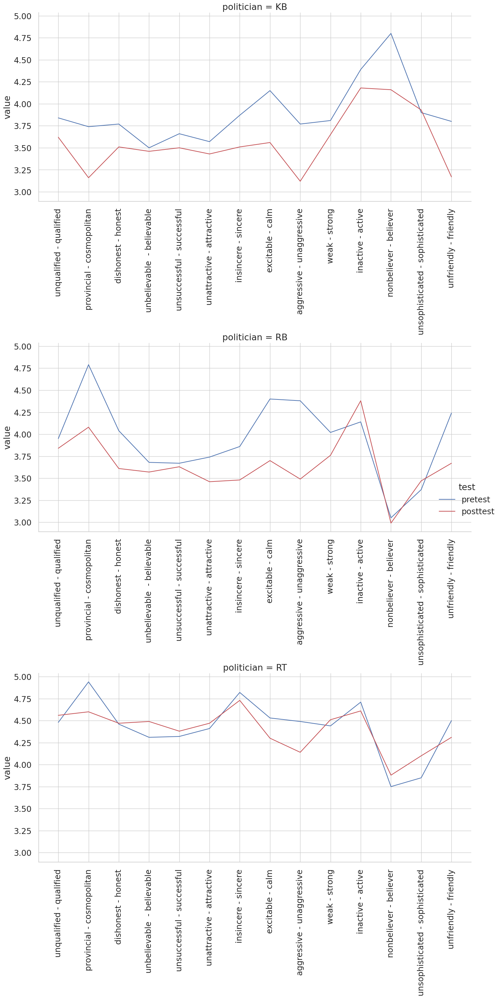

In [ ]:
# stim 2

sns.set(font_scale=1.6, style = 'whitegrid')

g = sns.relplot(data = df_line, x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.5, col_wrap = 1, height = 9)

g.set(xlabel = '')
plt.tight_layout(h_pad=15)
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True)
    ax.tick_params(axis='x', rotation=90)
    

plt.show()

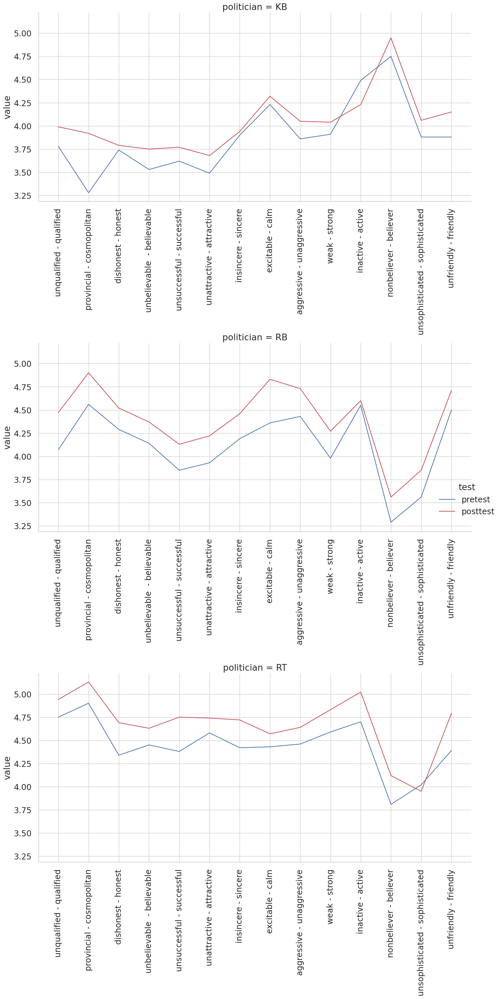

In [ ]:
# stim 1

sns.set(font_scale=1.6, style = 'whitegrid')

g = sns.relplot(data = df_line, x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.5, col_wrap = 1, height = 9)

g.set(xlabel = '')
plt.tight_layout(h_pad=15)
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True)
    ax.tick_params(axis='x', rotation=90)
    

plt.show()

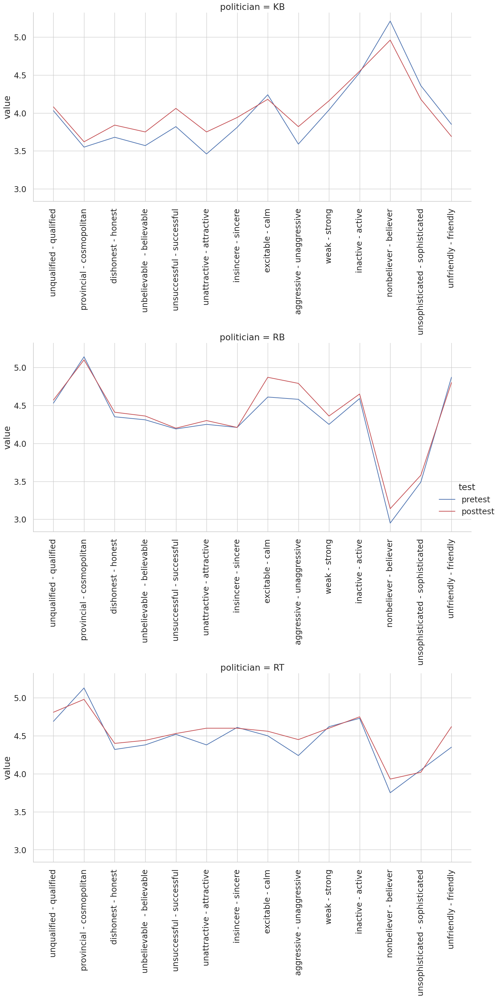

In [ ]:
# stim 0

sns.set(font_scale=1.6, style = 'whitegrid')

g = sns.relplot(data = df_line, x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.5, col_wrap = 1, height = 9)

g.set(xlabel = '')
plt.tight_layout(h_pad=15)
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True)
    ax.tick_params(axis='x', rotation=90)
    

plt.show()

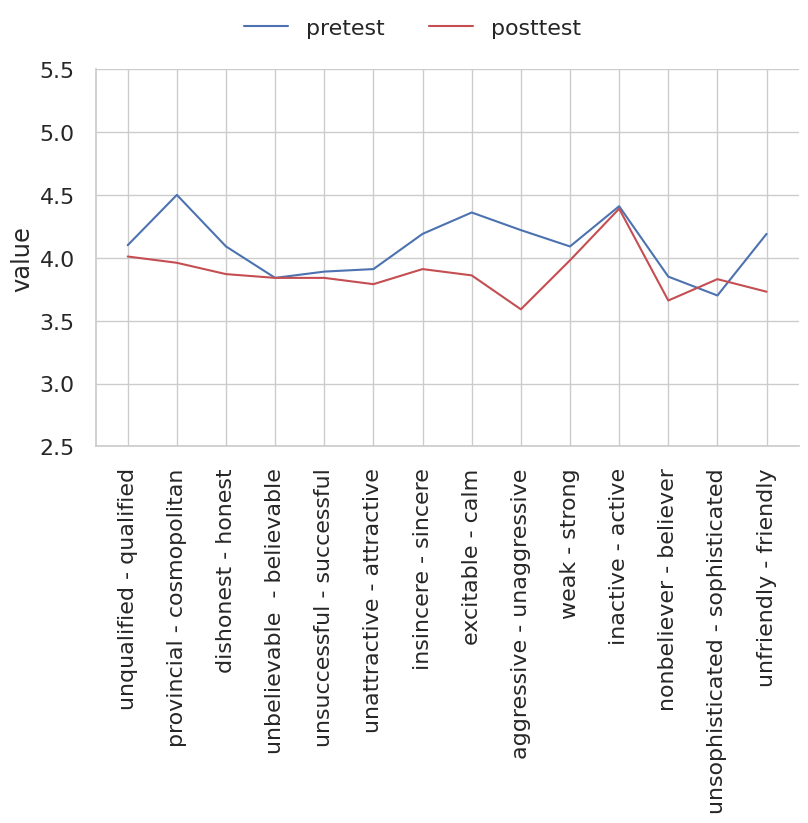

In [ ]:
# stimulus = 2
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line, x = 'variable', y = 'value', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

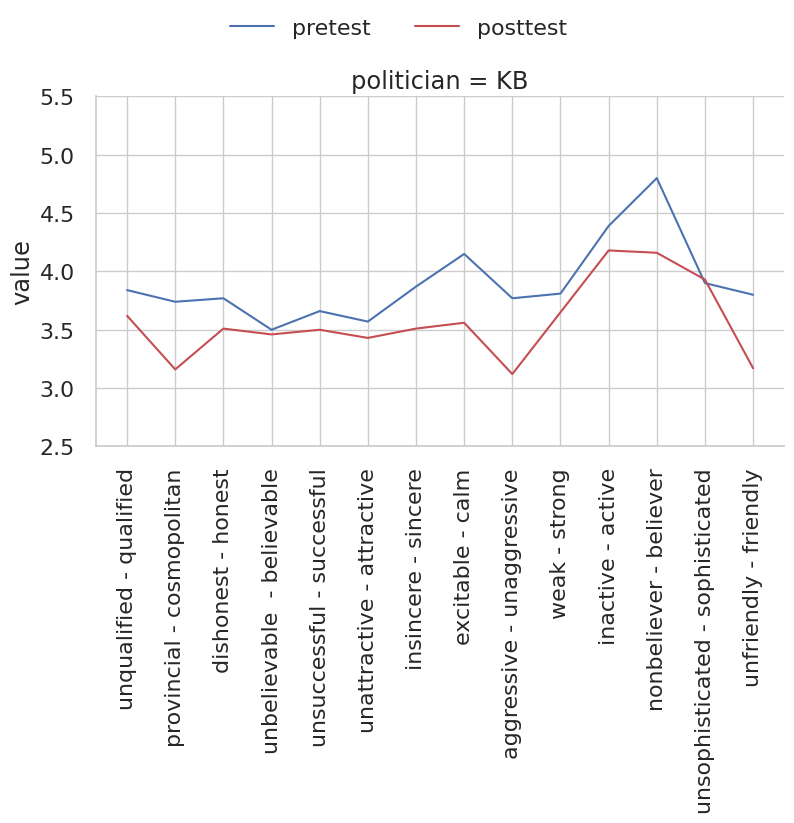

In [ ]:
# stimulus = 2
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'KB'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

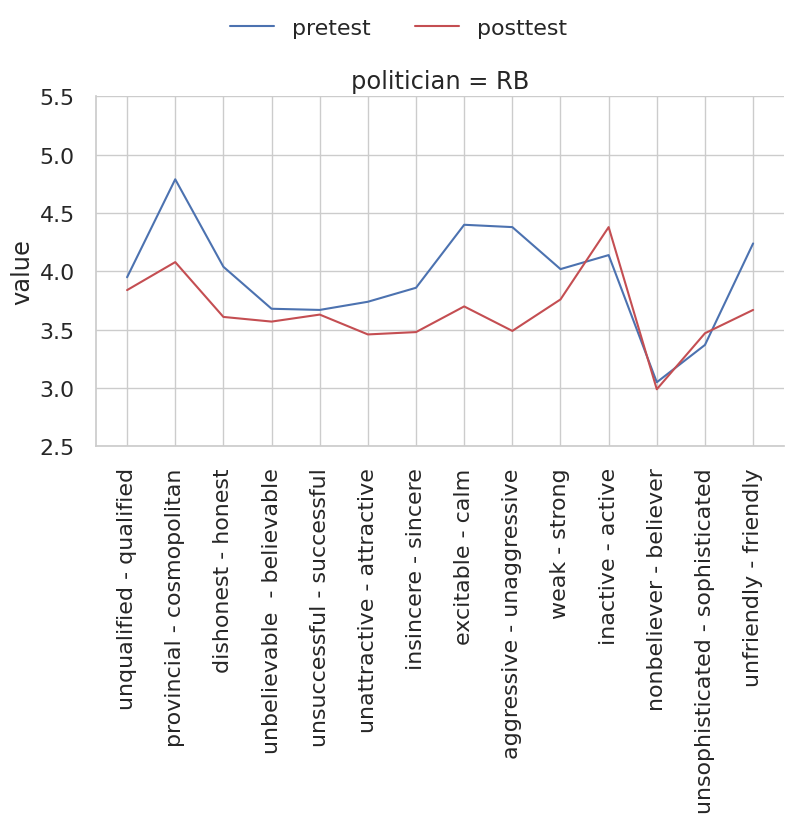

In [ ]:
# stimulus = 2
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'RB'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

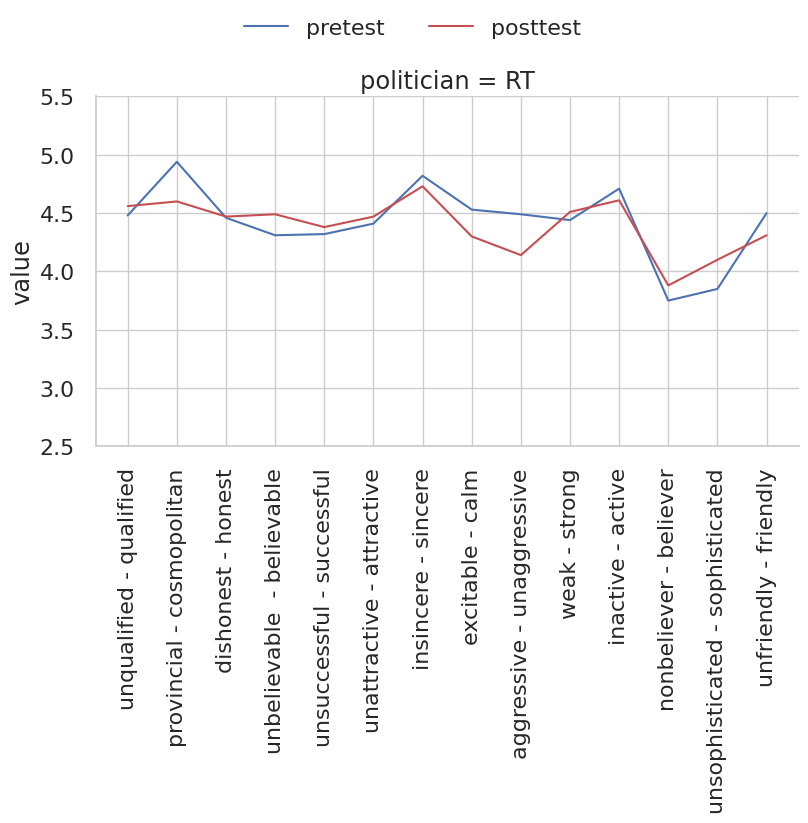

In [ ]:
# stimulus = 2
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'RT'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

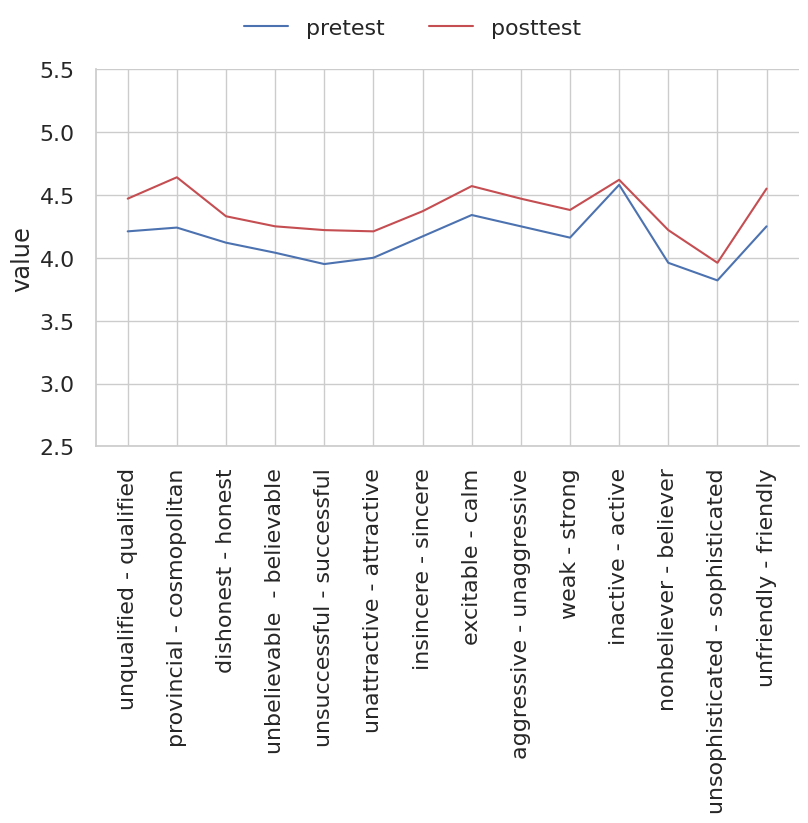

In [ ]:
# stimulus = 1
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line, x = 'variable', y = 'value', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

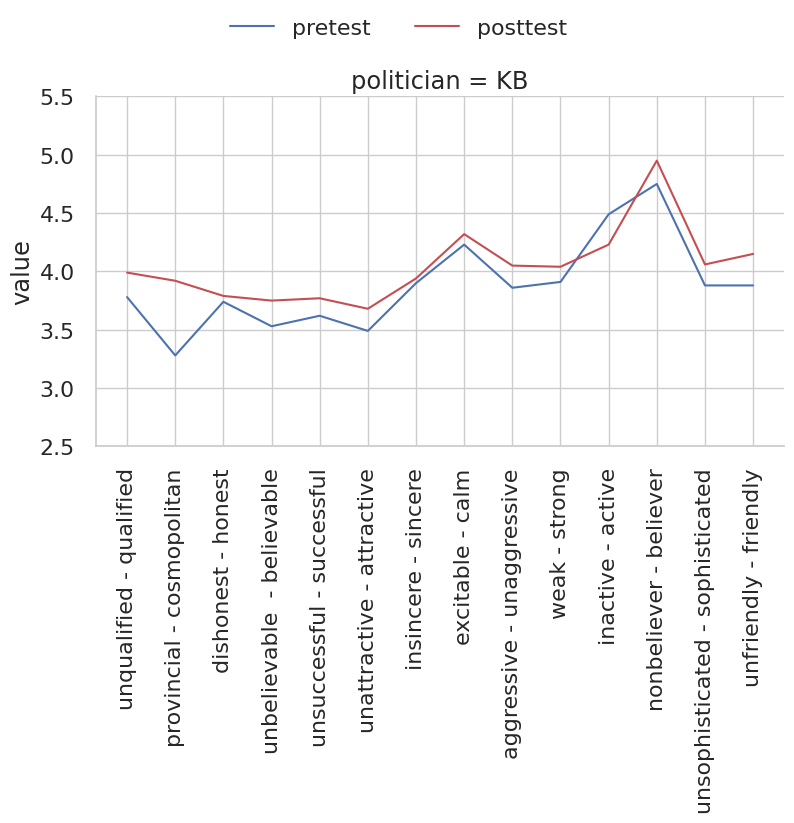

In [ ]:
# stimulus = 1
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'KB'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

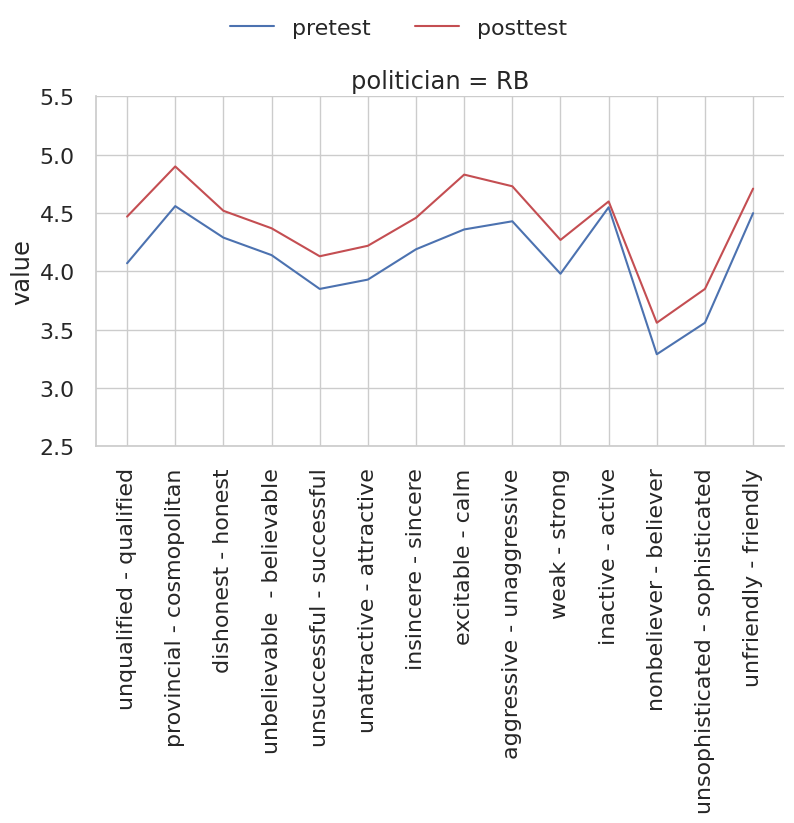

In [ ]:
# stimulus = 1
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'RB'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

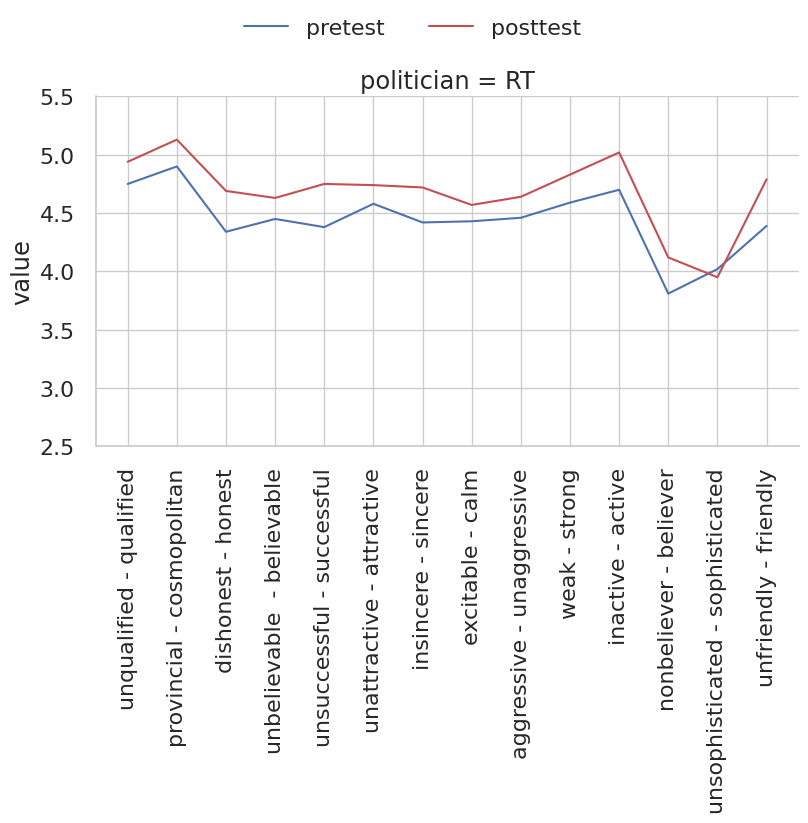

In [ ]:
# stimulus = 1
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'RT'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

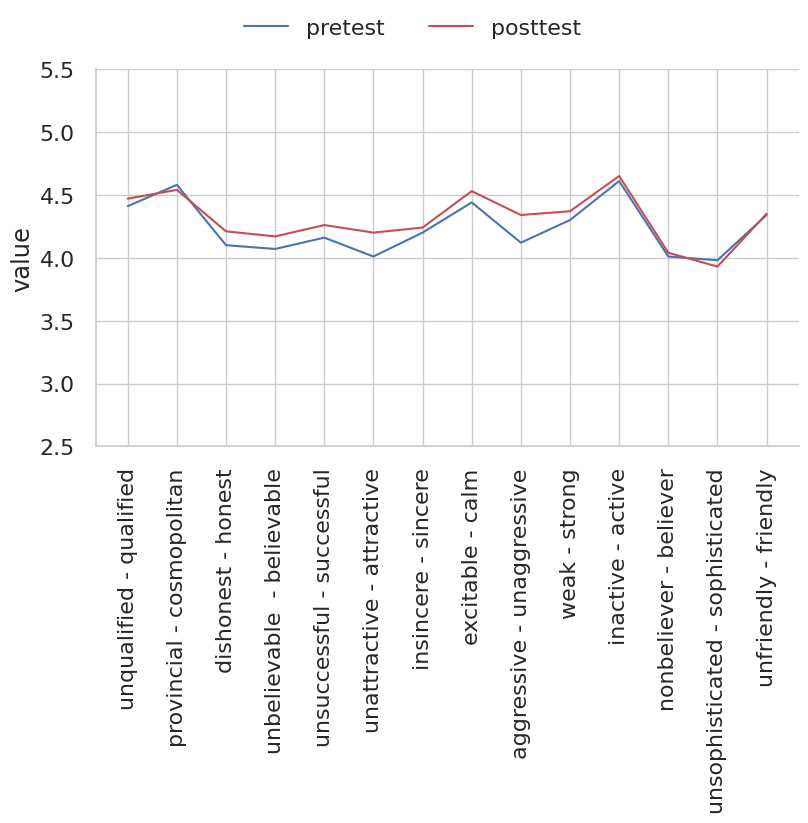

In [ ]:
# stimulus = 0
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line, x = 'variable', y = 'value', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

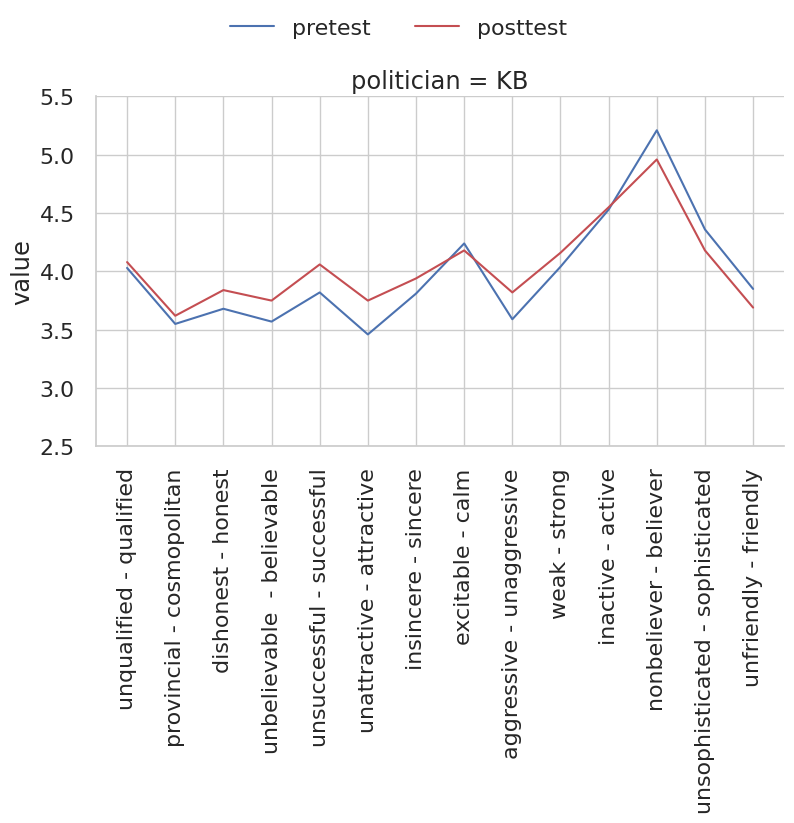

In [ ]:
# stimulus = 0
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'KB'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

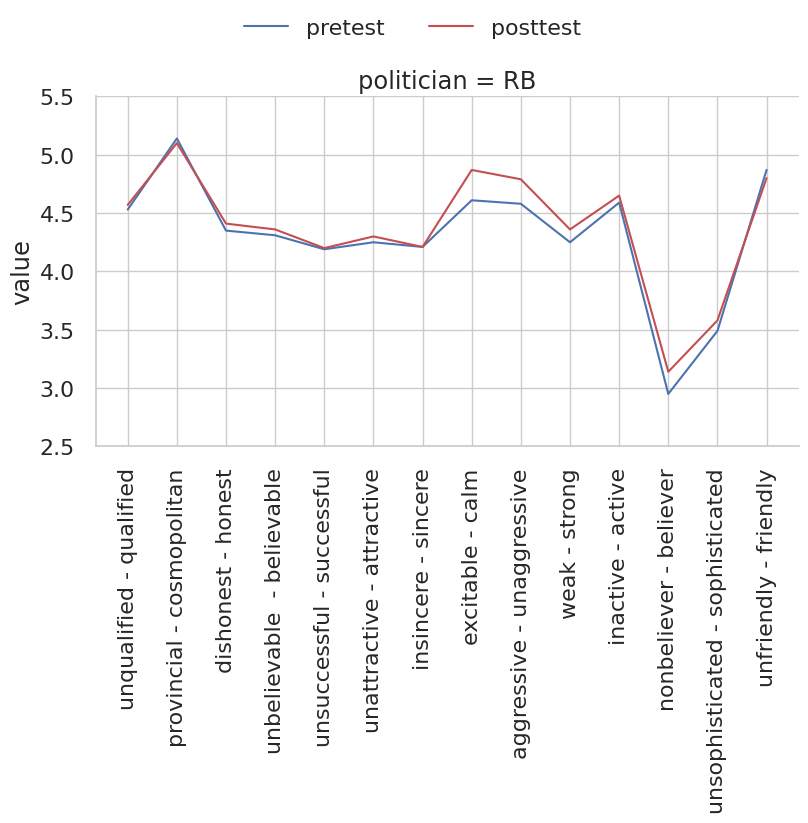

In [ ]:
# stimulus = 0
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'RB'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

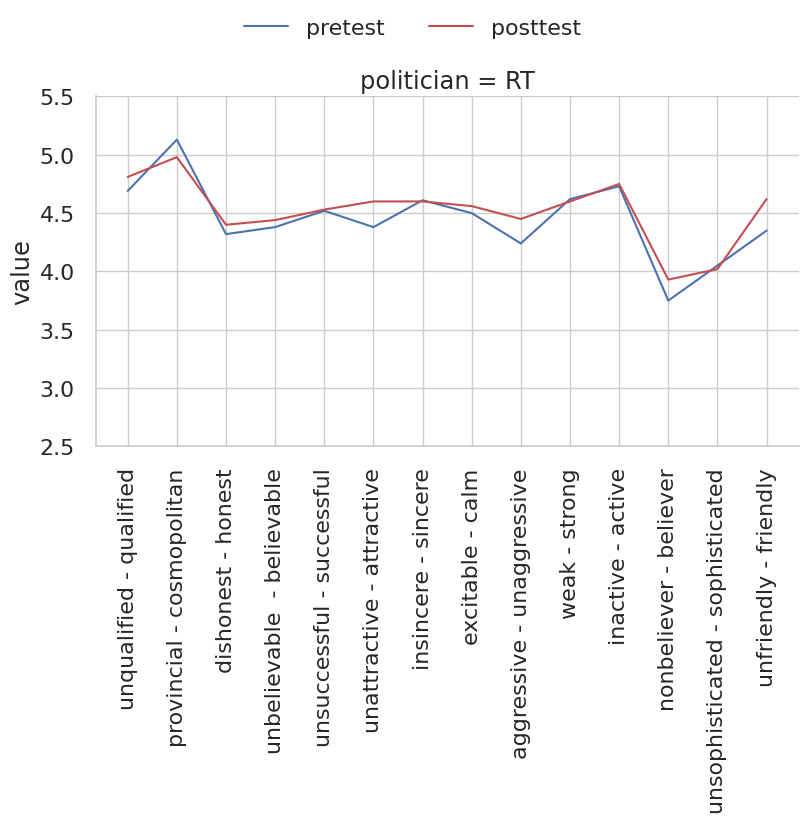

In [ ]:
# stimulus = 0
sns.set(font_scale=1.45, style = 'whitegrid')

g = sns.relplot(data = df_line[df_line.politician == 'RT'], x = 'variable', y = 'value', col = 'politician', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.7 )
g.set(xlabel = '', ylim = (2.5,5.5))

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)

sns.move_legend(g, loc = 'upper center', bbox_to_anchor = (0.445, 1.09), ncols = 2, title='' )
plt.show()

##t-test

"To be an interval variable, each change from one point to the next must mean the same thing"

można liczby z dyferencjały traktowac jako ilościowe po różnice miedzy 1 i 2 oraz 6 i 7 są takie same, to nie jest trad. skala likerta gdzie odpowiedz 1 to "nie zgadzam się" a 3 to "nie wiem" - tutaj nie da się zmieżyć odległości między punktami na skali ale na dyferencjale już tak

###ttest_politycy_po

In [2]:
k = 3
(k*(k-1))/2

3.0

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:
# KB-RT

print('KB-RT')
for d in dyfer_po:
  pol1 = p3_pos_KB[d].values
  pol2 = p3_pos_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) <= 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in dyfer_po:
  pol1 = p3_pos_KB[d].values
  pol2 = p3_pos_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) <= 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in dyfer_po:
  pol1 = p3_pos_RB[d].values
  pol2 = p3_pos_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) <= 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

In [ ]:
ttest_polityk_po_dyfer_df = pd.DataFrame({
    'politician':ttest_polityk_przed_dyfer_pol,
    'adjective':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,

})

ttest_polityk_po_dyfer_df.adjective = ttest_polityk_po_dyfer_df.adjective.map(map_post)
ttest_polityk_po_dyfer_df

In [ ]:
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'] * 3
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'].round(3)
ttest_polityk_po_dyfer_df.to_excel('ttest_polityk_po_pos_dyfer_df.xlsx')

ttest_polityk_po_dyfer_df = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] <= 0.05]

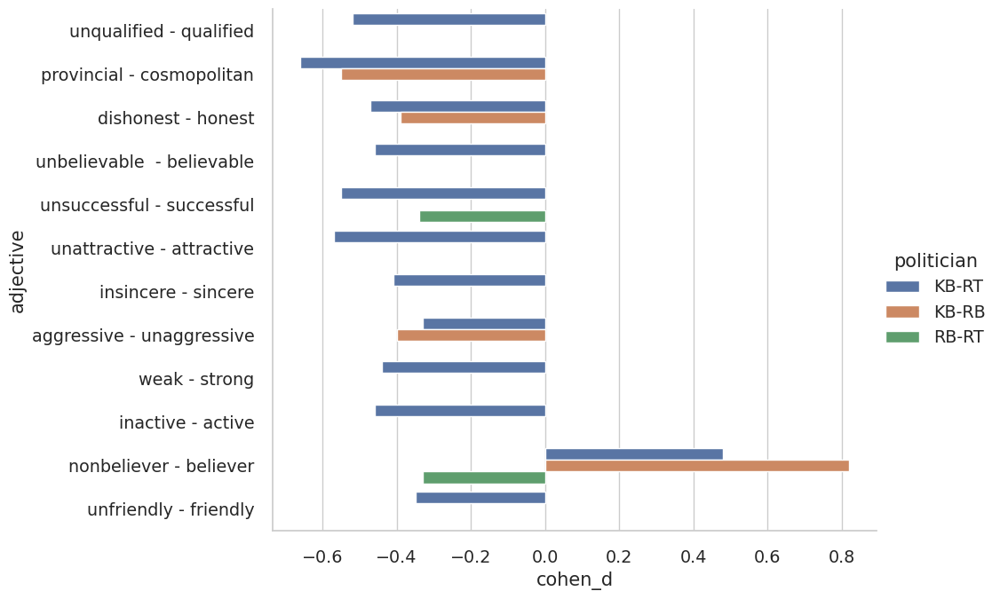

In [ ]:
sns.set(font_scale=1.25, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df, 
           y = 'adjective', x = 'cohen_d', hue = 'politician',  aspect=1.5, height=7)
plt.show()
# pos

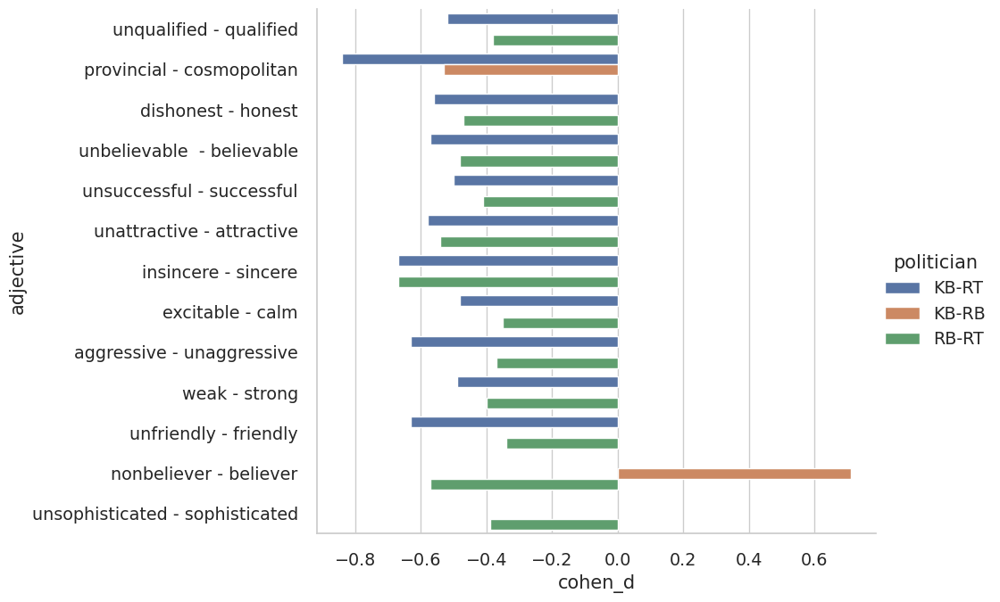

In [ ]:
sns.set(font_scale=1.25, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df, 
           y = 'adjective', x = 'cohen_d', hue = 'politician',  aspect=1.5, height=7)
plt.show()
# neg

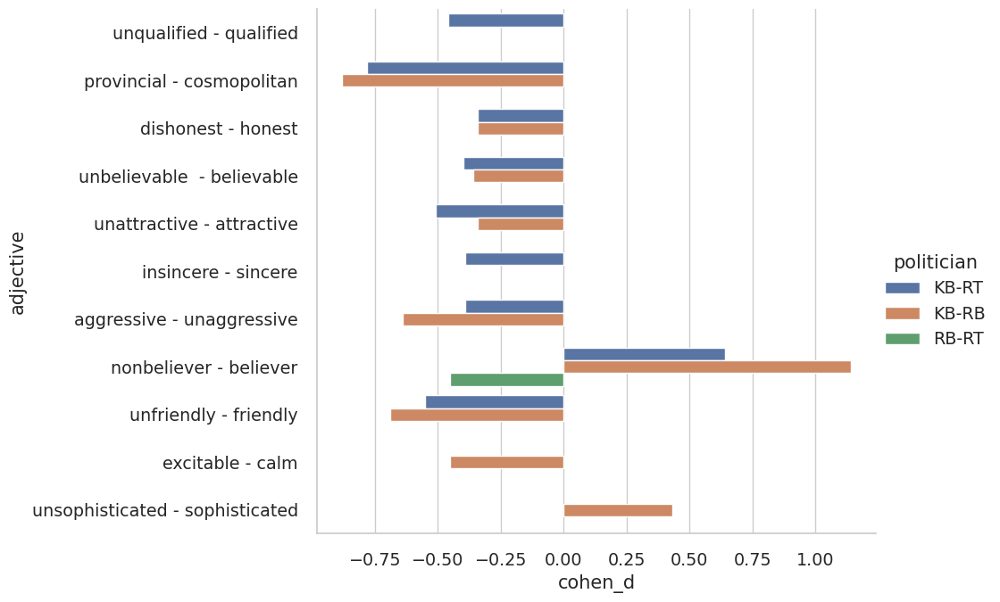

In [ ]:
sns.set(font_scale=1.25, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df, 
           y = 'adjective', x = 'cohen_d', hue = 'politician',  aspect=1.5, height=7)
plt.show()
# neu

###ttest_politycy_przed

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:
# KB-RT

print('KB-RT')
for d in dyfer_przed:
  pol1 = p3_KB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) <= 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in dyfer_przed:
  pol1 = p3_KB[d].values
  pol2 = p3_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) <= 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in dyfer_przed:
  pol1 = p3_RB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) <= 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

KB-RT
p5_r1
reject H0
t:  -5.578 p-value:  0.0 effect size:  -0.44 

p5_r2
reject H0
t:  -10.588 p-value:  0.0 effect size:  -0.84 

p5_r3
reject H0
t:  -4.656 p-value:  0.0 effect size:  -0.37 

p5_r4
reject H0
t:  -5.742 p-value:  0.0 effect size:  -0.45 

p5_r5
reject H0
t:  -5.183 p-value:  0.0 effect size:  -0.41 

p5_r6
reject H0
t:  -6.705 p-value:  0.0 effect size:  -0.53 

p5_r7
reject H0
t:  -5.392 p-value:  0.0 effect size:  -0.43 

p5_r8
do NOT reject H0
t:  -2.288 p-value:  0.0225 effect size:  -0.18 

p5_r9
reject H0
t:  -5.031 p-value:  0.0 effect size:  -0.4 

p5_r10
reject H0
t:  -4.719 p-value:  0.0 effect size:  -0.37 

p5_r11
do NOT reject H0
t:  -1.913 p-value:  0.0562 effect size:  -0.15 

p5_r12
reject H0
t:  8.983 p-value:  0.0 effect size:  0.71 

p5_r13
do NOT reject H0
t:  0.685 p-value:  0.4935 effect size:  0.05 

p5_r14
reject H0
t:  -4.142 p-value:  0.0 effect size:  -0.33 


 ****************************
 KB-RB 
p5_r1
do NOT reject H0
t:  -2.264 p-value:

In [ ]:
ttest_polityk_po_dyfer_df = pd.DataFrame({
    'politician':ttest_polityk_przed_dyfer_pol,
    'adjective':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,

})
ttest_polityk_po_dyfer_df.adjective = ttest_polityk_po_dyfer_df.adjective.map(map_pre)
ttest_polityk_po_dyfer_df

In [ ]:
ttest_polityk_po_dyfer_df.to_excel('ttest_polityk_przed_dyfer_df.xlsx')
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'] * 3
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'].round(3)

ttest_polityk_po_dyfer_df = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] <= 0.05]

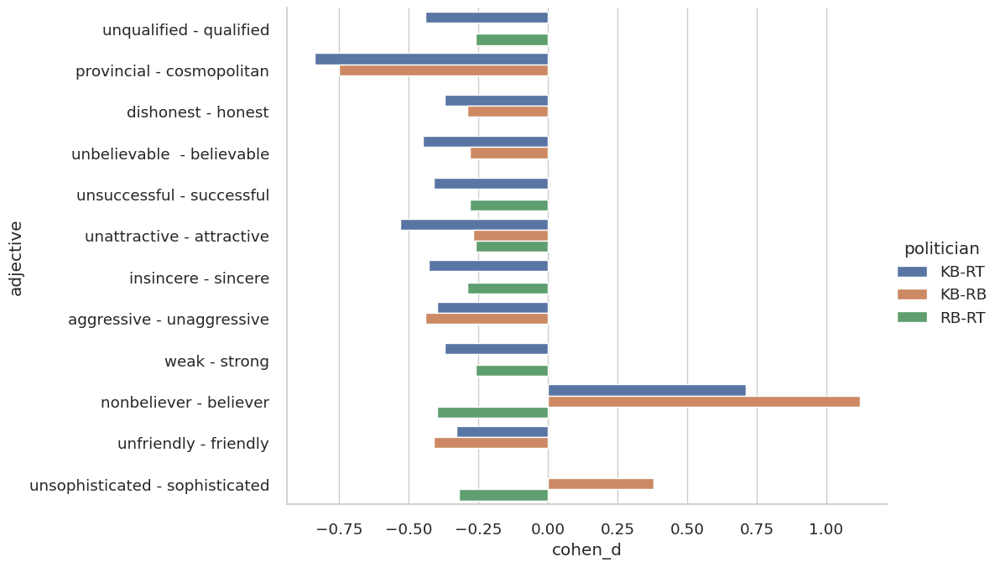

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] <= 0.05], 
           y = 'adjective', x = 'cohen_d', hue = 'politician',  aspect=1.6, height=7)
plt.show()

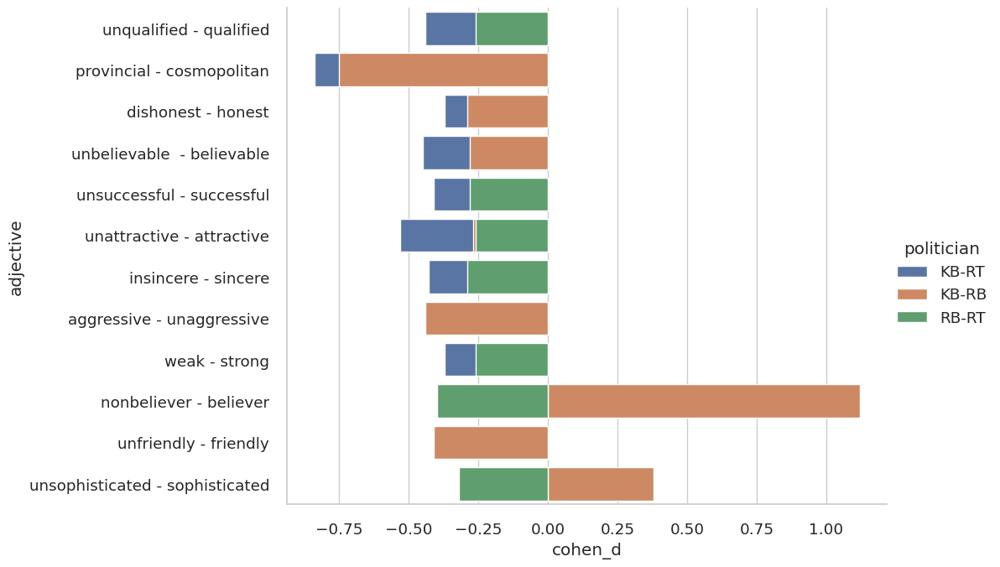

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df, 
            y = 'adjective', x = 'cohen_d', hue = 'politician', aspect=1.6, height=7, dodge = False)

plt.show()

###ttest sex / poglady

####ttest_polityk_po

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:
for d in dyfer_po:
  pol1 = p3_pos[p3_pos.sex == 1][d].values
  pol2 = p3_pos[p3_pos.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append(' pos')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


for d in dyfer_po:
  pol1 = p3_neg[p3_neg.sex == 1][d].values
  pol2 = p3_neg[p3_neg.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append(' neg')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)  

In [ ]:
# KB-RT

#   pol1 = p3_neg[p3_neg.sex == 1][d].values pol2 = p3_neg[p3_neg.sex == 2][d].values
print('KB')
for d in dyfer_po:
  pol1 = p3_pos_KB[p3_pos_KB.sex == 1][d].values
  pol2 = p3_pos_KB[p3_pos_KB.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB pos')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' RB ')
for d in dyfer_po:
  pol1 = p3_pos_RB[p3_pos_RB.sex == 1][d].values
  pol2 = p3_pos_RB[p3_pos_RB.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB pos')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RT ')
for d in dyfer_po:
  pol1 = p3_pos_RT[p3_pos_RT.sex == 1][d].values
  pol2 = p3_pos_RT[p3_pos_RT.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RT pos')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

In [ ]:
# KB-RT

#   pol1 = p3_neg[p3_neg.sex == 1][d].values pol2 = p3_neg[p3_neg.sex == 2][d].values
print('KB')
for d in dyfer_po:
  pol1 = p3_neg_KB[p3_neg_KB.sex == 1][d].values
  pol2 = p3_neg_KB[p3_neg_KB.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB neg')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' RB ')
for d in dyfer_po:
  pol1 = p3_neg_RB[p3_neg_RB.sex == 1][d].values
  pol2 = p3_neg_RB[p3_neg_RB.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB neg')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RT ')
for d in dyfer_po:
  pol1 = p3_neg_RT[p3_neg_RT.sex == 1][d].values
  pol2 = p3_neg_RT[p3_neg_RT.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RT neg')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

In [ ]:
ttest_polityk_po_dyfer_df = pd.DataFrame({
    'politician':ttest_polityk_przed_dyfer_pol,
    'adjective':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,

})

ttest_polityk_po_dyfer_df.adjective = ttest_polityk_po_dyfer_df.adjective.map(map_post)

In [ ]:
ttest_polityk_po_dyfer_df.head()

,politician,adjective,t,p,cohen_d
0,pos,unqualified - qualified,2.691,0.0075,0.31
1,pos,provincial - cosmopolitan,3.103,0.0021,0.35
2,pos,dishonest - honest,1.591,0.1126,0.18
3,pos,unbelievable - believable,2.546,0.0114,0.29
4,pos,unsuccessful - successful,2.002,0.0461,0.23


In [ ]:
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'] * 2
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'].round(2)

In [ ]:
ttest_polityk_po_dyfer_df = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] <= 0.05]

####ttest_polityk_przed

In [ ]:
df.poglady_3.unique()

array(['agree', 'neutral', 'disagree'], dtype=object)

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:

for d in dyfer_przed:
  pol1 = df[df.poglady_3 == 'agree'][d].values
  pol2 = df[df.poglady_3 == 'neutral'][d].values
  pol3 = df[df.poglady_3 == 'disagree'][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4)*3, 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('agree-neutral')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4) )
  ttest_polityk_przed_dyfer_cd.append(cd)

  value, p = ttest_ind(pol1, pol3) # , alternative='greater'
  cd = cohend(pol1, pol3)
  cd = round(cd, 2)
  if round(p*3 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4)*3, 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('agree-disagree ')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

  value, p = ttest_ind(pol2, pol3) # , alternative='greater'
  cd = cohend(pol2, pol3)
  cd = round(cd, 2)
  if round(p*3 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4)*3, 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('neutral-disagree')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)  

In [ ]:
# KB-RT

print('KB')
for d in dyfer_przed:
  pol1 = p3_KB[p3_KB.sex == 1][d].values
  pol2 = p3_KB[p3_KB.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*3 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB ')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' RB ')
for d in dyfer_przed:
  pol1 = p3_RB[p3_RB.sex == 1][d].values
  pol2 = p3_RB[p3_RB.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*3 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RT ')
for d in dyfer_przed:
  pol1 = p3_RT[p3_RT.sex == 1][d].values
  pol2 = p3_RT[p3_RT.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  #if round(p*3 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

In [ ]:
ttest_polityk_przed_dyfer_df = pd.DataFrame({
    'congruence of views':ttest_polityk_przed_dyfer_pol,
    'adjective':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,

})

ttest_polityk_przed_dyfer_df.adjective = ttest_polityk_przed_dyfer_df.adjective.map(map_pre)

In [ ]:
ttest_polityk_przed_dyfer_df.head()

,congruence of views,adjective,t,p,cohen_d
0,agree-neutral,unqualified - qualified,9.948,0.0,0.82
1,agree-disagree,unqualified - qualified,15.574,0.0,1.25
2,neutral-disagree,unqualified - qualified,8.620,0.0,0.66
3,agree-neutral,provincial - cosmopolitan,10.713,0.0,0.88
4,agree-disagree,provincial - cosmopolitan,14.245,0.0,1.14


In [ ]:
#ttest_polityk_przed_dyfer_df.to_excel('ttest_polityk_przed_dyfer_df_poglady3.xlsx')

ttest_polityk_przed_dyfer_df['p'] = ttest_polityk_przed_dyfer_df['p'] * 3
ttest_polityk_przed_dyfer_df['p'] = ttest_polityk_przed_dyfer_df['p'].round(2)



In [ ]:
ttest_polityk_przed_dyfer_df = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] <= 0.05]

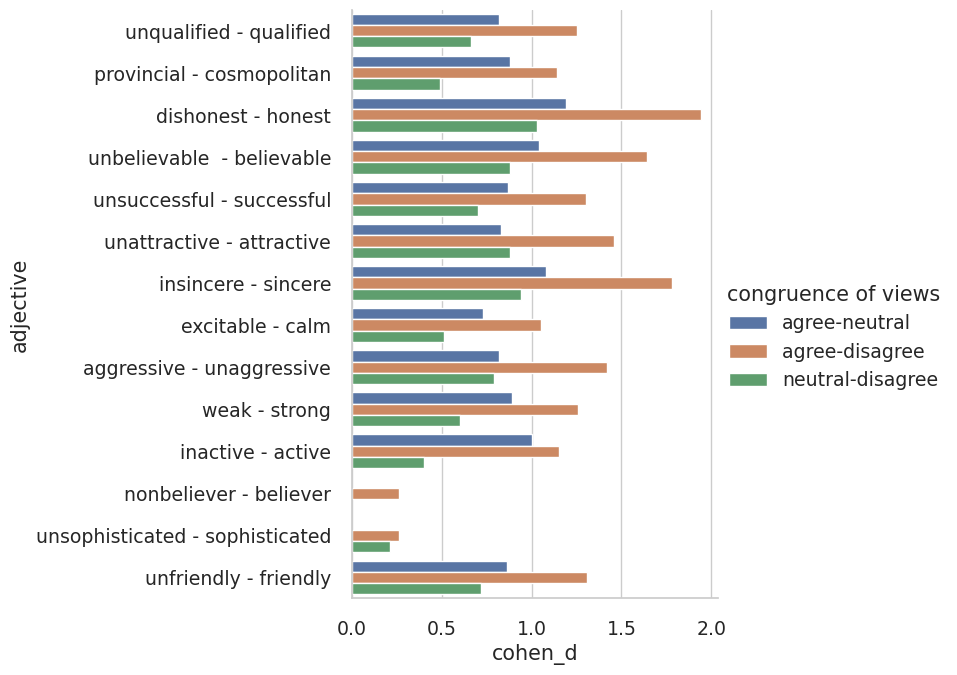

In [ ]:
sns.set(font_scale=1.24, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df, 
            y = 'adjective', x = 'cohen_d', hue = 'congruence of views', aspect=1.2, height=7)
plt.show()

####sex x stimuli

In [ ]:
for d in dyfer_po:
  pol1 = p3_neg[p3_neg.sex == 1][d].values
  pol2 = p3_neg[p3_neg.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")

  ttest_polityk_przed_dyfer_pol.append('neg po')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

p9_r1
do NOT reject H0
t:  0.29 p-value:  0.7723 effect size:  0.03 

p9_r2
do NOT reject H0
t:  -0.47 p-value:  0.6385 effect size:  -0.05 

p9_r3
do NOT reject H0
t:  1.301 p-value:  0.1942 effect size:  0.15 

p9_r4
do NOT reject H0
t:  0.41 p-value:  0.6821 effect size:  0.05 

p9_r5
do NOT reject H0
t:  0.713 p-value:  0.4762 effect size:  0.08 

p9_r6
do NOT reject H0
t:  1.088 p-value:  0.2772 effect size:  0.12 

p9_r7
do NOT reject H0
t:  0.66 p-value:  0.5099 effect size:  0.07 

p9_r8
do NOT reject H0
t:  -0.291 p-value:  0.7712 effect size:  -0.03 

p9_r9
do NOT reject H0
t:  0.634 p-value:  0.5266 effect size:  0.07 

p9_r10
do NOT reject H0
t:  0.964 p-value:  0.336 effect size:  0.11 

p9_r11
do NOT reject H0
t:  0.807 p-value:  0.42 effect size:  0.09 

p9_r12
do NOT reject H0
t:  1.131 p-value:  0.2591 effect size:  0.13 

p9_r13
do NOT reject H0
t:  0.08 p-value:  0.9361 effect size:  0.01 

p9_r14
do NOT reject H0
t:  0.724 p-value:  0.4693 effect size:  0.08 



In [ ]:
for d in dyfer_po:
  pol1 = p3_pos[p3_pos.sex == 1][d].values
  pol2 = p3_pos[p3_pos.sex == 2][d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")

  ttest_polityk_przed_dyfer_pol.append('pos po')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

In [ ]:
ttest_sex_dyfer_df = pd.DataFrame({
    'politycy':ttest_polityk_przed_dyfer_pol,
    'pytanie':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,

})

ttest_sex_dyfer_df.to_excel('/content/drive/MyDrive/temporal.xlsx')

###pos-neg-neu post-pretest

In [ ]:
ii = []
tt = []
dd = []
kk = []

pol = []
pp = []

In [ ]:
# pos

for d in cc:
  dprzed = p3_pos_RT[d[0]].values
  dpo = p3_pos_RT[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")
  ii.append(d[0])
  tt.append(value.round(3))
  dd.append(cd)
  kk.append('pos')
  pp.append(p.round(4))

In [ ]:
# neg

for d in cc:
  dprzed = p3_neg_RT[d[0]].values
  dpo = p3_neg_RT[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='less') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")
  ii.append(d[0])
  tt.append(value.round(3))
  dd.append(cd)
  kk.append('neg')    
  pp.append(p.round(4))

('p5_r1', 'p9_r1')
do NOT reject H0
0.6635889897572831 0.7458 

('p5_r2', 'p9_r2')
reject H0
t:  -2.563 p-value:  0.0059 effect size:  -0.19 

('p5_r3', 'p9_r3')
do NOT reject H0
0.08047591708698104 0.532 

('p5_r4', 'p9_r4')
do NOT reject H0
1.3187050659064967 0.905 

('p5_r5', 'p9_r5')
do NOT reject H0
0.47264883396472995 0.6813 

('p5_r6', 'p9_r6')
do NOT reject H0
0.4948404911958174 0.6891 

('p5_r7', 'p9_r7')
do NOT reject H0
-0.6947864245205476 0.2443 

('p5_r8', 'p9_r8')
reject H0
t:  -2.079 p-value:  0.02 effect size:  -0.14 

('p5_r9', 'p9_r9')
reject H0
t:  -2.618 p-value:  0.0051 effect size:  -0.22 

('p5_r10', 'p9_r10')
do NOT reject H0
0.630705997473164 0.7352 

('p5_r11', 'p9_r11')
do NOT reject H0
-1.054146332249901 0.1471 

('p5_r12', 'p9_r12')
do NOT reject H0
1.4208066683349456 0.9209 

('p5_r13', 'p9_r13')
do NOT reject H0
2.012668255037672 0.9767 

('p5_r14', 'p9_r14')
do NOT reject H0
-1.5714029850271178 0.0595 



In [ ]:
# neu

for d in cc:
  dprzed = p3_neu_RT[d[0]].values
  dpo = p3_neu_RT[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed) # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")
  ii.append(d[0])
  tt.append(value.round(3))
  dd.append(cd)
  kk.append('neu')      
  pp.append(p.round(4))

('p5_r1', 'p9_r1')
do NOT reject H0
0.8560410761819038 0.394 

('p5_r2', 'p9_r2')
do NOT reject H0
-1.1272198180118798 0.2623 

('p5_r3', 'p9_r3')
do NOT reject H0
0.6747073354733117 0.5014 

('p5_r4', 'p9_r4')
do NOT reject H0
0.47784939503767565 0.6338 

('p5_r5', 'p9_r5')
do NOT reject H0
0.06576477209564995 0.9477 

('p5_r6', 'p9_r6')
do NOT reject H0
1.84497920655782 0.0679 

('p5_r7', 'p9_r7')
do NOT reject H0
-0.07523065617958145 0.9402 

('p5_r8', 'p9_r8')
do NOT reject H0
0.4667561886043613 0.6417 

('p5_r9', 'p9_r9')
do NOT reject H0
1.599566252026226 0.1128 

('p5_r10', 'p9_r10')
do NOT reject H0
-0.21062924902677943 0.8336 

('p5_r11', 'p9_r11')
do NOT reject H0
0.1509055868113788 0.8803 

('p5_r12', 'p9_r12')
do NOT reject H0
1.3591978848012505 0.1771 

('p5_r13', 'p9_r13')
do NOT reject H0
-0.1892339284103308 0.8503 

('p5_r14', 'p9_r14')
reject H0
t:  2.1 p-value:  0.0382 effect size:  0.15 



In [ ]:
dd = pd.DataFrame({ 
    'quest': ii,
    "t": tt,
    'd':dd,
    'stim': kk, 
    'p':pp
})
dd.head() #     'politician':pol,

,quest,t,d,stim,p
0,p5_r1,1.624,0.16,pos,0.0537
1,p5_r2,1.925,0.13,pos,0.0285
2,p5_r3,3.333,0.18,pos,0.0006
3,p5_r4,1.636,0.18,pos,0.0524
4,p5_r5,3.138,0.19,pos,0.0011


In [ ]:
df.groupby(['stimulus', 'politician'])[dyfer].mean().round(3).T#.to_excel('/content/drive/MyDrive/temp_ex2.xlsx')

stimulus   negative               neutral               positive             
politician       KB     RB     RT      KB     RB     RT       KB    RB     RT
p5_r1         3.845  3.955  4.477   4.026  4.533  4.692    3.783  4.07  4.755
p5_r2         3.738  4.793  4.936   3.553  5.143  5.135    3.283  4.56  4.896
p5_r3         3.767  4.036  4.459   3.675  4.352  4.317    3.736  4.29  4.340
p5_r4         3.505  3.676  4.312   3.570  4.314  4.375    3.528  4.14  4.453
p5_r5         3.660  3.667  4.321   3.816  4.190  4.519    3.623  3.85  4.377
p5_r6         3.573  3.739  4.413   3.465  4.248  4.375    3.491  3.93  4.585
p5_r7         3.874  3.856  4.817   3.807  4.210  4.606    3.896  4.19  4.425
p5_r8         4.146  4.396  4.532   4.237  4.610  4.500    4.226  4.36  4.434
p5_r9         3.767  4.378  4.486   3.588  4.581  4.240    3.858  4.43  4.462
p5_r10        3.806  4.018  4.440   4.044  4.248  4.625    3.906  3.98  4.594
p5_r11        4.388  4.144  4.706   4.526  4.590  4.731    4.491  4.55  4.698
p5_r12        4.796  3.054  3.752   5.211  2.952  3.750    4.755  3.29  3.811
p5_r13        3.903  3.369  3.853   4.360  3.486  4.048    3.877  3.56  4.019
p5_r14        3.796  4.243  4.505   3.851  4.867  4.346    3.877  4.50  4.387
p9_r1         3.621  3.838  4.560   4.079  4.571  4.808    3.991  4.47  4.943
p9_r2         3.155  4.081  4.596   3.623  5.105  4.981    3.915  4.90  5.132
p9_r3         3.515  3.613  4.468   3.842  4.410  4.404    3.792  4.52  4.689
p9_r4         3.456  3.568  4.486   3.754  4.362  4.442    3.755  4.37  4.632
p9_r5         3.495  3.631  4.376   4.061  4.200  4.529    3.774  4.13  4.755
p9_r6         3.427  3.459  4.468   3.746  4.305  4.596    3.679  4.22  4.736
p9_r7         3.515  3.477  4.734   3.939  4.210  4.596    3.943  4.46  4.717
p9_r8         3.563  3.703  4.303   4.184  4.867  4.558    4.321  4.83  4.566
p9_r9         3.117  3.486  4.138   3.825  4.790  4.452    4.047  4.73  4.642
p9_r10        3.650  3.757  4.514   4.158  4.362  4.596    4.038  4.27  4.830
p9_r11        4.184  4.378  4.606   4.553  4.648  4.750    4.226  4.60  5.019
p9_r12        4.155  2.991  3.881   4.965  3.143  3.933    4.953  3.56  4.123
p9_r13        3.932  3.468  4.101   4.175  3.581  4.019    4.057  3.85  3.953
p9_r14        3.175  3.667  4.312   3.693  4.800  4.625    4.151  4.71  4.792

###diff 

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

ttest_polityk_przed_dyfer_stimulus = []

In [ ]:
map_post

{'p9_r1': 'unqualified - qualified',
 'p9_r2': 'provincial - cosmopolitan',
 'p9_r3': 'dishonest - honest',
 'p9_r4': 'unbelievable  - believable',
 'p9_r5': 'unsuccessful - successful',
 'p9_r6': 'unattractive - attractive',
 'p9_r7': 'insincere - sincere',
 'p9_r8': 'excitable - calm',
 'p9_r9': 'aggressive - unaggressive',
 'p9_r10': 'weak - strong',
 'p9_r11': 'inactive - active',
 'p9_r12': 'nonbeliever - believer',
 'p9_r13': 'unsophisticated - sophisticated',
 'p9_r14': 'unfriendly - friendly'}

In [ ]:
df.groupby(['politician', 'stimulus'])[cc_diff].mean().round(3)

diff_r1  diff_r2  diff_r3  diff_r4  diff_r5  diff_r6  \
politician stimulus                                                         
KB         negative   -0.223   -0.583   -0.252   -0.049   -0.165   -0.146   
           neutral     0.053    0.070    0.167    0.184    0.246    0.281   
           positive    0.208    0.632    0.057    0.226    0.151    0.189   
RB         negative   -0.117   -0.712   -0.423   -0.108   -0.036   -0.279   
           neutral     0.038   -0.038    0.057    0.048    0.010    0.057   
           positive    0.400    0.340    0.230    0.230    0.280    0.290   
RT         negative    0.083   -0.339    0.009    0.174    0.055    0.055   
           neutral     0.115   -0.154    0.087    0.067    0.010    0.221   
           positive    0.189    0.236    0.349    0.179    0.377    0.151   

                     diff_r7  diff_r8  diff_r9  diff_r10  diff_r11  diff_r12  \
politician stimulus                                                            
KB         negative   -0.359   -0.583   -0.650    -0.155    -0.204    -0.641   
           neutral     0.132   -0.053    0.237     0.114     0.026    -0.246   
           positive    0.047    0.094    0.189     0.132    -0.264     0.198   
RB         negative   -0.378   -0.694   -0.892    -0.261     0.234    -0.063   
           neutral     0.000    0.257    0.210     0.114     0.057     0.190   
           positive    0.270    0.470    0.300     0.290     0.050     0.270   
RT         negative   -0.083   -0.229   -0.349     0.073    -0.101     0.128   
           neutral    -0.010    0.058    0.212    -0.029     0.019     0.183   
           positive    0.292    0.132    0.179     0.236     0.321     0.311   

                     diff_r13  diff_r14  
politician stimulus                      
KB         negative     0.029    -0.621  
           neutral     -0.184    -0.158  
           positive     0.179     0.274  
RB         negative     0.099    -0.577  
           neutral      0.095    -0.067  
           positive     0.290     0.210  
RT         negative     0.248    -0.193  
           neutral     -0.029     0.279  
           positive    -0.066     0.406

In [ ]:
# KB-RT

print('KB-RT')
for d in cc_diff:
  pol1 = p3_pos_KB[d].values
  pol2 = p3_pos_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('pos')


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in cc_diff:
  pol1 = p3_pos_KB[d].values
  pol2 = p3_pos_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('pos')

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in cc_diff:
  pol1 = p3_pos_RB[d].values
  pol2 = p3_pos_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*3 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('pos')


In [ ]:
ttest_polityk_diff_df = pd.DataFrame({
    'politician':ttest_polityk_przed_dyfer_pol,
    'adjective':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,
    'stimulus':ttest_polityk_przed_dyfer_stimulus,

})

ttest_polityk_diff_df.adjective = ttest_polityk_diff_df.adjective.str.replace('diff_', '').map(map_r)

In [ ]:
ttest_polityk_diff_df.head()

,politician,adjective,t,p,cohen_d,stimulus
0,KB-RT,unqualified - qualified,-1.398,0.1635,-0.19,negative
1,KB-RT,provincial - cosmopolitan,-1.214,0.2259,-0.17,negative
2,KB-RT,dishonest - honest,-1.433,0.1532,-0.20,negative
3,KB-RT,unbelievable - believable,-1.199,0.2320,-0.16,negative
4,KB-RT,unsuccessful - successful,-1.224,0.2225,-0.17,negative


In [ ]:
#ttest_polityk_diff_df.to_excel('ttest_polityk_diff_df.xlsx')

ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'] * 3
ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'].round(2)

ttest_polityk_diff_df = ttest_polityk_diff_df[ttest_polityk_diff_df['p'] <= 0.05]
ttest_polityk_diff_df 

,politician,adjective,t,p,cohen_d,stimulus
11,KB-RT,nonbeliever - believer,-4.653,0.00,-0.64,negative
25,KB-RB,nonbeliever - believer,-2.978,0.01,-0.41,negative
35,RB-RT,excitable - calm,-2.438,0.05,-0.33,negative
55,KB-RT,unfriendly - friendly,-2.409,0.05,-0.33,neu
67,KB-RB,nonbeliever - believer,-2.745,0.02,-0.37,neu
94,KB-RT,inactive - active,-2.681,0.02,-0.37,pos


In [ ]:
#ttest_polityk_diff_df.to_excel('ttest_polityk_diff_df.xlsx')

ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'] * 3
ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'].round(2)

ttest_polityk_diff_df = ttest_polityk_diff_df[ttest_polityk_diff_df['p'] <= 0.05]
ttest_polityk_diff_df # men - women

,politician,adjective,t,p,cohen_d,stimulus
53,KB-RT,nonbeliever - believer,-3.711,0.0,-0.73,negative


In [ ]:
#ttest_polityk_diff_df.to_excel('ttest_polityk_diff_df.xlsx')

ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'] * 3
ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'].round(2)

ttest_polityk_diff_df = ttest_polityk_diff_df[ttest_polityk_diff_df['p'] <= 0.05]
ttest_polityk_diff_df # men - men

,politician,adjective,t,p,cohen_d,stimulus


In [ ]:
#ttest_polityk_diff_df.to_excel('ttest_polityk_diff_df.xlsx')

ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'] * 3
ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'].round(2)

ttest_polityk_diff_df = ttest_polityk_diff_df[ttest_polityk_diff_df['p'] <= 0.05]
ttest_polityk_diff_df # women - women

,politician,adjective,t,p,cohen_d,stimulus
11,KB-RT,nonbeliever - believer,-5.682,0.00,-1.06,negative
25,KB-RB,nonbeliever - believer,-2.437,0.05,-0.45,negative


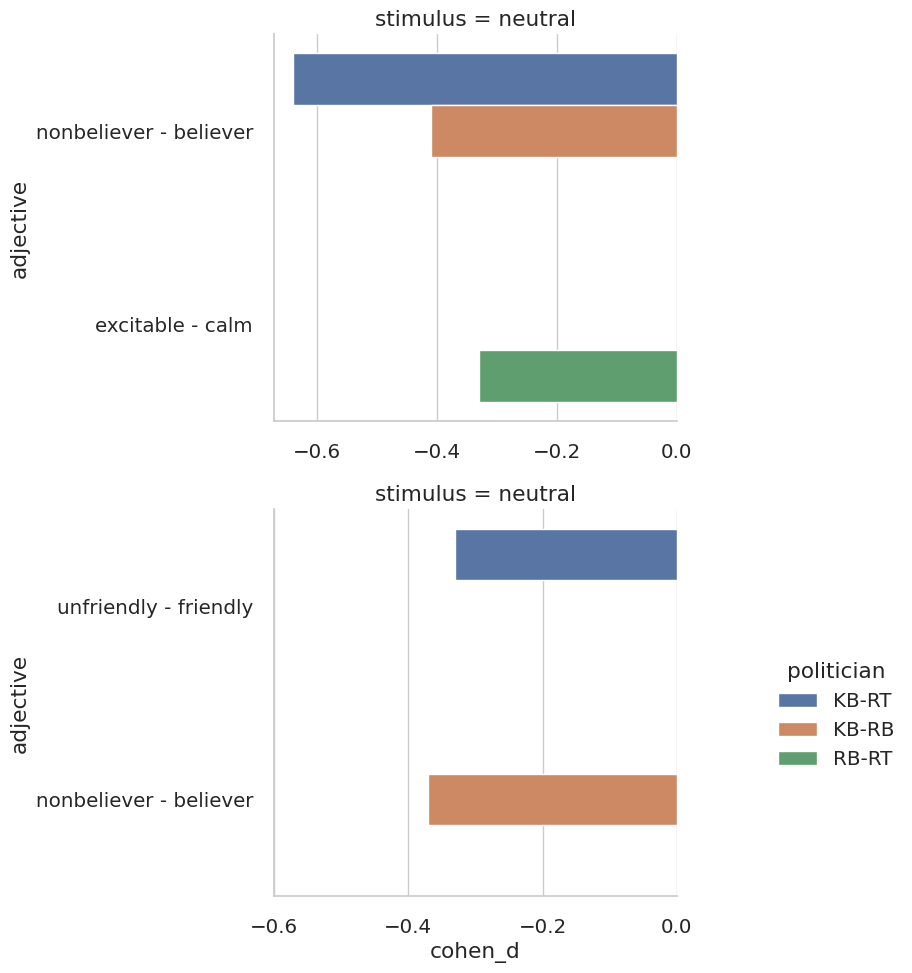

In [ ]:
sns.set(font_scale=1.3, style = 'whitegrid')

g = sns.catplot(kind = 'bar', data = ttest_polityk_diff_df[ttest_polityk_diff_df.stimulus!='pos'], 
           y = 'adjective', x = 'cohen_d', hue = 'politician', aspect=1.5, height=5, 
            row = 'stimulus', sharey=False, sharex=False)
g.set(title = 'stimulus = neutral', xticks = np.arange(-0.6, 0.1, 0.2))
sns.move_legend(g, loc = 'lower center', bbox_to_anchor = (1.02, 0.2))
plt.show()

##corr wiek/poglady x differential

In [ ]:
from scipy.stats import spearmanr, kendalltau

In [ ]:
ktau = []
ppktau = []
catktau = []

spear = []
ppspear = []
catspear = []

In [ ]:
for d in dyfer_przed:
  print(d)

  stat, pv = spearmanr(df[d].values, df['year'].values)
  spear.append(round(stat, 3))
  ppspear.append(round(pv, 4))
  catspear.append('year')
  print(spearmanr(df[d].values, df['year'].values))

  stat, pv = kendalltau(df[d].values, df['year'].values)
  print(kendalltau(df[d].values, df['year'].values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('year')

  stat, pv = kendalltau(df[d].values, df['p4_r1'].fillna(3).values)
  print(kendalltau(df[d].values, df['p4_r1'].fillna(3).values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('views')  
  
  print()

p5_r1
SignificanceResult(statistic=-0.06694090876266078, pvalue=0.03830785429880615)
SignificanceResult(statistic=-0.04735328298404203, pvalue=0.04447210933399639)
SignificanceResult(statistic=0.44427706460198846, pvalue=1.9645682662252648e-66)

p5_r2
SignificanceResult(statistic=-0.013696475701541207, pvalue=0.6720079080890783)
SignificanceResult(statistic=-0.009287639168668428, pvalue=0.6932637501628023)
SignificanceResult(statistic=0.4052837707330738, pvalue=1.1523666976601927e-55)

p5_r3
SignificanceResult(statistic=0.029443526034028982, pvalue=0.3626479433607426)
SignificanceResult(statistic=0.020041998784355582, pvalue=0.3956877195428885)
SignificanceResult(statistic=0.6144784462749073, pvalue=5.439360640919587e-125)

p5_r4
SignificanceResult(statistic=-0.05170929474056383, pvalue=0.10971739490729183)
SignificanceResult(statistic=-0.03937916425386438, pvalue=0.09298234001126036)
SignificanceResult(statistic=0.5420151582483486, pvalue=5.888084848971965e-99)

p5_r5
SignificanceResu

In [ ]:
len(ktau), len(spear), len(catspear), len(catktau)

(28, 14, 14, 28)

In [ ]:
for d in dyfer_po:
  print(d)

  stat, pv = spearmanr(p3_pos[d].values, p3_pos['year'].values)
  spear.append(round(stat, 3))
  ppspear.append(round(pv, 4))
  catspear.append('year pos')
  print(spearmanr(p3_pos[d].values, p3_pos['year'].values))

  stat, pv = kendalltau(p3_pos[d].values, p3_pos['year'].values)
  print(kendalltau(p3_pos[d].values, p3_pos['year'].values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('year pos')

  stat, pv = kendalltau(p3_pos[d].values, p3_pos['p4_r1'].fillna(3).values)
  print(kendalltau(p3_pos[d].values, p3_pos['p4_r1'].fillna(3).values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('views pos')  
  
  print()

p9_r1
SignificanceResult(statistic=0.1087768242598035, pvalue=0.05493769456975395)
SignificanceResult(statistic=0.08117528581039218, pvalue=0.0502150227992422)
SignificanceResult(statistic=0.4496011336428661, pvalue=3.2060517353010254e-23)

p9_r2
SignificanceResult(statistic=0.05311110299937611, pvalue=0.34977606542245)
SignificanceResult(statistic=0.03753755206380735, pvalue=0.3653614255686438)
SignificanceResult(statistic=0.40575756219436604, pvalue=3.3904827690073978e-19)

p9_r3
SignificanceResult(statistic=0.11397230744571529, pvalue=0.04425882746508073)
SignificanceResult(statistic=0.08441606014955408, pvalue=0.04185566245438493)
SignificanceResult(statistic=0.5391552389062978, pvalue=1.251892204257783e-32)

p9_r4
SignificanceResult(statistic=0.13982509566781204, pvalue=0.013434224678610003)
SignificanceResult(statistic=0.1030307094421031, pvalue=0.012849564008002594)
SignificanceResult(statistic=0.4643865319075079, pvalue=1.0324676738939574e-24)

p9_r5
SignificanceResult(statisti

In [ ]:

for d in dyfer_po:
  print(d)

  stat, pv = spearmanr(p3_neg[d].values, p3_neg['year'].values)
  spear.append(round(stat, 3))
  ppspear.append(round(pv, 4))
  catspear.append('year neg')
  print(spearmanr(p3_neg[d].values, p3_neg['year'].values))

  stat, pv = kendalltau(p3_neg[d].values, p3_neg['year'].values)
  print(kendalltau(p3_neg[d].values, p3_neg['year'].values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('year neg')

  stat, pv = kendalltau(p3_neg[d].values, p3_neg['p4_r1'].fillna(3).values)
  print(kendalltau(p3_neg[d].values, p3_neg['p4_r1'].fillna(3).values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('views neg')  
  
  print()  

p9_r1
SignificanceResult(statistic=-0.0625605780481119, pvalue=0.26224922647601595)
SignificanceResult(statistic=-0.04556352737624642, pvalue=0.26027096165457075)
SignificanceResult(statistic=0.47836302338278164, pvalue=5.122768090745283e-27)

p9_r2
SignificanceResult(statistic=0.024205825769832226, pvalue=0.6647177311294389)
SignificanceResult(statistic=0.020439200418451747, pvalue=0.6130833152972623)
SignificanceResult(statistic=0.429112024043501, pvalue=4.1121719469972383e-22)

p9_r3
SignificanceResult(statistic=0.03466433896086231, pvalue=0.5347537427591115)
SignificanceResult(statistic=0.02516389062040219, pvalue=0.5364534794868403)
SignificanceResult(statistic=0.5000167555268152, pvalue=4.7563706855015343e-29)

p9_r4
SignificanceResult(statistic=-0.07343641659456589, pvalue=0.1880145197105938)
SignificanceResult(statistic=-0.05066399742211819, pvalue=0.21249611026536952)
SignificanceResult(statistic=0.5302908043658878, pvalue=1.4384149546786405e-32)

p9_r5
SignificanceResult(stat

In [ ]:
for d in dyfer_po:
  print(d)
  stat, pv = spearmanr(p3_neu[d].values, p3_neu['year'].values)
  spear.append(round(stat, 3))
  ppspear.append(round(pv, 4))
  catspear.append('year neu')
  print(spearmanr(p3_neu[d].values, p3_neu['year'].values))

  stat, pv = kendalltau(p3_neu[d].values, p3_neu['year'].values)
  print(kendalltau(p3_neu[d].values, p3_neu['year'].values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('year neu')

  stat, pv = kendalltau(p3_neu[d].values, p3_neu['p4_r1'].fillna(3).values)
  print(kendalltau(p3_neu[d].values, p3_neu['p4_r1'].fillna(3).values))
  ktau.append(round(stat, 3))
  ppktau.append(round(pv, 4))
  catktau.append('views neu')  
  
  print()  

p9_r1
SignificanceResult(statistic=0.0030816985170549135, pvalue=0.956002778272245)
SignificanceResult(statistic=0.0007145985919160897, pvalue=0.9860609612480546)
SignificanceResult(statistic=0.5017312589710674, pvalue=3.0205985897611797e-29)

p9_r2
SignificanceResult(statistic=-0.015180488355998837, pvalue=0.7857875466362603)
SignificanceResult(statistic=-0.011918112452809658, pvalue=0.7695455637011487)
SignificanceResult(statistic=0.4362783290767998, pvalue=9.671613838860488e-23)

p9_r3
SignificanceResult(statistic=0.025443676592683737, pvalue=0.6486921610350083)
SignificanceResult(statistic=0.014146924067153989, pvalue=0.7284091851823357)
SignificanceResult(statistic=0.5676225064018123, pvalue=3.0642212530674653e-37)

p9_r4
SignificanceResult(statistic=0.026736890584126517, pvalue=0.6321211564304077)
SignificanceResult(statistic=0.01787320748726692, pvalue=0.659086209342568)
SignificanceResult(statistic=0.5548540668173343, pvalue=4.815594614888083e-36)

p9_r5
SignificanceResult(stat

In [ ]:
df_ktau = pd.DataFrame({
    'r': ktau,
    'pp': ppktau,
    'category': catktau,
})
df_ktau.head()

,r,pp,category
0,-0.047,0.0445,year
1,0.444,0.0000,views
2,-0.009,0.6933,year
3,0.405,0.0000,views
4,0.020,0.3957,year


In [ ]:
df_spear = pd.DataFrame({
    'r': spear,
    'pp': ppspear,
    'category': catspear,
})
df_spear

In [ ]:
df.columns

Index(['Unnamed: 0', 'ID', 'survey_finish_time', 'sex', 'sex_r3_input', 'sex2',
       'age', 'year', 'miasta', 'wyksztalcenie', 'narodowosc', 'grupa', 'p3',
       'p4_r1', 'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7',
       'p5_r8', 'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',
       'p7', 'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7',
       'p9_r8', 'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14',
       'stimulus', 'politician', 'poglady_3', 'diff_r1', 'diff_r2', 'diff_r3',
       'diff_r4', 'diff_r5', 'diff_r6', 'diff_r7', 'diff_r8', 'diff_r9',
       'diff_r10', 'diff_r11', 'diff_r12', 'diff_r13', 'diff_r14'],
      dtype='object')

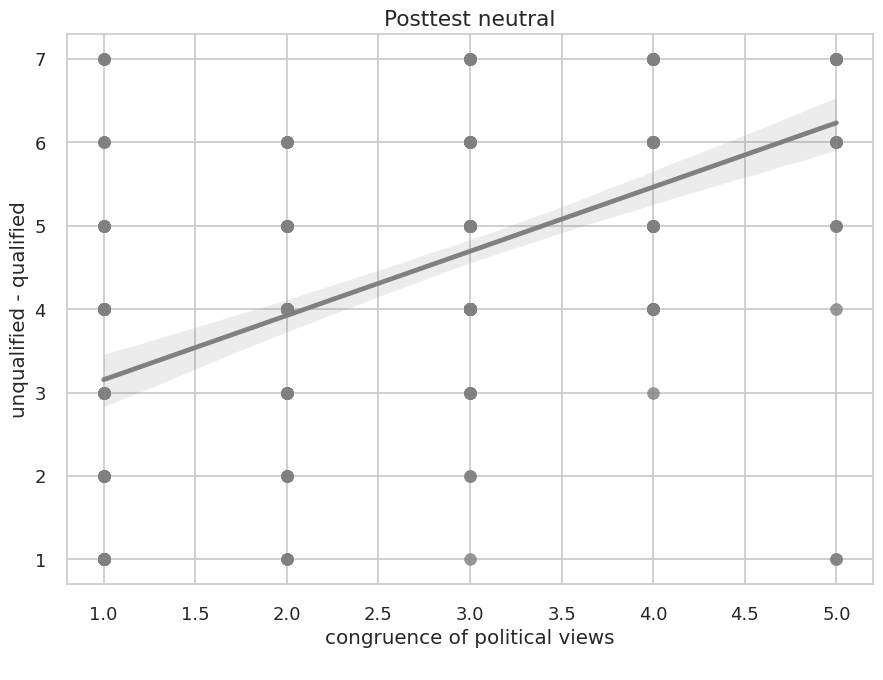

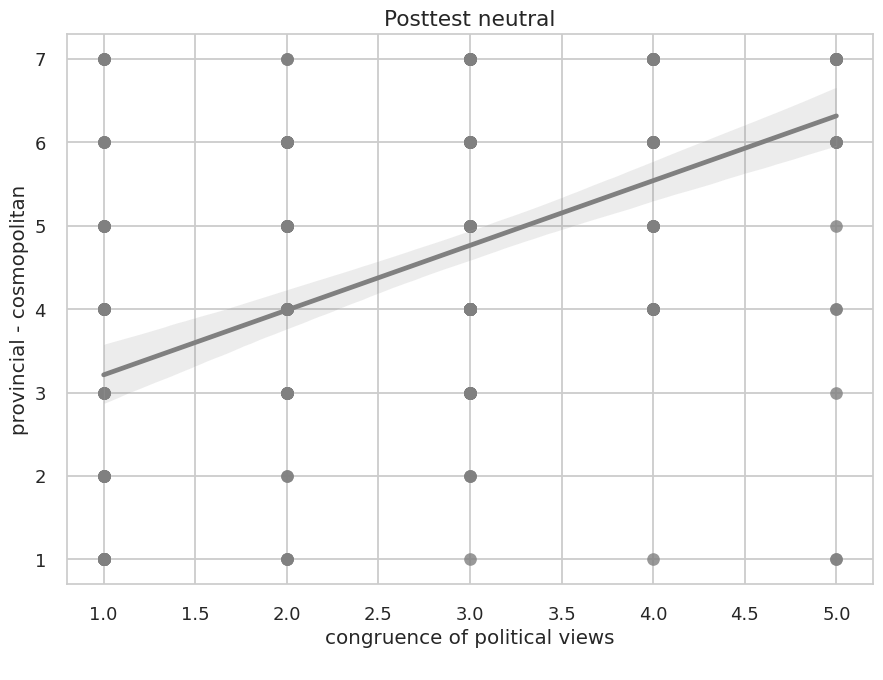

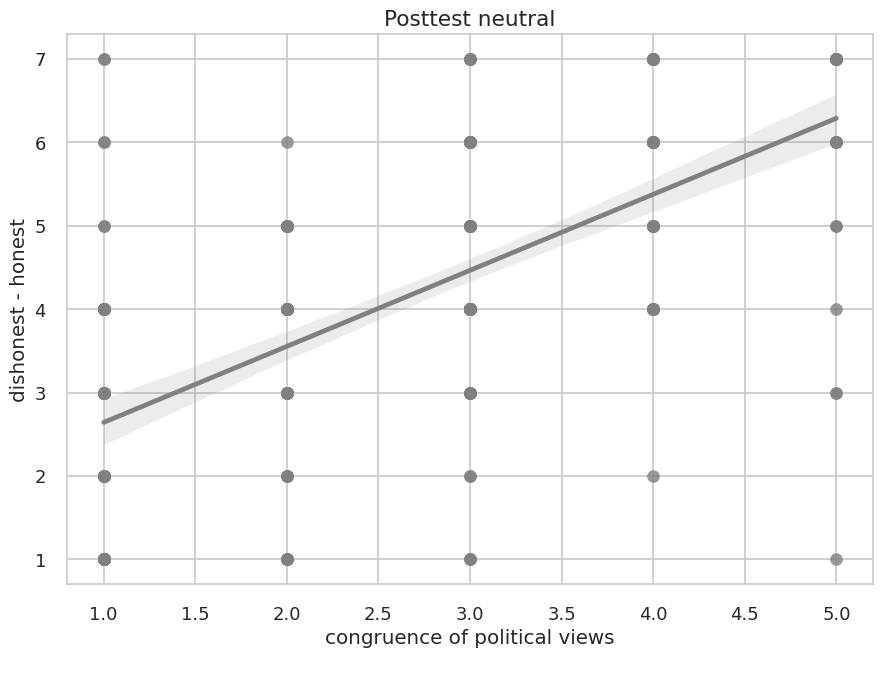

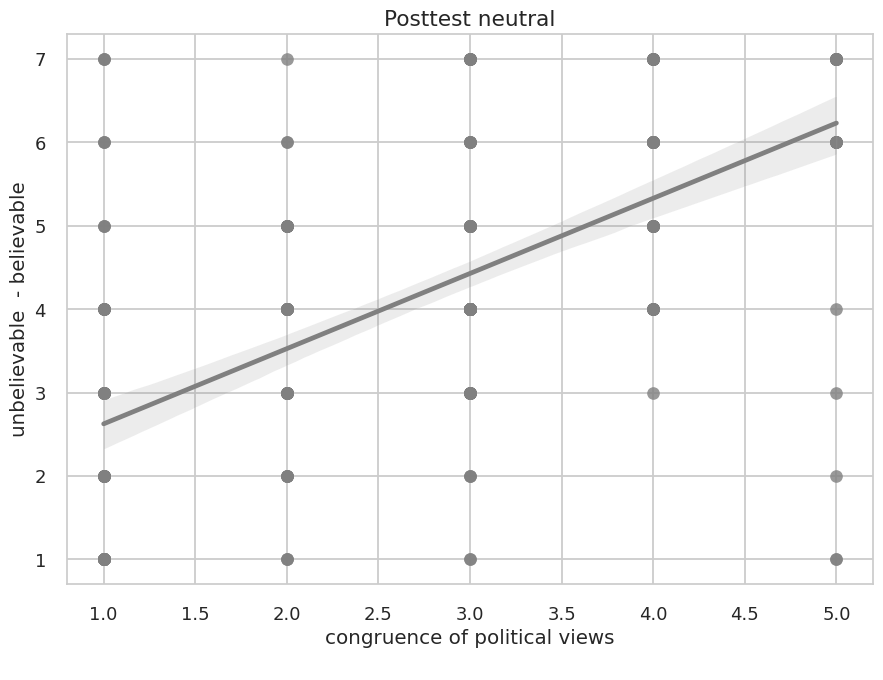

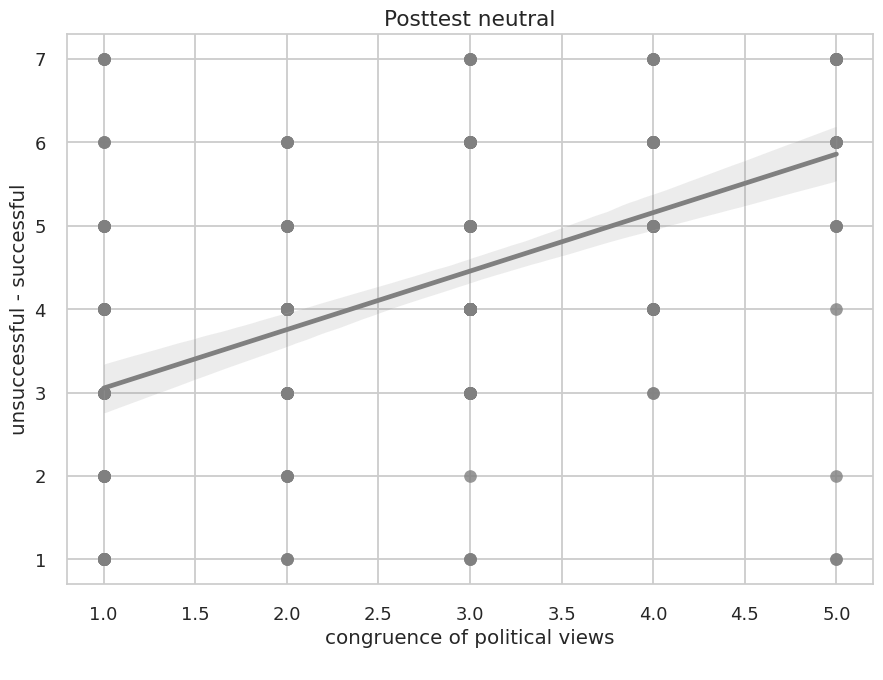

...

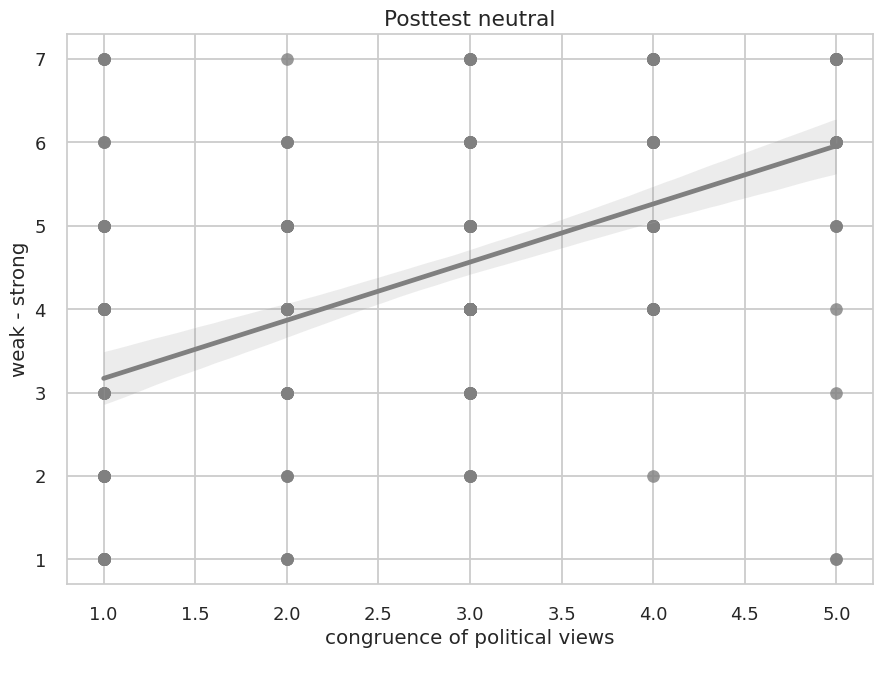

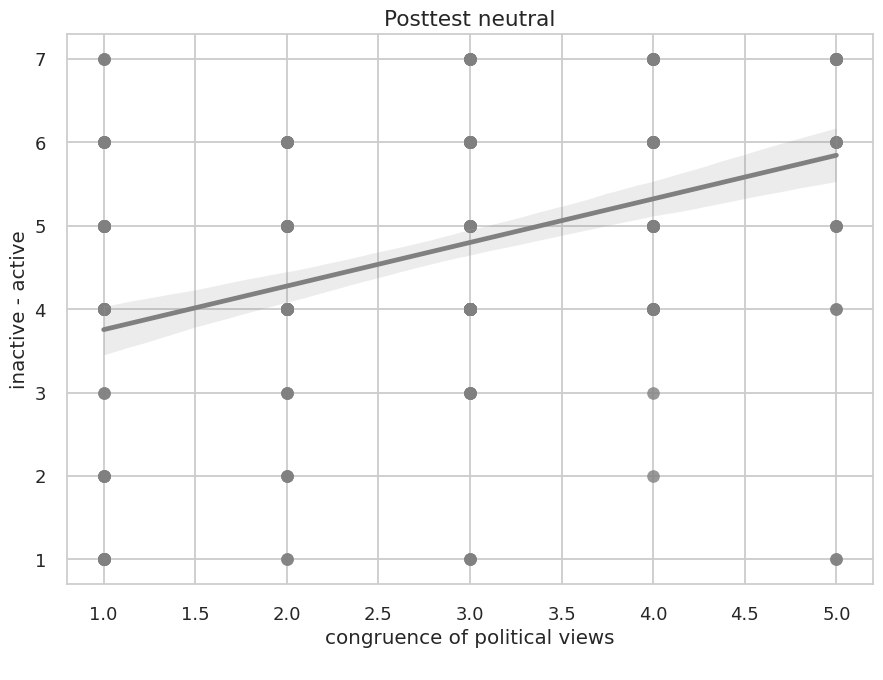

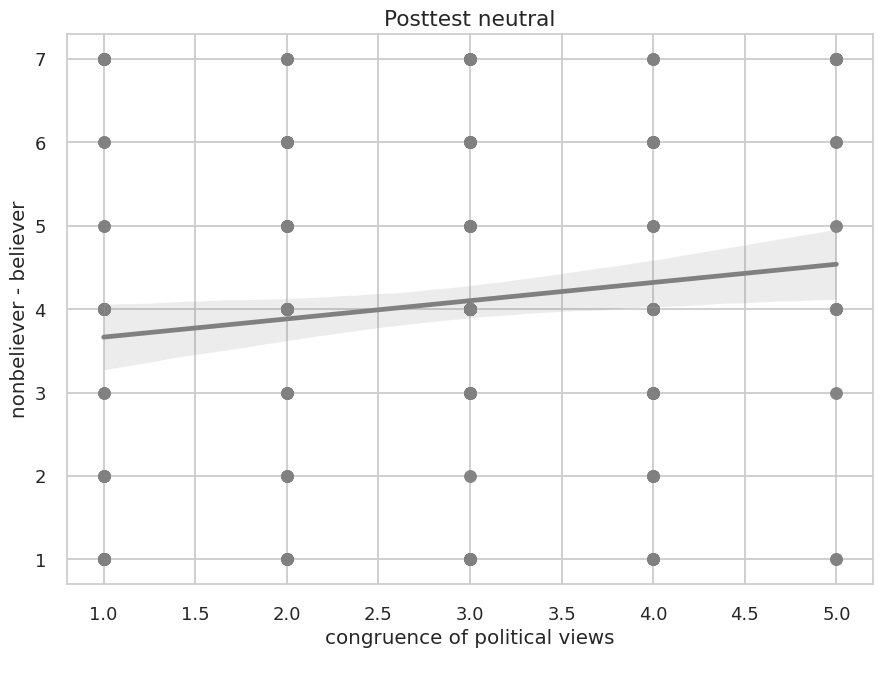

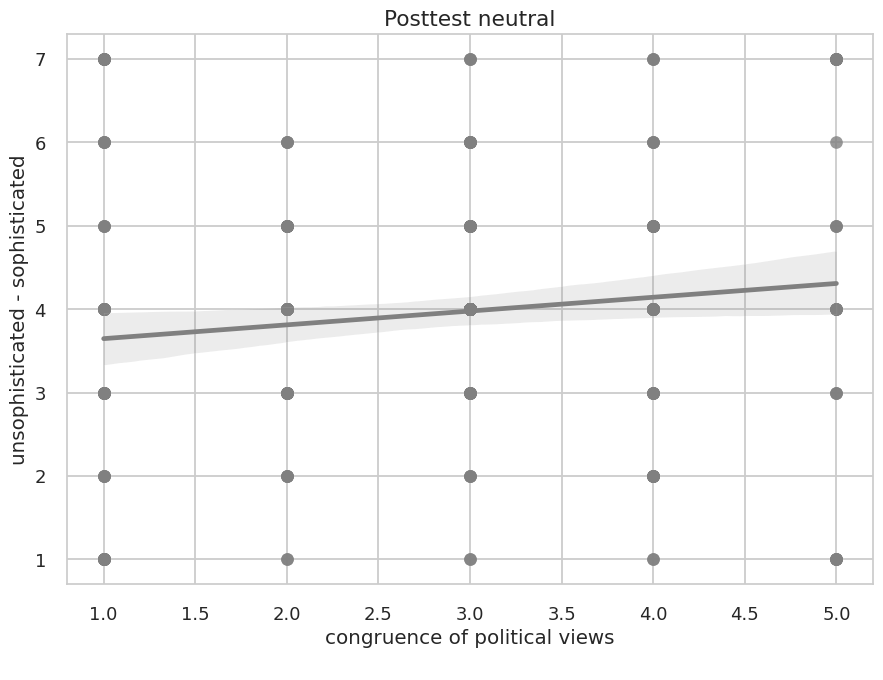

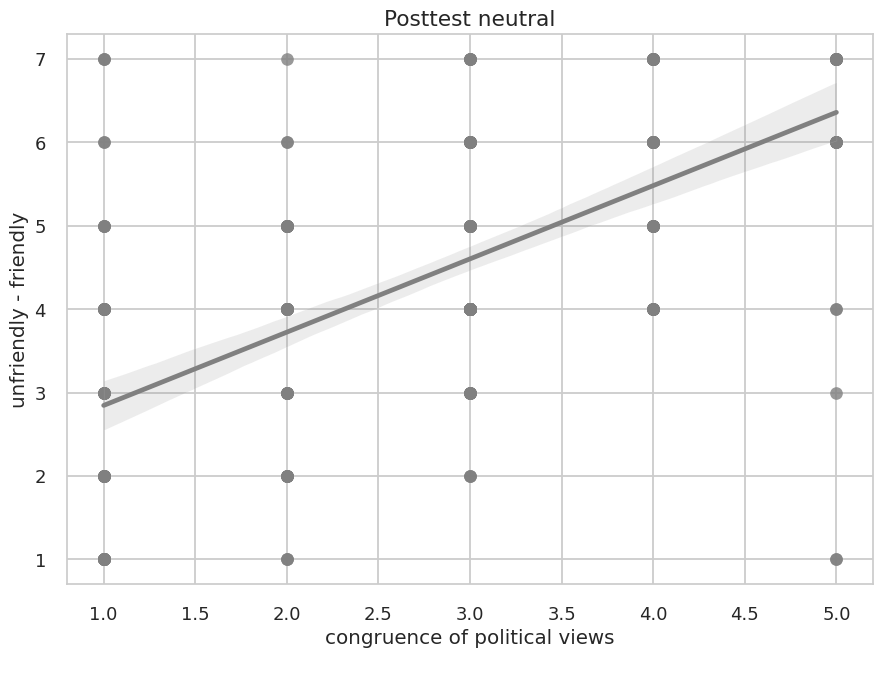

In [ ]:
for i, v in enumerate(dyfer_po):
  sns.regplot(data = p3_neu, y = v, x = 'p4_r1', color = 'grey')
  plt.ylabel(list(map_post.values())[i])
  plt.xlabel('congruence of political views\n')
  plt.title('Posttest neutral')
  plt.show()

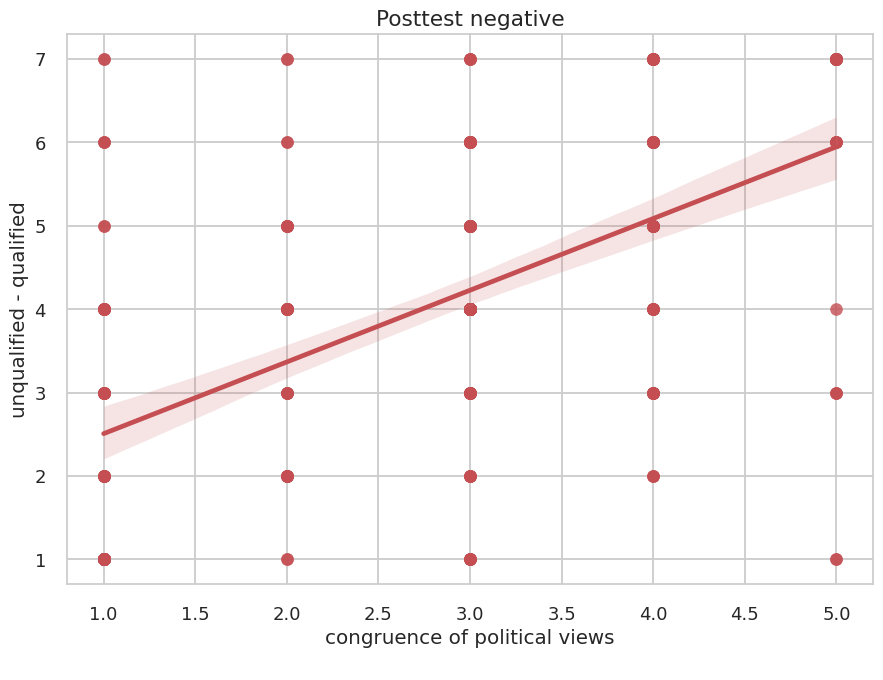

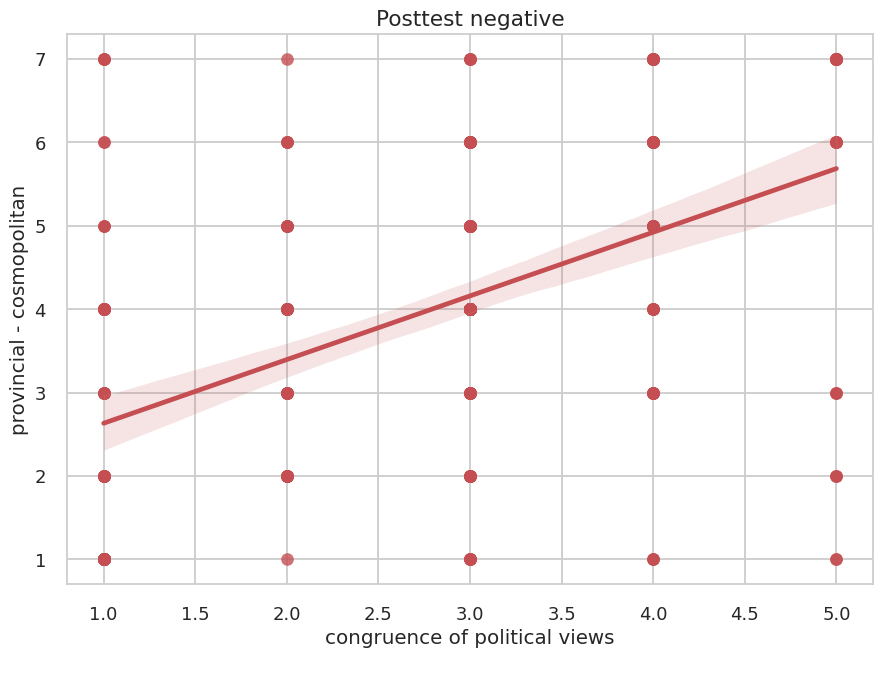

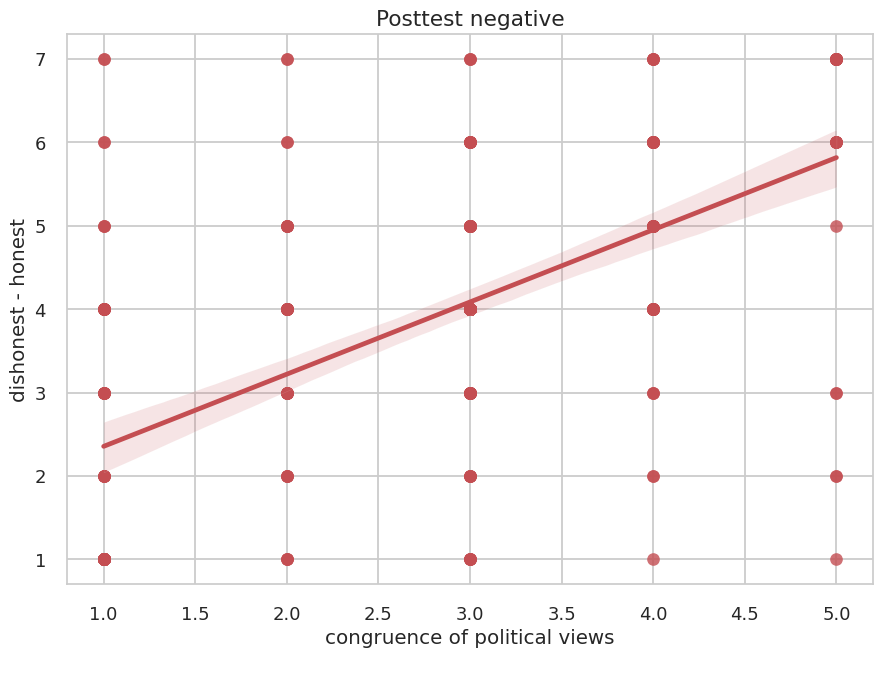

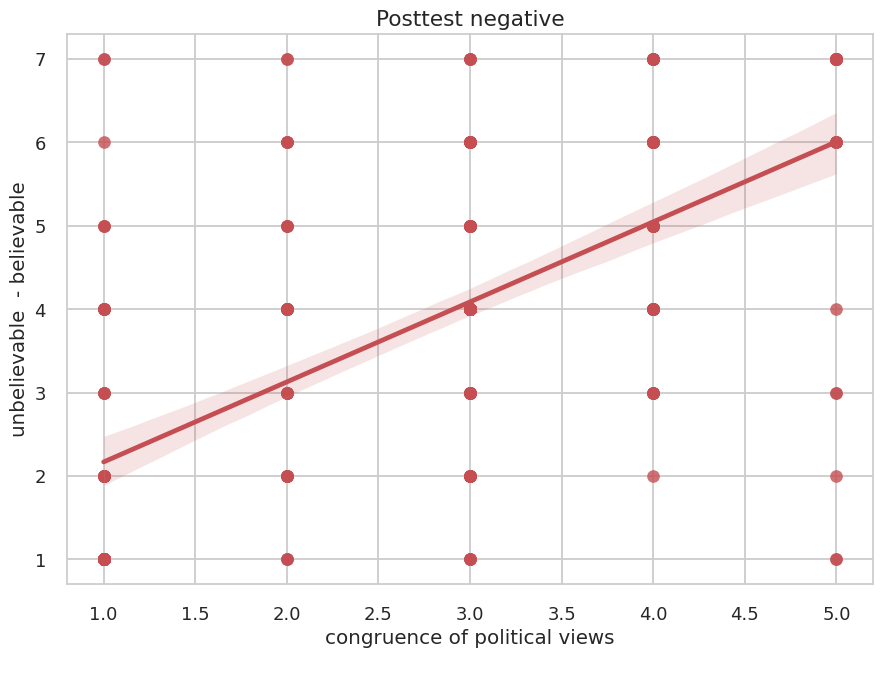

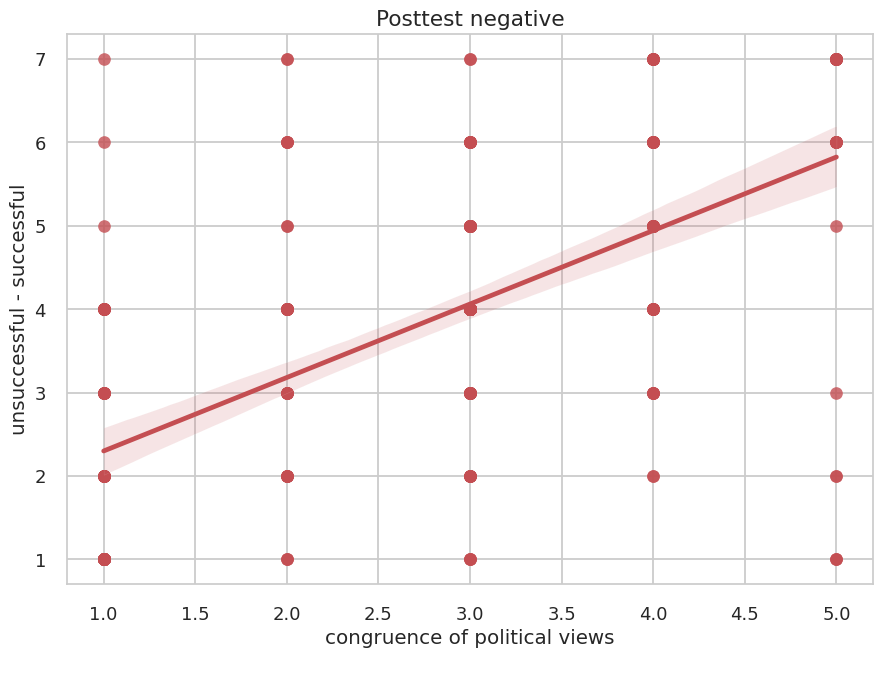

...

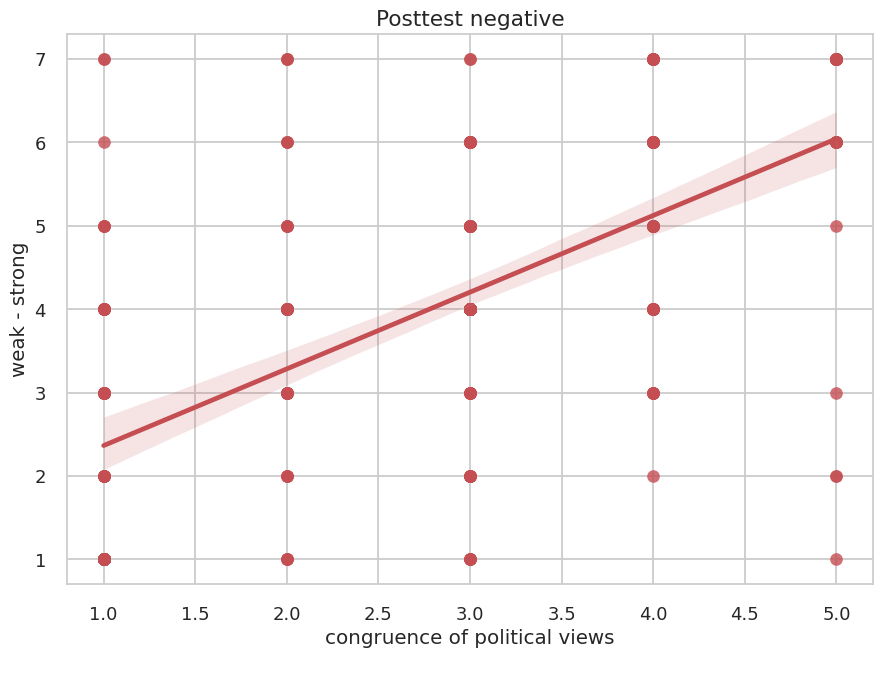

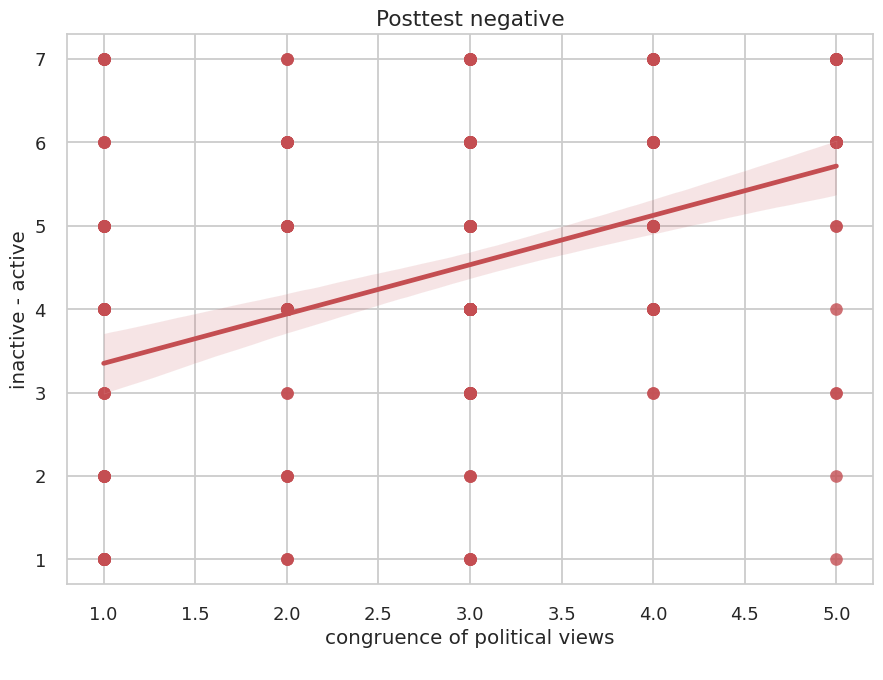

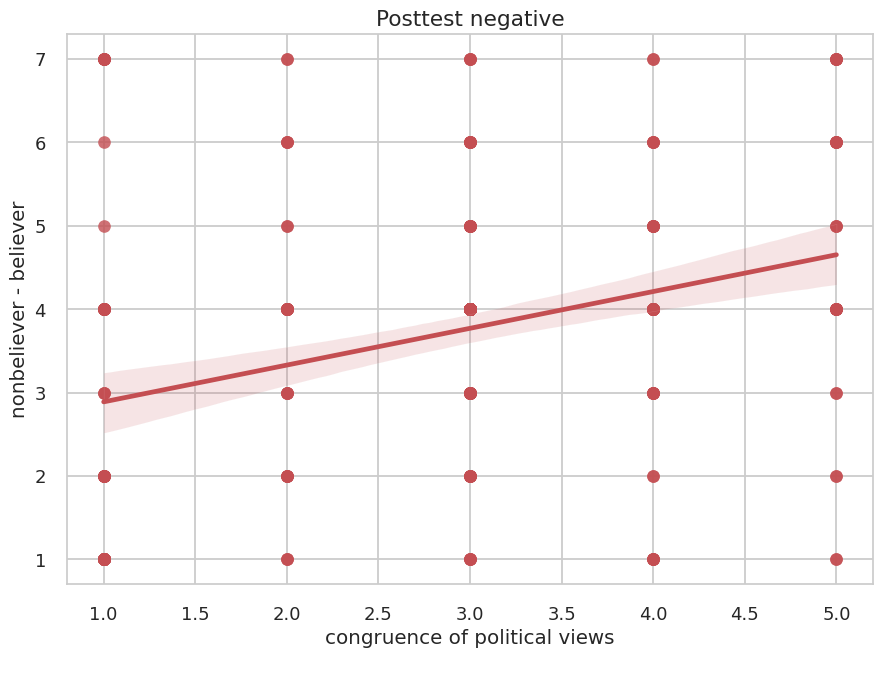

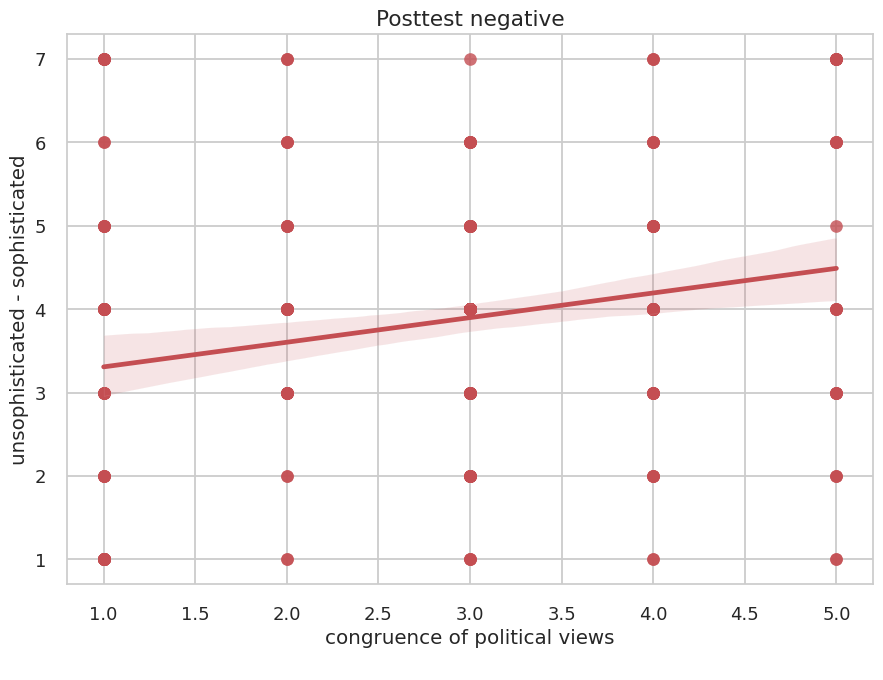

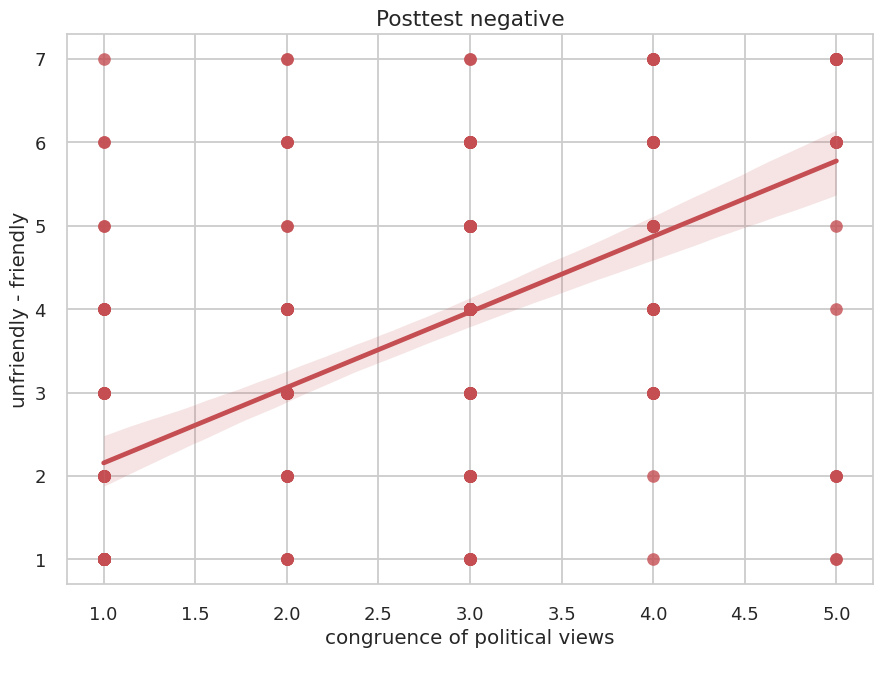

In [ ]:
for i, v in enumerate(dyfer_po):
  sns.regplot(data = p3_neg, y = v, x = 'p4_r1', color = 'r')
  plt.ylabel(list(map_post.values())[i])
  plt.xlabel('congruence of political views\n')
  plt.title('Posttest negative')
  plt.show()

In [ ]:
df.p4_r1 = df.p4_r1.fillna(3)

array([ 4.,  3.,  1.,  5.,  2., nan])

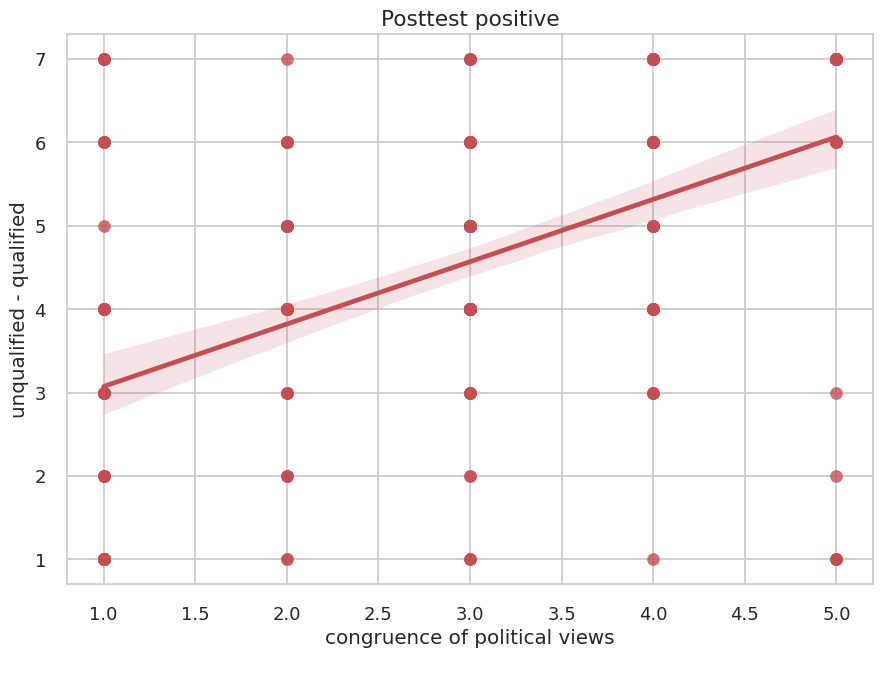

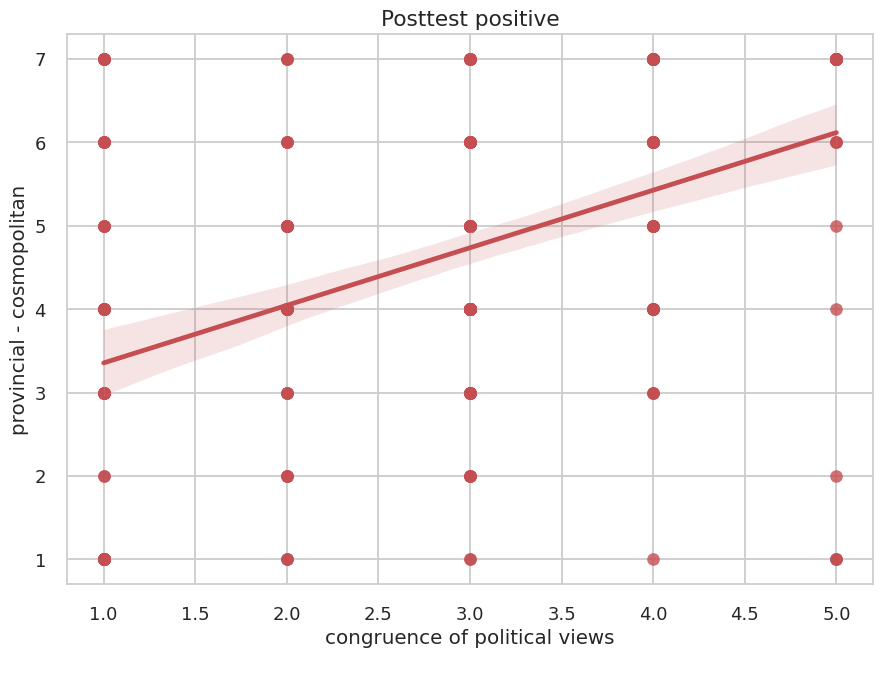

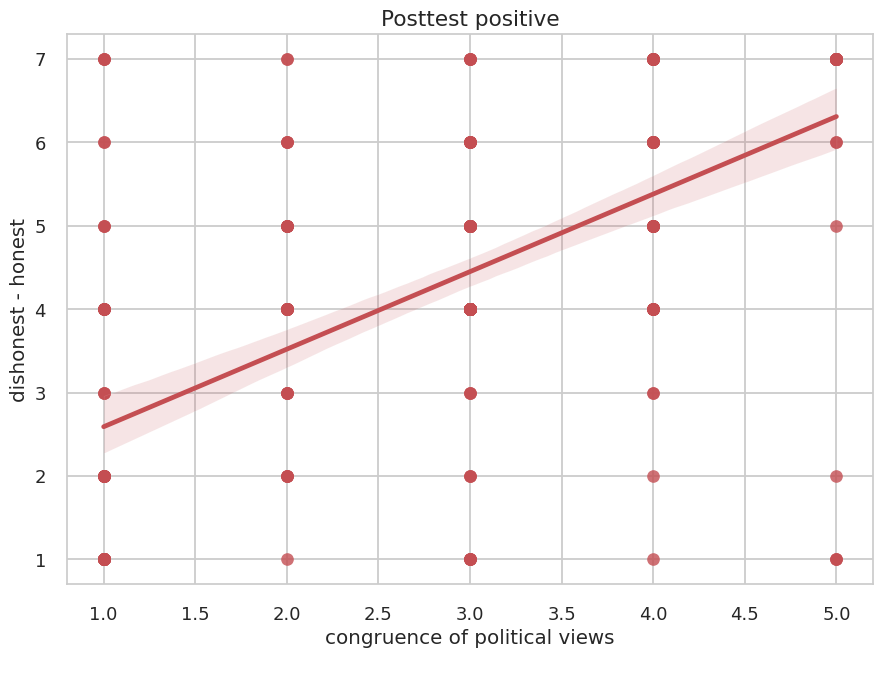

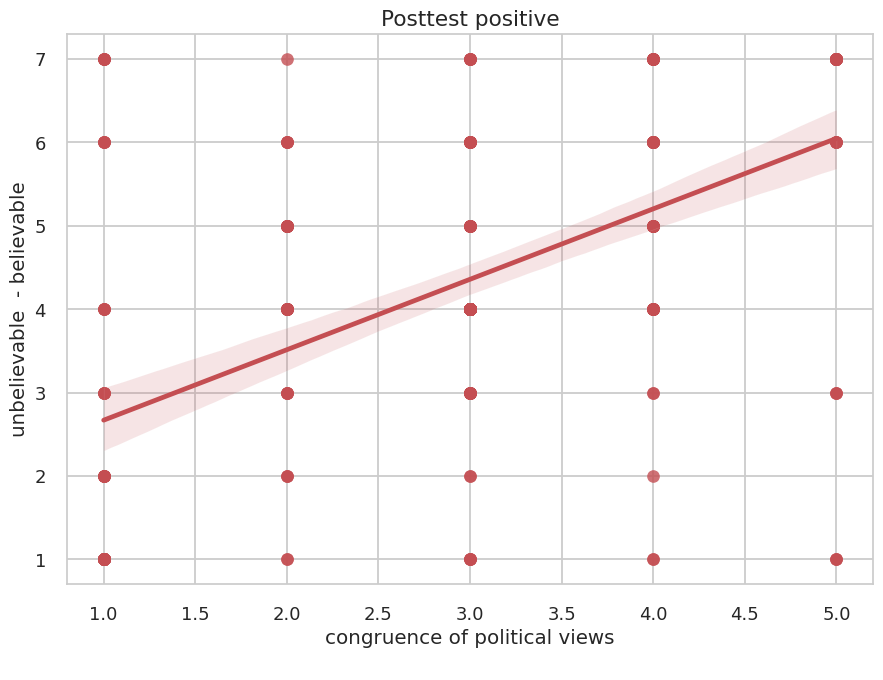

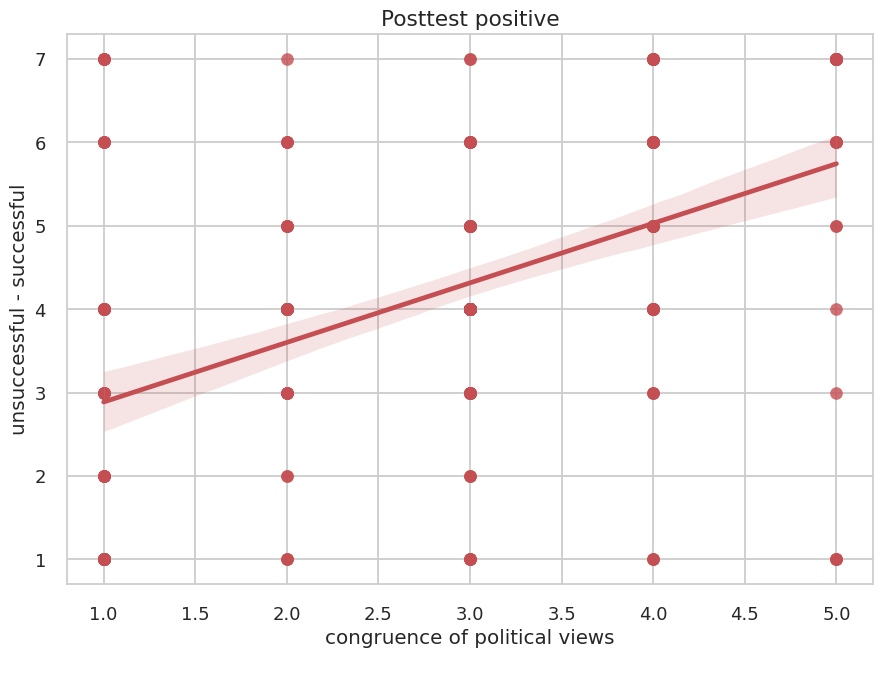

...

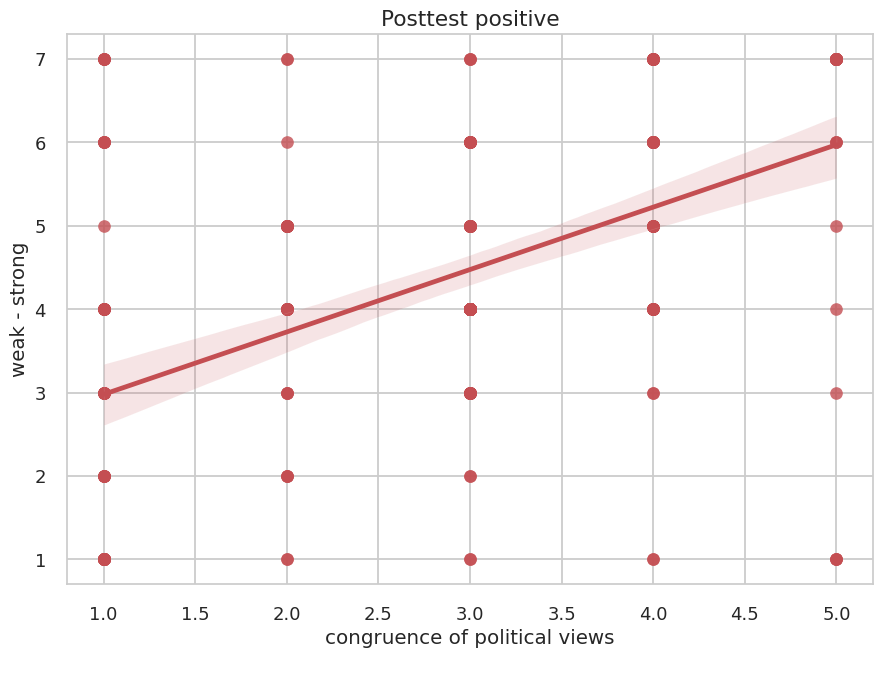

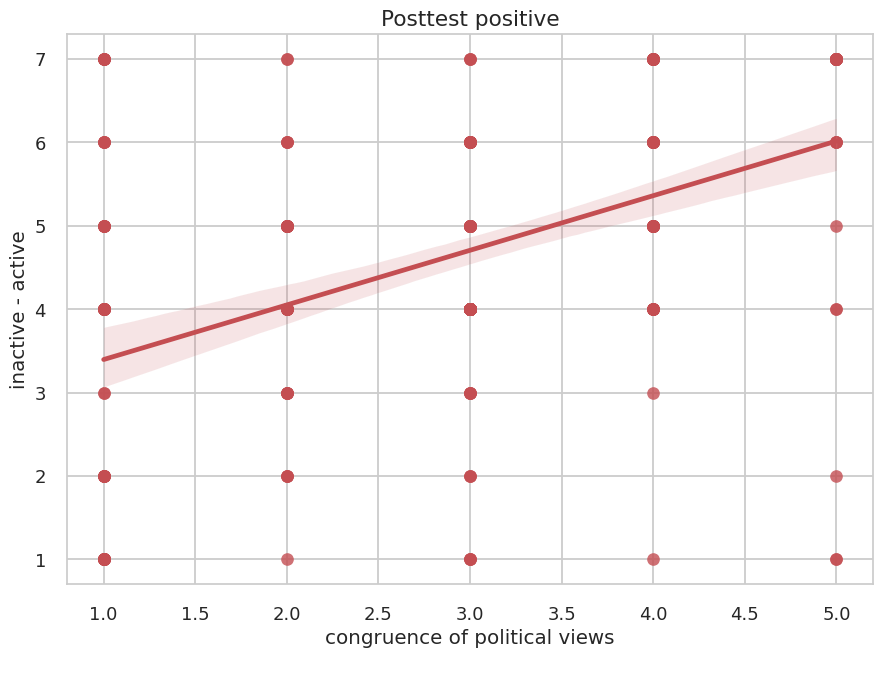

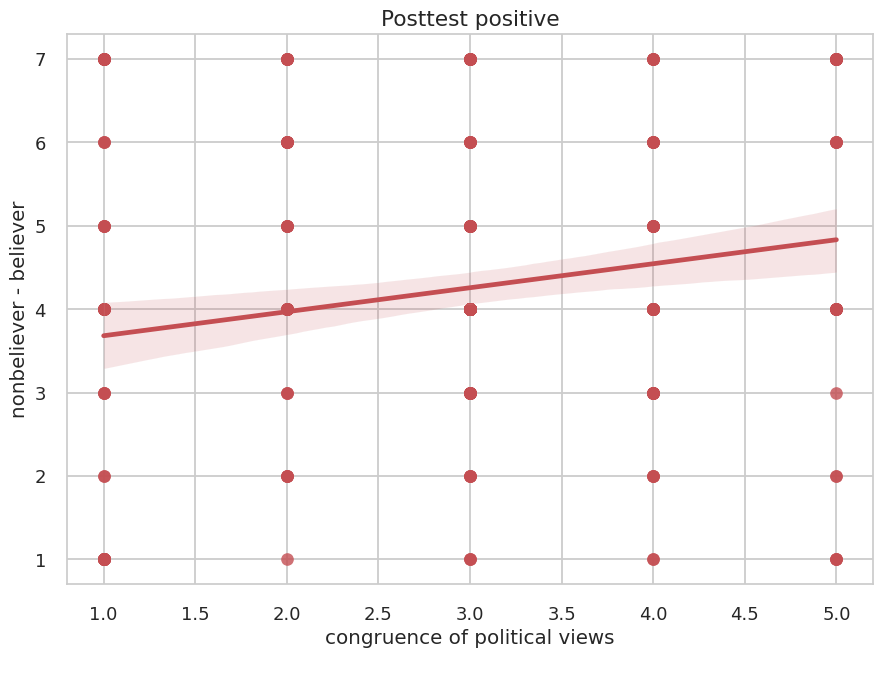

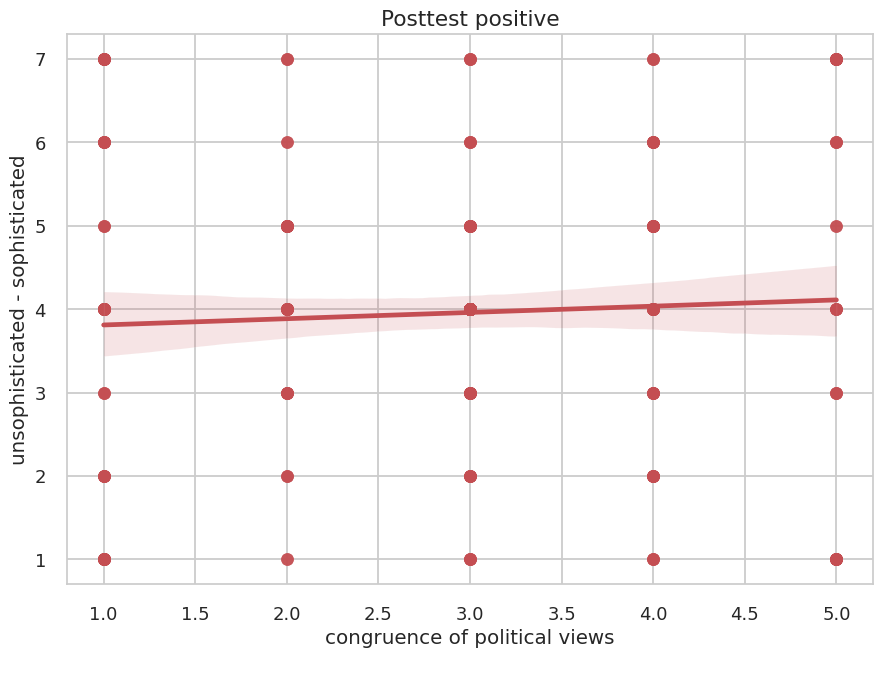

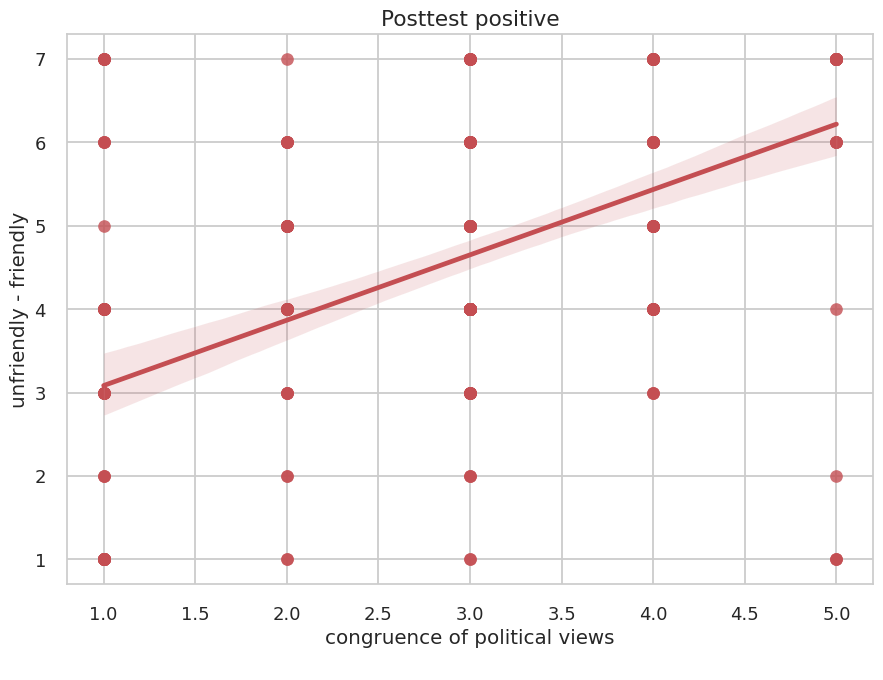

In [ ]:
for i, v in enumerate(dyfer_po):
  sns.regplot(data = p3_pos, y = v, x = 'p4_r1', color = 'r')
  plt.ylabel(list(map_post.values())[i])
  plt.xlabel('congruence of political views\n')
  plt.title('Posttest positive')
  plt.show()

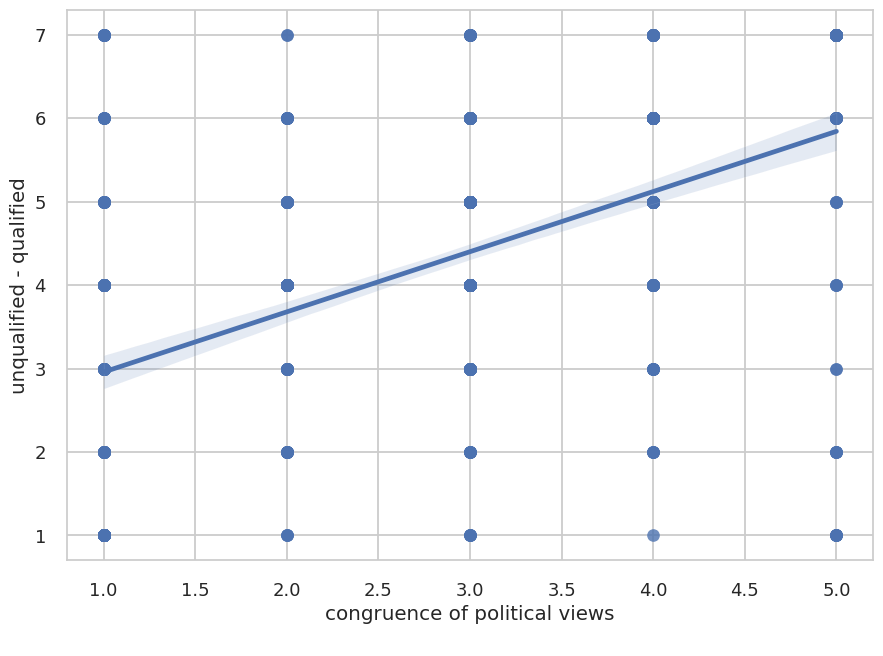

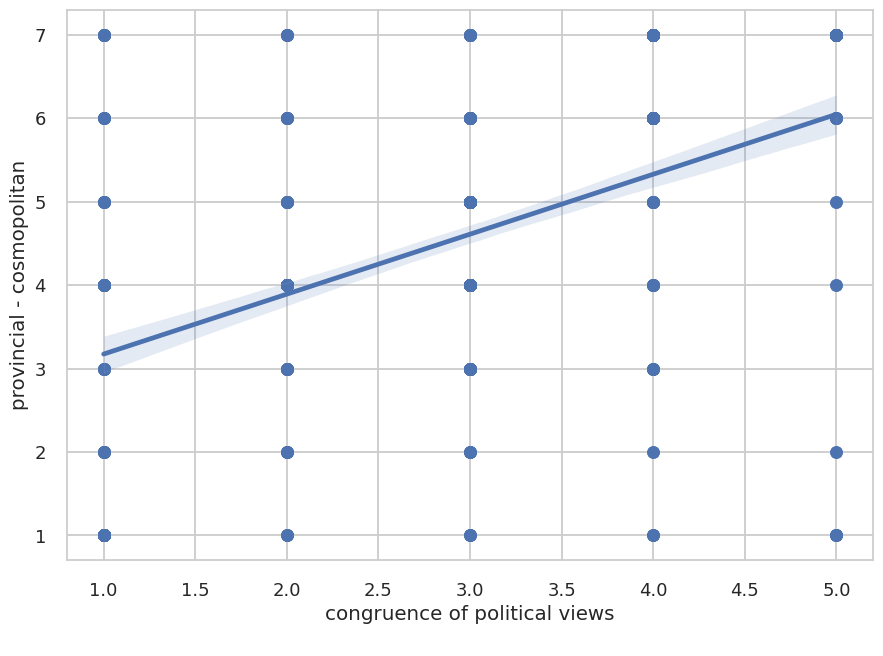

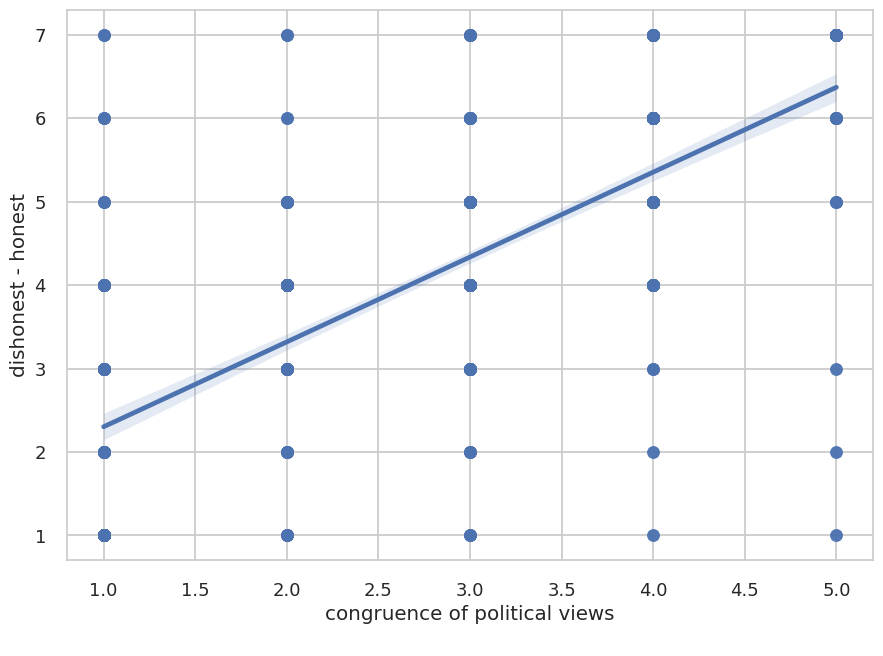

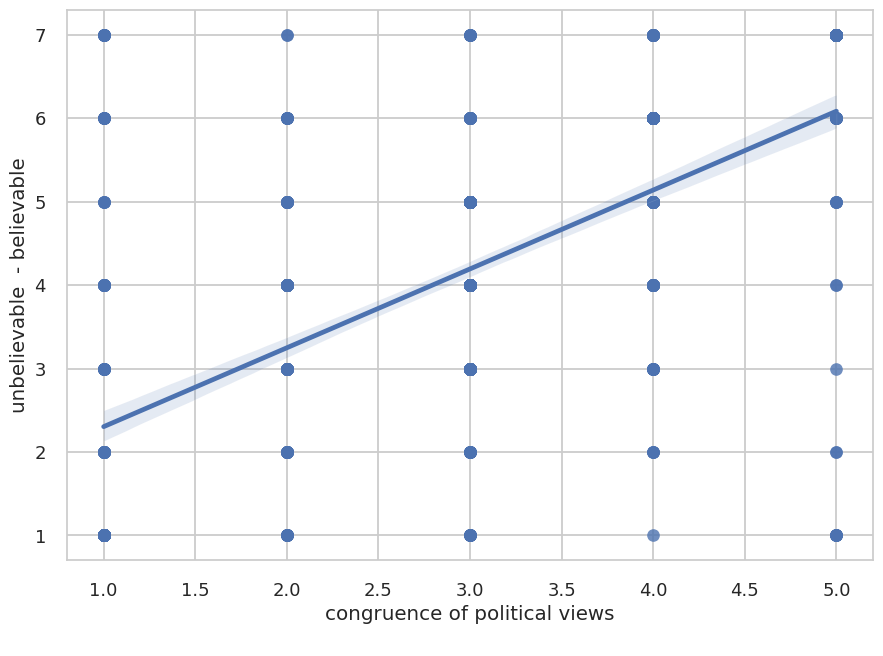

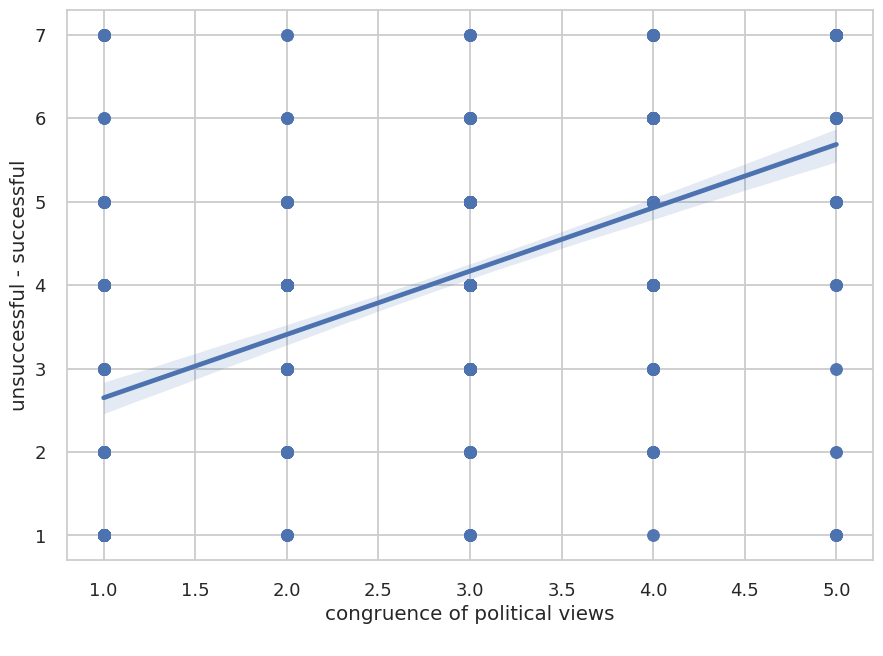

...

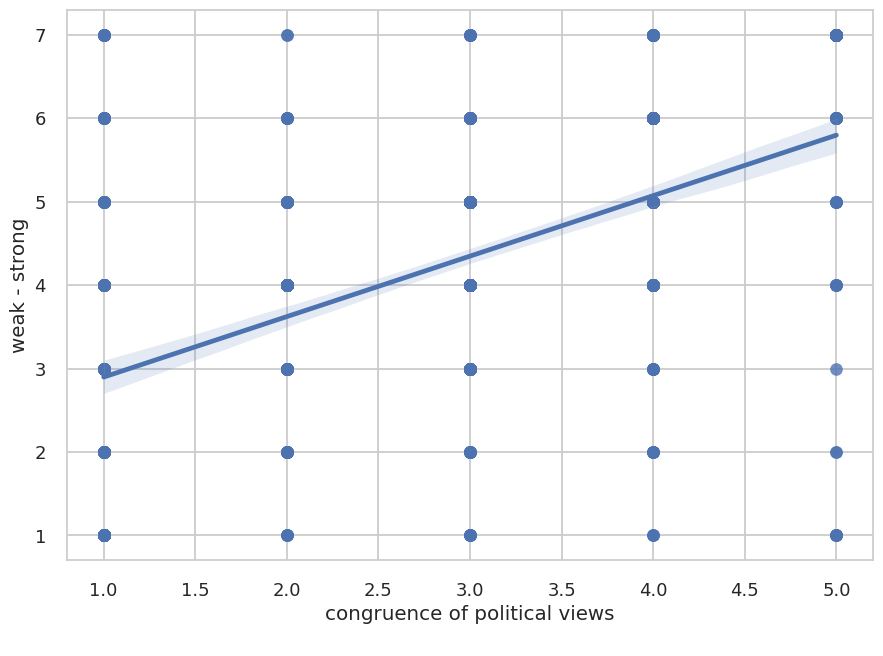

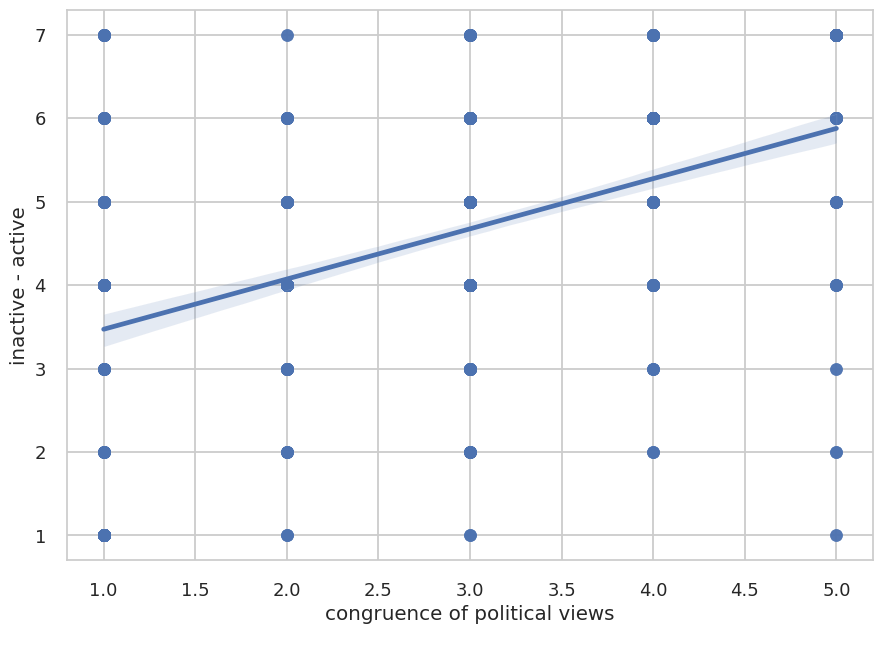

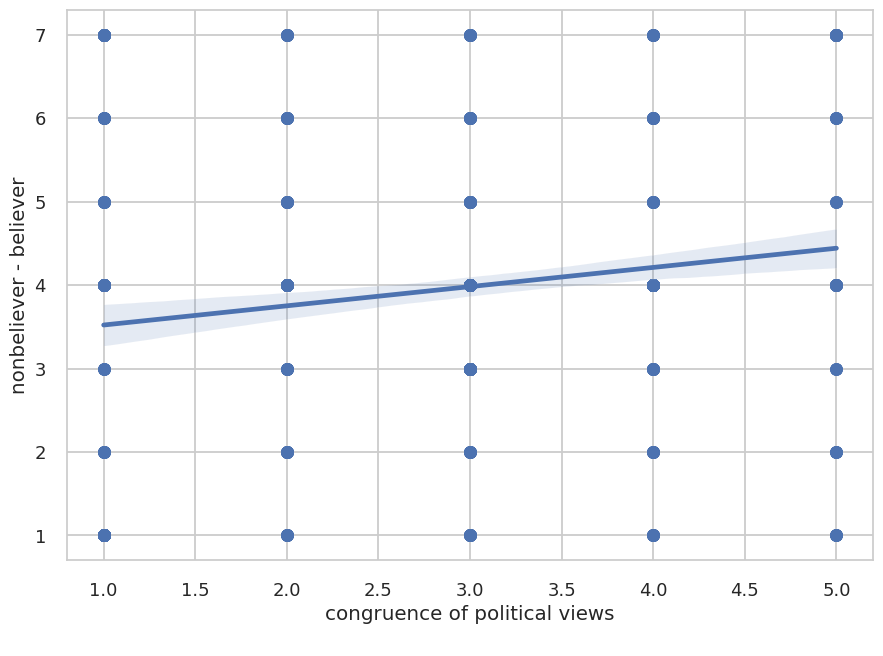

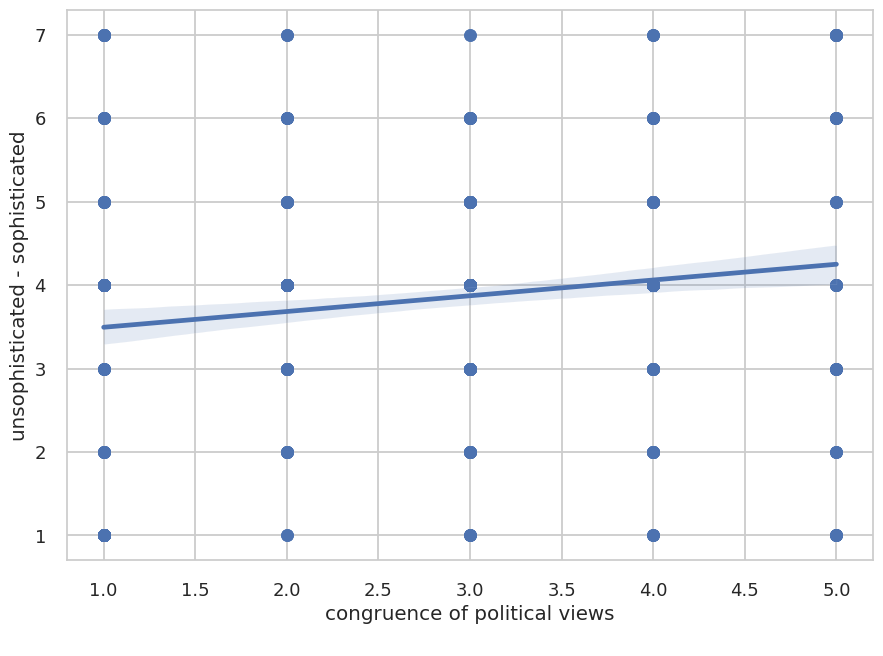

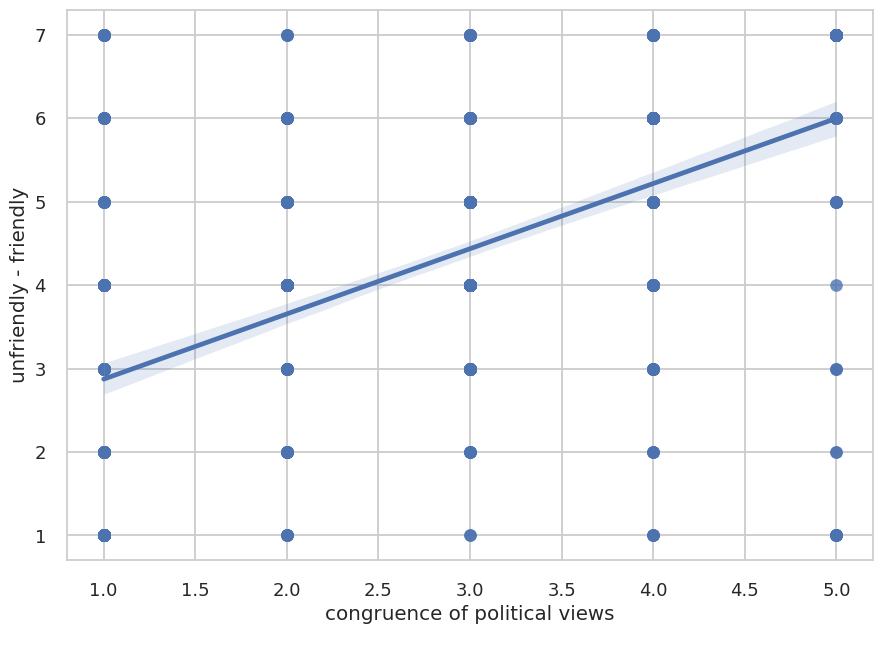

In [ ]:
for i, v in enumerate(dyfer_przed):
  sns.regplot(data = df, y = v, x = 'p4_r1')
  plt.ylabel(list(map_post.values())[i])
  plt.xlabel('congruence of political views\n')
  plt.show()

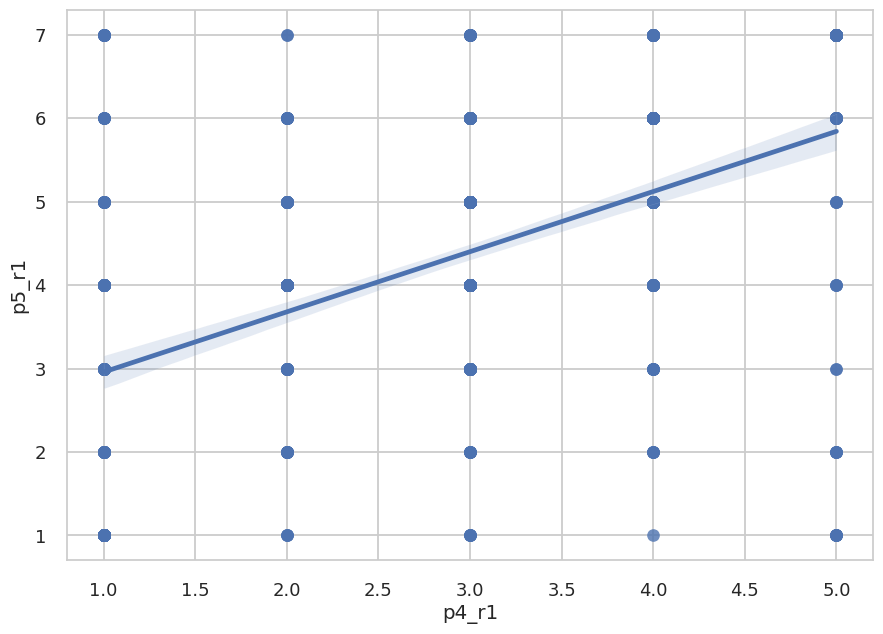

In [ ]:
sns.regplot(data = df, y = 'p5_r1', x = 'p4_r1')
plt.show()

In [ ]:
df_ktau[df_ktau.category.isin(['views',  'views pos', 'views neg','views neu'])].to_excel('/content/drive/MyDrive/temporal.xlsx')

##anova

####stand ANOVA

In [38]:
# https://www.statology.org/three-way-anova-python/

# Three-Way ANOVA in Python

In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [39]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [ ]:
df.groupby(['stimulus', 'politician']).size()

stimulus  politician
negative  KB            103
          RB            111
          RT            109
neutral   KB            114
          RB            105
          RT            104
positive  KB            106
          RB            100
          RT            106
dtype: int64

In [ ]:
for c in dyfer_przed:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[c],
                          groups = df['poglady_3'],
                          alpha=0.05)
  #display results
  print(tukey)

p5_r1
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower   upper  reject
-------------------------------------------------------
   agree disagree  -2.0948   0.0 -2.3801 -1.8096   True
   agree  neutral  -1.1126   0.0 -1.4054 -0.8199   True
disagree  neutral   0.9822   0.0  0.7093   1.255   True
-------------------------------------------------------
p5_r2
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower   upper  reject
-------------------------------------------------------
   agree disagree  -2.1382   0.0 -2.4565 -1.8198   True
   agree  neutral  -1.3145   0.0 -1.6413 -0.9878   True
disagree  neutral   0.8236   0.0  0.5191  1.1282   True
-------------------------------------------------------
p5_r3
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower   upper  reject
-------------------------------------------------------
   agree disagree  -2.8906   0

In [ ]:
for dep in dyfer_przed:
  print(dep)
  model = ols(f"""{dep} ~ C(sex)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')  

p5_r1
             sum_sq     df       F  PR(>F)
C(sex)      19.3110    2.0  3.2181  0.0405
Residual  2865.3738  955.0     NaN     NaN

 ********************************
p5_r2
             sum_sq     df       F  PR(>F)
C(sex)      10.9044    2.0  1.5121   0.221
Residual  3443.5517  955.0     NaN     NaN

 ********************************
p5_r3
             sum_sq     df       F  PR(>F)
C(sex)      22.7699    2.0  3.5132  0.0302
Residual  3094.7917  955.0     NaN     NaN

 ********************************
p5_r4
             sum_sq     df       F  PR(>F)
C(sex)      18.1016    2.0  2.5277  0.0804
Residual  3419.5602  955.0     NaN     NaN

 ********************************
p5_r5
             sum_sq     df       F  PR(>F)
C(sex)      20.8330    2.0  3.5025  0.0305
Residual  2840.1659  955.0     NaN     NaN

 ********************************
p5_r6
             sum_sq     df       F  PR(>F)
C(sex)      28.5251    2.0  4.2807  0.0141
Residual  3181.9227  955.0     NaN     NaN

 *************

In [ ]:
for c in dyfer_przed:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[df.sex!=4][c],
                          groups = df[df.sex!=4]['sex'],
                          alpha=0.05)
  #display results
  print(tukey) # p-value wychodzi tak samo jak w tescie t

p5_r1
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     1      2  -0.2213 0.0489 -0.4416 -0.001   True
---------------------------------------------------
p5_r2
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     1      2  -0.1354 0.2716 -0.3769 0.1061  False
---------------------------------------------------
p5_r3
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.2348 0.0445 -0.4637 -0.0058   True
----------------------------------------------------
p5_r4
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     1      2  -0.1942 0.1136 -0.43

In [ ]:
for dep in dyfer_przed:
  print(dep)

  model = ols(f"""{dep} ~ C(age)""", data = df).fit()
  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')  

p5_r1
             sum_sq     df       F  PR(>F)
C(age)      20.4661    4.0  1.7024  0.1473
Residual  2864.2187  953.0     NaN     NaN

 ********************************
p5_r2
             sum_sq     df       F  PR(>F)
C(age)       7.5492    4.0  0.5218  0.7197
Residual  3446.9069  953.0     NaN     NaN

 ********************************
p5_r3
             sum_sq     df       F  PR(>F)
C(age)      26.0240    4.0  2.0055  0.0917
Residual  3091.5376  953.0     NaN     NaN

 ********************************
p5_r4
             sum_sq     df       F  PR(>F)
C(age)      30.9801    4.0  2.1666  0.0709
Residual  3406.6817  953.0     NaN     NaN

 ********************************
p5_r5
             sum_sq     df       F  PR(>F)
C(age)      15.7066    4.0  1.3152  0.2624
Residual  2845.2924  953.0     NaN     NaN

 ********************************
p5_r6
             sum_sq     df       F  PR(>F)
C(age)      20.0706    4.0  1.4988  0.2004
Residual  3190.3772  953.0     NaN     NaN

 *************

In [ ]:
df.groupby(['stimulus', 'poglady_3'])[cc_diff].mean().round(3)

diff_r1  diff_r2  diff_r3  diff_r4  diff_r5  diff_r6  \
stimulus poglady_3                                                         
negative agree        0.116   -0.558   -0.384   -0.093    0.035    0.047   
         disagree    -0.186   -0.669   -0.051    0.153   -0.051   -0.034   
         neutral     -0.126   -0.412   -0.277   -0.067   -0.101   -0.336   
neutral  agree        0.132    0.011   -0.044    0.143    0.165    0.121   
         disagree    -0.074   -0.089    0.230    0.067    0.037    0.133   
         neutral      0.206   -0.010    0.072    0.113    0.103    0.330   
positive agree        0.371    0.423    0.082    0.021    0.289    0.247   
         disagree     0.266    0.450    0.349    0.394    0.358    0.312   
         neutral      0.160    0.340    0.189    0.198    0.160    0.066   

                    diff_r7  diff_r8  diff_r9  diff_r10  diff_r11  diff_r12  \
stimulus poglady_3                                                            
negative agree       -0.384   -0.558   -0.605    -0.012    -0.023     0.047   
         disagree    -0.229   -0.551   -0.627    -0.237     0.017    -0.356   
         neutral     -0.235   -0.412   -0.655    -0.067    -0.050    -0.176   
neutral  agree        0.000    0.220    0.066     0.231    -0.121     0.011   
         disagree     0.104   -0.059    0.363    -0.081     0.133    -0.163   
         neutral      0.000    0.155    0.165     0.124     0.041     0.330   
positive agree        0.062    0.258    0.216     0.320     0.113     0.278   
         disagree     0.394    0.239    0.330     0.257    -0.037     0.257   
         neutral      0.132    0.189    0.113     0.085     0.038     0.245   

                    diff_r13  diff_r14  
stimulus poglady_3                      
negative agree         0.326    -0.442  
         disagree      0.076    -0.508  
         neutral       0.034    -0.429  
neutral  agree        -0.066     0.209  
         disagree     -0.163    -0.237  
         neutral       0.144     0.175  
positive agree        -0.041     0.495  
         disagree      0.422     0.239  
         neutral      -0.009     0.179

In [ ]:
for dep in cc_diff:
  print(dep)
  model = ols(f"""{dep} ~ C(stimulus)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')  

diff_r1
                sum_sq     df       F  PR(>F)
C(stimulus)    19.1178    2.0  4.6726  0.0096
Residual     1953.6933  955.0     NaN     NaN

 ********************************
diff_r2
                sum_sq     df        F  PR(>F)
C(stimulus)   143.2188    2.0  30.7389     0.0
Residual     2224.7686  955.0      NaN     NaN

 ********************************
diff_r3
                sum_sq     df       F  PR(>F)
C(stimulus)    32.7716    2.0  9.9393  0.0001
Residual     1574.4100  955.0     NaN     NaN

 ********************************
diff_r4
                sum_sq     df       F  PR(>F)
C(stimulus)     6.6972    2.0  1.6711  0.1886
Residual     1913.6546  955.0     NaN     NaN

 ********************************
diff_r5
                sum_sq     df       F  PR(>F)
C(stimulus)    15.8677    2.0  4.2355  0.0147
Residual     1788.9016  955.0     NaN     NaN

 ********************************
diff_r6
                sum_sq     df       F  PR(>F)
C(stimulus)    22.2951    2.0  5.9276 

In [ ]:
df.groupby('stimulus')[cc_diff].mean().round(3)

,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diff_r10,diff_r11,diff_r12,diff_r13,diff_r14
stimulus,,,,,,,,,,,,,,
negative,-0.084,-0.545,-0.223,0.006,-0.046,-0.124,-0.272,-0.502,-0.632,-0.115,-0.019,-0.183,0.127,-0.461
neutral,0.068,-0.037,0.105,0.102,0.093,0.189,0.043,0.084,0.220,0.068,0.034,0.034,-0.043,0.012
positive,0.263,0.404,0.212,0.212,0.269,0.208,0.202,0.228,0.221,0.218,0.035,0.260,0.131,0.298


In [ ]:
for c in cc_diff:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[c],
                          groups = df['stimulus'],
                          alpha=0.05)
  #display results
  print(tukey)

diff_r1
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj   lower  upper  reject
-------------------------------------------------------
negative  neutral   0.1517  0.369 -0.1125 0.4159  False
negative positive   0.3464 0.0066  0.0799 0.6129   True
 neutral positive   0.1947 0.2001 -0.0718 0.4612  False
-------------------------------------------------------
diff_r2
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower  upper  reject
------------------------------------------------------
negative  neutral   0.5077 0.0001 0.2258 0.7897   True
negative positive   0.9487    0.0 0.6643 1.2331   True
 neutral positive    0.441 0.0008 0.1566 0.7254   True
------------------------------------------------------
diff_r3
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower  upper  reject
------------------------------------------------------
negative  neutral   0.3282 0.0034 

In [ ]:
for dep in cc_diff:
  print(dep)
  model = ols(f"""{dep} ~ C(stimulus) + C(poglady_3)+
               C(stimulus):C(poglady_3)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')  

diff_r1
                             sum_sq     df       F  PR(>F)
C(stimulus)                 18.2817    2.0  4.4678  0.0117
C(poglady_3)                 6.7803    2.0  1.6570  0.1913
C(stimulus):C(poglady_3)     5.3179    4.0  0.6498  0.6271
Residual                  1941.5951  949.0     NaN     NaN

 ********************************
diff_r2
                             sum_sq     df        F  PR(>F)
C(stimulus)                142.9089    2.0  30.5524  0.0000
C(poglady_3)                 1.2905    2.0   0.2759  0.7589
C(stimulus):C(poglady_3)     4.0069    4.0   0.4283  0.7883
Residual                  2219.4712  949.0      NaN     NaN

 ********************************
diff_r3
                             sum_sq     df        F  PR(>F)
C(stimulus)                 33.2369    2.0  10.1070  0.0000
C(poglady_3)                13.7921    2.0   4.1940  0.0154
C(stimulus):C(poglady_3)     0.2176    4.0   0.0331  0.9979
Residual                  1560.4003  949.0      NaN     NaN

 *********

In [ ]:
for c in cc_diff[-2:-1]:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[c],
                          groups = df['poglady_3_stimulus'],
                          alpha=0.05)
  #display results
  print(tukey)

diff_r13
           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
      group1            group2      meandiff p-adj   lower  upper  reject
-------------------------------------------------------------------------
   agree_negative     agree_neutral  -0.3915 0.7136 -1.0861 0.3031  False
   agree_negative    agree_positive  -0.3668 0.7666 -1.0509 0.3173  False
   agree_negative disagree_negative  -0.2493 0.9599 -0.9042 0.4055  False
   agree_negative  disagree_neutral  -0.4885 0.2942 -1.1258 0.1487  False
   agree_negative disagree_positive   0.0964    1.0 -0.5697 0.7626  False
   agree_negative  neutral_negative   -0.292 0.9022 -0.9457 0.3617  False
   agree_negative   neutral_neutral  -0.1813 0.9962 -0.8653 0.5028  False
   agree_negative  neutral_positive   -0.335 0.8294 -1.0053 0.3353  False
    agree_neutral    agree_positive   0.0247    1.0 -0.6493 0.6987  False
    agree_neutral disagree_negative   0.1422  0.999 -0.5022 0.7866  False
    agree_neutral  disagree_n

In [ ]:
df[dyfer_przed].corr().round(2)

,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14
p5_r1,1.00,0.65,0.61,0.73,0.74,0.72,0.63,0.58,0.48,0.72,0.43,0.30,0.32,0.69
p5_r2,0.65,1.00,0.54,0.63,0.63,0.63,0.54,0.55,0.48,0.62,0.39,0.05,0.17,0.65
p5_r3,0.61,0.54,1.00,0.71,0.65,0.65,0.79,0.57,0.68,0.62,0.60,0.22,0.21,0.67
p5_r4,0.73,0.63,0.71,1.00,0.77,0.78,0.70,0.65,0.55,0.71,0.44,0.33,0.30,0.74
p5_r5,0.74,0.63,0.65,0.77,1.00,0.74,0.65,0.60,0.50,0.79,0.48,0.33,0.32,0.70
p5_r6,0.72,0.63,0.65,0.78,0.74,1.00,0.67,0.61,0.53,0.74,0.44,0.29,0.31,0.73
p5_r7,0.63,0.54,0.79,0.70,0.65,0.67,1.00,0.56,0.65,0.65,0.58,0.25,0.19,0.64
p5_r8,0.58,0.55,0.57,0.65,0.60,0.61,0.56,1.00,0.54,0.59,0.39,0.32,0.29,0.69
p5_r9,0.48,0.48,0.68,0.55,0.50,0.53,0.65,0.54,1.00,0.46,0.46,0.16,0.10,0.59
p5_r10,0.72,0.62,0.62,0.71,0.79,0.74,0.65,0.59,0.46,1.00,0.47,0.34,0.33,0.68


In [ ]:
for dep in cc_diff:
  print(dep)
  model = ols(f"""{dep} ~ C(stimulus) + C(sex)+
               C(stimulus):C(sex)""", data = df[df.sex!=4]).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')  

diff_r1
                       sum_sq     df       F  PR(>F)
C(stimulus)           19.0570    2.0  4.7380  0.0090
C(sex)                 0.0140    1.0  0.0069  0.9336
C(stimulus):C(sex)     4.2261    2.0  1.0507  0.3501
Residual            1912.5169  951.0     NaN     NaN

 ********************************
diff_r2
                       sum_sq     df        F  PR(>F)
C(stimulus)          143.7299    2.0  30.8640  0.0000
C(sex)                 1.6122    1.0   0.6924  0.4056
C(stimulus):C(sex)     8.8103    2.0   1.8919  0.1514
Residual            2214.3448  951.0      NaN     NaN

 ********************************
diff_r3
                       sum_sq     df       F  PR(>F)
C(stimulus)           32.8225    2.0  9.9273  0.0001
C(sex)                 0.0577    1.0  0.0349  0.8518
C(stimulus):C(sex)     2.1988    2.0  0.6650  0.5145
Residual            1572.1423  951.0     NaN     NaN

 ********************************
diff_r4
                       sum_sq     df       F  PR(>F)
C(stimulus

In [ ]:
for dep in cc_diff:
  print(dep)
  model = ols(f"""{dep} ~ C(stimulus) + C(polityk) +
               C(stimulus):C(polityk)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')  

diff_r1
                           sum_sq     df       F  PR(>F)
C(stimulus)               19.2878    2.0  4.7901  0.0085
C(polityk)                 2.7378    2.0  0.6799  0.5069
C(stimulus):C(polityk)     5.4223    4.0  0.6733  0.6106
Residual                1908.5969  948.0     NaN     NaN

 ********************************
diff_r2
                           sum_sq     df        F  PR(>F)
C(stimulus)              141.9110    2.0  30.5021  0.0000
C(polityk)                 5.4547    2.0   1.1724  0.3101
C(stimulus):C(polityk)    14.0309    4.0   1.5079  0.1977
Residual                2205.2816  948.0      NaN     NaN

 ********************************
diff_r3
                           sum_sq     df       F  PR(>F)
C(stimulus)               32.6777    2.0  9.9373  0.0001
C(polityk)                 7.0330    2.0  2.1387  0.1184
C(stimulus):C(polityk)     8.6754    4.0  1.3191  0.2609
Residual                1558.6904  948.0     NaN     NaN

 ********************************
diff_r4
   

In [ ]:
for c in cc_diff[7:8]:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[c],
                          groups = df['stimulus_politician'],
                          alpha=0.05)
  #display results
  print(tukey)

diff_r8
     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
   group1      group2   meandiff p-adj   lower  upper  reject
-------------------------------------------------------------
negative_KB negative_RB  -0.1112 0.9995 -0.6746 0.4523  False
negative_KB negative_RT   0.3532 0.5859 -0.2128 0.9191  False
negative_KB  neutral_KB   0.5299 0.0802   -0.03 1.0898  False
negative_KB  neutral_RB   0.8397 0.0002  0.2685 1.4108   True
negative_KB  neutral_RT   0.6402 0.0155  0.0677 1.2127   True
negative_KB positive_KB   0.6769 0.0072   0.107 1.2467   True
negative_KB positive_RB   1.0525    0.0  0.4743 1.6307   True
negative_KB positive_RT   0.7146 0.0033  0.1448 1.2844   True
negative_RB negative_RT   0.4643 0.1881  -0.091 1.0197  False
negative_RB  neutral_KB   0.6411 0.0091  0.0919 1.1902   True
negative_RB  neutral_RB   0.9508    0.0  0.3902 1.5115   True
negative_RB  neutral_RT   0.7514 0.0012  0.1893 1.3134   True
negative_RB positive_KB    0.788 0.0004  0.2287 1.3473   True


In [ ]:
# https://www.statology.org/anova-post-hoc-tests/  t-test w bonferroni correction

# Tukey test is the preferred post-hoc test but Bonferroni has more power when the number of comparisons is small. 
# Tukey is rrecommended and more powerful when testing large numbers of means.
# The Bonferroni test also tends to be overly conservative, which reduces its statistical power.
# https://www.researchgate.net/post/Which_post_hoc_test_is_better_Tukey_HSD_or_Bonfferoni

In [ ]:
df['diff_r1'] = df['p9_r1'] - df['p5_r1']
df['diff_r2'] = df['p9_r2'] - df['p5_r2']
df['diff_r3'] = df['p9_r3'] - df['p5_r3']
df['diff_r4'] = df['p9_r4'] - df['p5_r4']
df['diff_r5'] = df['p9_r5'] - df['p5_r5']
df['diff_r6'] = df['p9_r6'] - df['p5_r6']
df['diff_r7'] = df['p9_r7'] - df['p5_r7']
df['diff_r8'] = df['p9_r8'] - df['p5_r8']
df['diff_r9'] = df['p9_r9'] - df['p5_r9']
df['diff_r10'] = df['p9_r10'] - df['p5_r10']
df['diff_r11'] = df['p9_r11'] - df['p5_r11']
df['diff_r12'] = df['p9_r12'] - df['p5_r12']
df['diff_r13'] = df['p9_r13'] - df['p5_r13']
df['diff_r14'] = df['p9_r14'] - df['p5_r14']

In [ ]:
for c in cc_diff:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[c],
                          groups = df['stimulus'],
                          alpha=0.05)
  #display results
  print(tukey)

diff_r3
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     0      1   0.1063 0.5501  -0.133  0.3455  False
     0      2  -0.3282 0.0034 -0.5653  -0.091   True
     1      2  -0.4344 0.0001 -0.6737 -0.1952   True
----------------------------------------------------
diff_r1
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1  -0.1947 0.2001 -0.4612 0.0718  False
     0      2   0.1517  0.369 -0.1125 0.4159  False
     1      2   0.3464 0.0066  0.0799 0.6129   True
---------------------------------------------------
diff_r2
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     0      1   -0.441 0.0008 -0.7254 -0.1566   True
     0      2   0.5077 0.0001

In [ ]:
df['stimulus_poglady_3'] = df.stimulus.astype('str') + "_" + df.poglady_3.fillna('neutral').astype('str')
df['stimulus_poglady_3']

0         1_agree
1       1_neutral
2      2_disagree
3         0_agree
4         0_agree
          ...    
953    2_disagree
954     1_neutral
955    2_disagree
956       0_agree
957     2_neutral
Name: stimulus_poglady_3, Length: 958, dtype: object

###mixed ANOVA

In [21]:
ind_var = 'stimulus'

In [22]:
colspr = df.groupby(['ID', ind_var], as_index=False)[dyfer_przed].mean().round(2)
colspo = df.groupby(['ID', ind_var], as_index=False)[dyfer_po].mean().round(2)
colspo

,ID,stimulus,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
0,1,positive,6.0,5.0,6.0,6.0,6.0,4.0,7.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0
1,2,positive,1.0,1.0,1.0,1.0,4.0,2.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,6.0
2,3,negative,3.0,4.0,5.0,5.0,3.0,4.0,5.0,2.0,3.0,3.0,6.0,3.0,3.0,2.0
3,4,neutral,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0
4,5,neutral,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
953,954,negative,2.0,3.0,2.0,1.0,2.0,3.0,5.0,3.0,2.0,3.0,3.0,4.0,6.0,3.0
954,955,positive,4.0,5.0,4.0,3.0,3.0,5.0,4.0,3.0,5.0,3.0,4.0,3.0,4.0,4.0
955,956,negative,3.0,5.0,4.0,5.0,4.0,3.0,5.0,6.0,5.0,4.0,6.0,1.0,3.0,3.0
956,957,neutral,6.0,6.0,7.0,4.0,5.0,6.0,5.0,6.0,6.0,5.0,4.0,3.0,4.0,6.0


In [23]:
colspo = colspo.melt(['ID', ind_var])
colspo.head(3)

,ID,stimulus,variable,value
0,1,positive,p9_r1,6.0
1,2,positive,p9_r1,1.0
2,3,negative,p9_r1,3.0


In [24]:
colspr = colspr.melt(['ID', ind_var])
colspr['test'] = 'pretest'
colspo['test'] = 'posttest'

In [25]:
df_line = pd.concat([colspr, colspo], axis = 0, ignore_index = False)

In [26]:
df_line.variable = df_line.variable.str.replace('p5_', '').str.replace('p9_', '')

In [27]:
df_line.variable = df_line.variable.map(map_r)
df_line

,ID,stimulus,variable,value,test
0,1,positive,unqualified - qualified,7.0,pretest
1,2,positive,unqualified - qualified,4.0,pretest
2,3,negative,unqualified - qualified,3.0,pretest
3,4,neutral,unqualified - qualified,7.0,pretest
4,5,neutral,unqualified - qualified,4.0,pretest
...,...,...,...,...,...
13407,954,negative,unfriendly - friendly,3.0,posttest
13408,955,positive,unfriendly - friendly,4.0,posttest
13409,956,negative,unfriendly - friendly,3.0,posttest
13410,957,neutral,unfriendly - friendly,6.0,posttest


In [28]:
!pip install pingouin --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.6/198.6 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [29]:
import pingouin as pg

In [30]:
vars = df_line.variable.unique()
vars

array(['unqualified - qualified', 'provincial - cosmopolitan',
       'dishonest - honest', 'unbelievable  - believable',
       'unsuccessful - successful', 'unattractive - attractive',
       'insincere - sincere', 'excitable - calm',
       'aggressive - unaggressive', 'weak - strong', 'inactive - active',
       'nonbeliever - believer', 'unsophisticated - sophisticated',
       'unfriendly - friendly'], dtype=object)

In [31]:
for v in vars:
  print(v)
  print(pg.mixed_anova(dv='value', between= 'stimulus', within='test', subject='ID', data=df_line[df_line.variable == v]).round(3))
  print('\n ********************************')

unqualified - qualified
        Source      SS  DF1  DF2      MS      F  p-unc    np2  eps
0     stimulus  51.369    2  955  25.685  4.959  0.007  0.010  NaN
1         test   3.094    1  955   3.094  3.025  0.082  0.003  1.0
2  Interaction   9.559    2  955   4.779  4.673  0.010  0.010  NaN

 ********************************
provincial - cosmopolitan
        Source      SS  DF1  DF2      MS       F  p-unc    np2  eps
0     stimulus  35.678    2  955  17.839   3.025  0.049  0.006  NaN
1         test   2.006    1  955   2.006   1.722  0.190  0.002  1.0
2  Interaction  71.609    2  955  35.805  30.739  0.000  0.060  NaN

 ********************************
dishonest - honest
        Source      SS  DF1  DF2     MS      F  p-unc    np2  eps
0     stimulus  19.982    2  955  9.991  1.731  0.178  0.004  NaN
1         test   0.409    1  955  0.409  0.496  0.481  0.001  1.0
2  Interaction  16.386    2  955  8.193  9.939  0.000  0.020  NaN

 ********************************
unbelievable  - believ

In [36]:
df.groupby('stimulus')[dyfer_po].mean().round(3)

,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
stimulus,,,,,,,,,,,,,,
negative,4.012,3.960,3.870,3.842,3.839,3.789,3.913,3.861,3.588,3.978,4.393,3.663,3.830,3.728
neutral,4.474,4.542,4.207,4.173,4.257,4.201,4.238,4.526,4.341,4.365,4.647,4.040,3.932,4.353
positive,4.468,4.644,4.330,4.250,4.221,4.212,4.372,4.567,4.468,4.381,4.615,4.224,3.955,4.548


In [32]:
for c in dyfer_po:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[c],
                          groups = df['stimulus'],
                          alpha=0.05)
  #display results
  print(tukey)

p9_r1
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower  upper  reject
------------------------------------------------------
negative  neutral   0.4613 0.0031  0.131 0.7916   True
negative positive   0.4556 0.0039 0.1223 0.7888   True
 neutral positive  -0.0057 0.9991 -0.339 0.3275  False
------------------------------------------------------
p9_r2
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj   lower  upper  reject
-------------------------------------------------------
negative  neutral    0.582 0.0002  0.2382 0.9259   True
negative positive   0.6845    0.0  0.3376 1.0314   True
 neutral positive   0.1024 0.7676 -0.2445 0.4493  False
-------------------------------------------------------
p9_r3
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj   lower  upper  reject
-------------------------------------------------------
negative  neutral   0.3375 0.0497  0.

In [37]:
df.groupby('stimulus')[cc_diff].mean().round(3)

,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diff_r10,diff_r11,diff_r12,diff_r13,diff_r14
stimulus,,,,,,,,,,,,,,
negative,-0.084,-0.545,-0.223,0.006,-0.046,-0.124,-0.272,-0.502,-0.632,-0.115,-0.019,-0.183,0.127,-0.461
neutral,0.068,-0.037,0.105,0.102,0.093,0.189,0.043,0.084,0.220,0.068,0.034,0.034,-0.043,0.012
positive,0.263,0.404,0.212,0.212,0.269,0.208,0.202,0.228,0.221,0.218,0.035,0.260,0.131,0.298


In [35]:
for c in cc_diff:
  print(c)
  tukey = pairwise_tukeyhsd(endog = df[c],
                          groups = df['stimulus'],
                          alpha=0.05)
  #display results
  print(tukey)

diff_r1
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj   lower  upper  reject
-------------------------------------------------------
negative  neutral   0.1517  0.369 -0.1125 0.4159  False
negative positive   0.3464 0.0066  0.0799 0.6129   True
 neutral positive   0.1947 0.2001 -0.0718 0.4612  False
-------------------------------------------------------
diff_r2
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower  upper  reject
------------------------------------------------------
negative  neutral   0.5077 0.0001 0.2258 0.7897   True
negative positive   0.9487    0.0 0.6643 1.2331   True
 neutral positive    0.441 0.0008 0.1566 0.7254   True
------------------------------------------------------
diff_r3
 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
 group1   group2  meandiff p-adj  lower  upper  reject
------------------------------------------------------
negative  neutral   0.3282 0.0034 